# Elliptic billiard's construction

In [1]:
import math
import pylab as pl
import matplotlib.patches as pt

class billiard_collision_ellipse:
#initialisation

    #def __init__(self, x = 0.5, y = 0.1, vx = 1, vy = 1, a = 2, b = 1, total_time = 100):
    def __init__(self, x = 0.6, y = 0.8, vx = 2, vy = 4, a = 7, b = 1, total_time = 100):
        self.a = a
        self.b = b
        self.x = [x]
        self.y = [y]
        self.vx = vx
        self.vy = vy
        self.v = [vx, vy]
        self.ps_x = []
        self.ps_vx = []
        self.total_road = total_time * math.hypot(vx, vy)
        self.passed_road = [0]
        self.kr = 0
        print("\nLes vitesses partielles horizontale et verticale de la balle sont respectivement：", self.vx, self.vy)
        print("Les demi-axes du mur de collision elliptique sont：", self.a, self.b)
        print("La durée totale de l'exercice est：", total_time)
        print("La distance totale parcourue est：", self.total_road)
        
        #Produit vectoriel(tne vector dot product)
        
    def vdp(a, b):
        return(a[0] * b[0] + a[1] * b[1])
#    #Somme des vecteurs
#    def vadd(a, b):
#        return([a[0] + b[0], a[1] + b[1]])
    #Différence de vecteur
    def vsub(a, b):
        return([a[0] - b[0], a[1] - b[1]])
    #Multiplication vectorielle(multiplication of vector by scalar)
    def vsm(a, b):
        return([a * b[0], a * b[1]])
    #Vecteur normal
    def n_cal(self):
        if self.x[-1] > 0:
            return([-1 / math.sqrt(self.kr**2 + 1), -self.kr / math.sqrt(self.kr**2 + 1)])
        else:
            return([1 / math.sqrt(self.kr**2 + 1), self.kr / math.sqrt(self.kr**2 + 1)])
    #Section de calcul
    def calculate(self):
        loop_calculate = True
        while(loop_calculate):#Ne considère pas le cas où la vitesse est perpendiculaire à l'axe des x
            k = self.v[1] / self.v[0]
            m = self.y[-1] - self.x[-1] * k
            temp_vx = self.v[0]
            #Pièce à mouvement linéaire uniforme（cycle）
            while(True):
                #Lorsque la composante latérale de la vitesse est supérieure à zéro
                if self.v[0] > 0:
                    self.x.append((-k * m * self.a**2 + self.a * self.b * math.sqrt(k**2 * self.a**2 - m**2 + self.b**2)) / (self.a**2 * k**2 + self.b**2))
                    self.y.append((self.b**2 * m + k * self.a * self.b * math.sqrt(k**2 * self.a**2 - m**2 + self.b**2)) / (self.a**2 * k**2 + self.b**2))
                    break
                #Lorsque la composante latérale de la vitesse est inférieure à zéro
                else:
                    self.x.append((-k * m * self.a**2 - self.a * self.b * math.sqrt(k**2 * self.a**2 - m**2 + self.b**2)) / (self.a**2 * k**2 + self.b**2))
                    self.y.append((self.b**2 * m - k * self.a * self.b * math.sqrt(k**2 * self.a**2 - m**2 + self.b**2)) / (self.a**2 * k**2 + self.b**2))
                    break
            #Trouvez la vitesse après le rebond
            self.kr = self.a**2 / self.b**2 * self.y[-1] / self.x[-1]
            n = billiard_collision_ellipse.n_cal(self)
            self.v = billiard_collision_ellipse.vsub(self.v, billiard_collision_ellipse.vsm(2 * billiard_collision_ellipse.vdp(self.v, n),  n))
            #Distance cumulée
            self.passed_road.append(self.passed_road[-1] + math.hypot(self.x[-1] - self.x[-2], self.y[-1] - self.y[-2]))
            #Déterminer si la distance dépasse la distance totale
            if self.passed_road[-1] > self.total_road:
                temp_x = self.x[-1]
                temp_y = self.y[-1]
                #Calculez la position d'arrêt de la balle
                self.x[-1] = self.x[-2] + (temp_x - self.x[-2]) * (self.total_road - self.passed_road[-2]) / math.hypot(temp_x - self.x[-2], temp_y - self.y[-2])
                self.y[-1] = self.y[-2] + (temp_y - self.y[-2]) * (self.total_road - self.passed_road[-2]) / math.hypot(temp_x - self.x[-2], temp_y - self.y[-2])
                loop_calculate = False
            #La distance parcourue est exactement égale à la distance totale
            if self.passed_road[-1] == self.total_road:
                loop_calculate = False
            #Enregistrer les données de la section Poincare
            if self.y[-1] * self.y[-2] < 0:
                self.ps_vx.append(temp_vx)
                self.ps_x.append(self.x[-2] + (self.x[-1] - self.x[-2]) * (0 - self.y[-2]) / (self.y[-1] - self.y[-2]))
    #Dessinez une trajectoire de collision
    def show_result(self):
        fig = pl.figure()
        pl.title('Trajectory of a billiard on a elliptic table', fontsize=20)
        pl.xlabel('x', fontsize=20)
        pl.ylabel('y', fontsize=20)
        ax = fig.add_subplot(111)
        ellipse1 = pt.Ellipse(xy = (0, 0), width=2*self.a, height=2*self.b, fill = False)#Le premier paramètre est les coordonnées du centre du cercle, le second est le rayon et le troisième est la transparence(0-1)
        ax.add_patch(ellipse1)
        pl.xlim(-self.a, self.a)
        pl.ylim(-self.b, self.b)
        pl.plot(self.x, self.y)
        pl.plot(self.x[0], self.y[0], 'o')
        pl.show()
    #Dessiner la section Poincare
    def show_result_ps(self):
        pl.title('Poincare section $v_x$ versus x', fontsize=20)
        pl.xlabel('x', fontsize=20)
        pl.ylabel('$v_x$', fontsize=20)
        pl.xlim(-self.a, self.a)
        pl.ylim(-math.hypot(self.vx, self.vy), math.hypot(self.vx, self.vy))
        pl.plot(self.ps_x, self.ps_vx, '.')
        pl.show()
        pl.savefig('graph.png')
def my_plot():
    num_str_in = input("Veuillez saisir les coordonnées horizontales et verticales x, y de la position initiale de la balle, les composantes horizontale et verticale vx, vy de la vitesse initiale de la balle, les demi-axes a et b de la longueur de l'ellipse et la durée t du mouvement, séparés par des espaces:\n")
    num = [float(n) for n in num_str_in.split()]
    x = num[0]
    y = num[1]
    vx = num[2]
    vy = num[3]
    a = num[4]
    b = num[5]
    total_time = num[6]
    start = billiard_collision_ellipse(x, y, vx, vy, a, b, total_time)
    start.calculate()
    start.show_result()
    start.show_result_ps()

Veuillez saisir les coordonnées horizontales et verticales x, y de la position initiale de la balle, les composantes horizontale et verticale vx, vy de la vitesse initiale de la balle, les demi-axes a et b de la longueur de l'ellipse et la durée t du mouvement, séparés par des espaces:
1 2 3 4 5 6 7

Les vitesses partielles horizontale et verticale de la balle sont respectivement： 3.0 4.0
Les demi-axes du mur de collision elliptique sont： 5.0 6.0
La durée totale de l'exercice est： 7.0
La distance totale parcourue est： 35.0


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


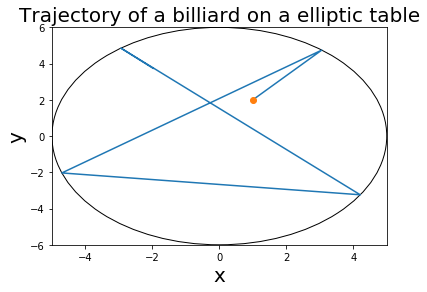

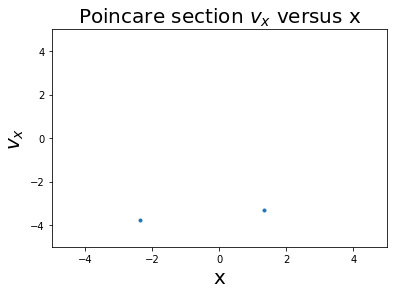

<Figure size 432x288 with 0 Axes>

In [28]:
my_plot()

Veuillez saisir les coordonnées horizontales et verticales x, y de la position initiale de la balle, les composantes horizontale et verticale vx, vy de la vitesse initiale de la balle, les demi-axes a et b de la longueur de l'ellipse et la durée t du mouvement, séparés par des espaces:
0.707106781 2 3 0 20 2.5 100

Les vitesses partielles horizontale et verticale de la balle sont respectivement： 3.0 0.0
Les demi-axes du mur de collision elliptique sont： 20.0 2.5
La durée totale de l'exercice est： 100.0
La distance totale parcourue est： 300.0


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


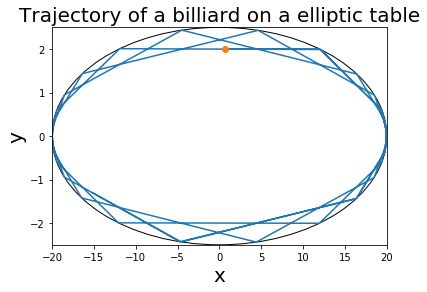

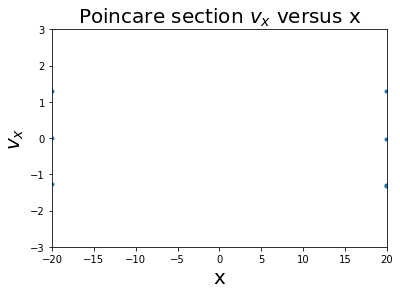

<Figure size 432x288 with 0 Axes>

In [12]:
my_plot()

Veuillez saisir les coordonnées horizontales et verticales x, y de la position initiale de la balle, les composantes horizontale et verticale vx, vy de la vitesse initiale de la balle, les demi-axes a et b de la longueur de l'ellipse et la durée t du mouvement, séparés par des espaces:
0.9 2 3 0 20 2.5 5000

Les vitesses partielles horizontale et verticale de la balle sont respectivement： 3.0 0.0
Les demi-axes du mur de collision elliptique sont： 20.0 2.5
La durée totale de l'exercice est： 5000.0
La distance totale parcourue est： 15000.0


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


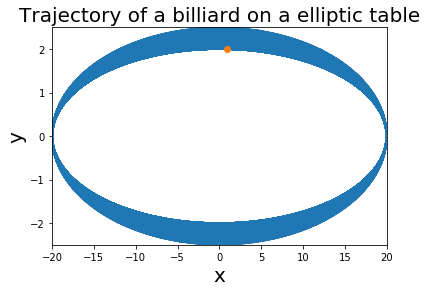

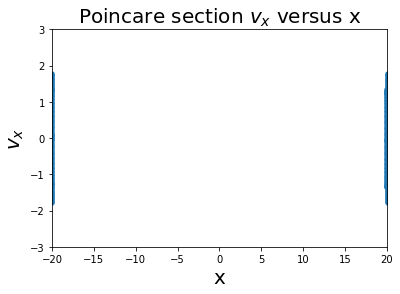

<Figure size 432x288 with 0 Axes>

In [26]:
my_plot()

Veuillez saisir les coordonnées horizontales et verticales x, y de la position initiale de la balle, les composantes horizontale et verticale vx, vy de la vitesse initiale de la balle, les demi-axes a et b de la longueur de l'ellipse et la durée t du mouvement, séparés par des espaces:
0.5 0.1 1 1 2 1 100

Les vitesses partielles horizontale et verticale de la balle sont respectivement： 1.0 1.0
Les demi-axes du mur de collision elliptique sont： 2.0 1.0
La durée totale de l'exercice est： 100.0
La distance totale parcourue est： 141.4213562373095


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


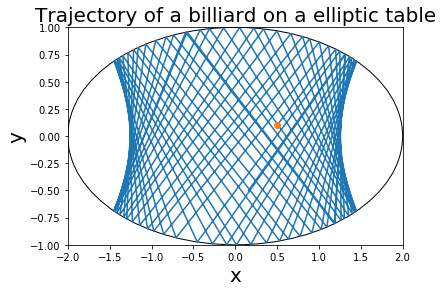

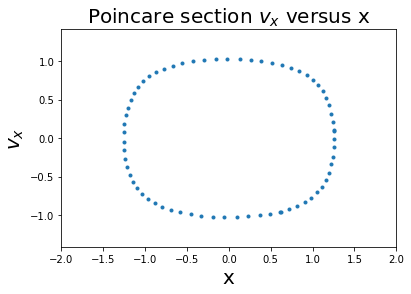

<Figure size 432x288 with 0 Axes>

In [52]:
my_plot()

Veuillez saisir les coordonnées horizontales et verticales x, y de la position initiale de la balle, les composantes horizontale et verticale vx, vy de la vitesse initiale de la balle, les demi-axes a et b de la longueur de l'ellipse et la durée t du mouvement, séparés par des espaces:
0.9 0.9 3 5 9 3 100

Les vitesses partielles horizontale et verticale de la balle sont respectivement： 3.0 5.0
Les demi-axes du mur de collision elliptique sont： 9.0 3.0
La durée totale de l'exercice est： 100.0
La distance totale parcourue est： 583.0951894845301


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


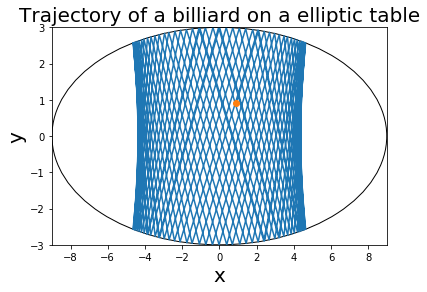

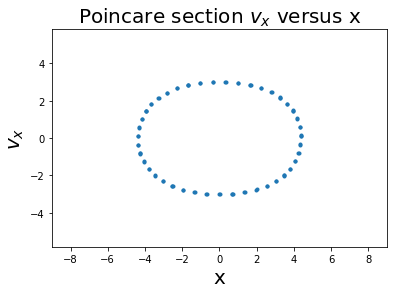

<Figure size 432x288 with 0 Axes>

In [53]:
my_plot()

Veuillez saisir les coordonnées horizontales et verticales x, y de la position initiale de la balle, les composantes horizontale et verticale vx, vy de la vitesse initiale de la balle, les demi-axes a et b de la longueur de l'ellipse et la durée t du mouvement, séparés par des espaces:
0 1 2 5 1 6 100

Les vitesses partielles horizontale et verticale de la balle sont respectivement： 2.0 5.0
Les demi-axes du mur de collision elliptique sont： 1.0 6.0
La durée totale de l'exercice est： 100.0
La distance totale parcourue est： 538.5164807134504


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


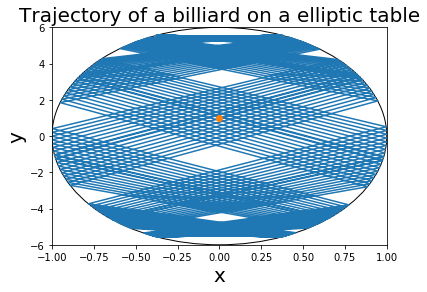

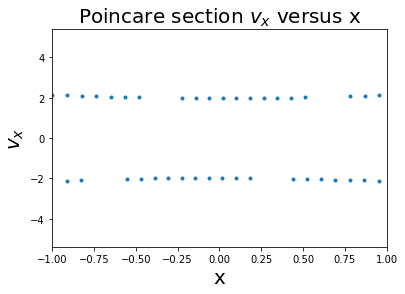

<Figure size 432x288 with 0 Axes>

In [54]:
my_plot()

Veuillez saisir les coordonnées horizontales et verticales x, y de la position initiale de la balle, les composantes horizontale et verticale vx, vy de la vitesse initiale de la balle, les demi-axes a et b de la longueur de l'ellipse et la durée t du mouvement, séparés par des espaces:
0.707106781 1.414213562 2 2 2 1.5 100

Les vitesses partielles horizontale et verticale de la balle sont respectivement： 2.0 2.0
Les demi-axes du mur de collision elliptique sont： 2.0 1.5
La durée totale de l'exercice est： 100.0
La distance totale parcourue est： 282.842712474619


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


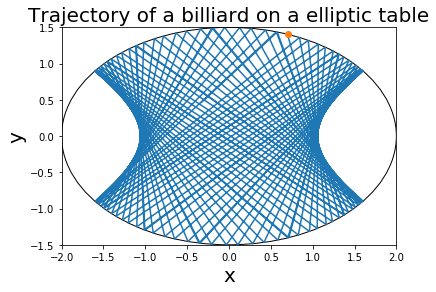

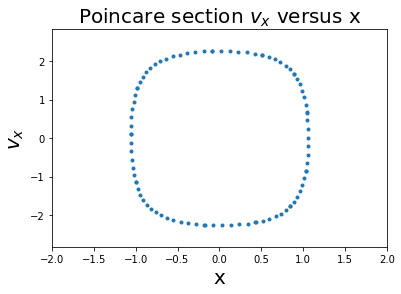

<Figure size 432x288 with 0 Axes>

In [72]:
my_plot()


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 1 1
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 141.4213562373095


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

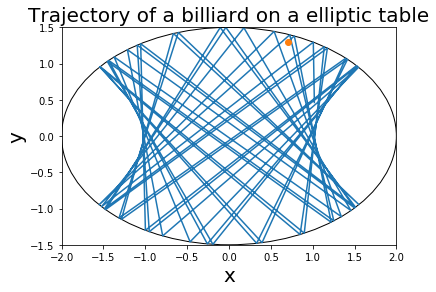

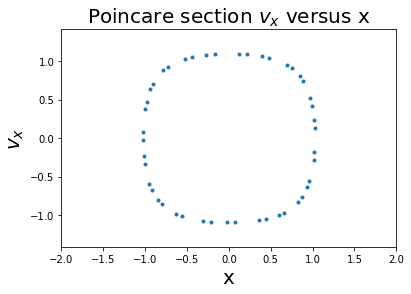


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 1 2
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 223.60679774997897


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

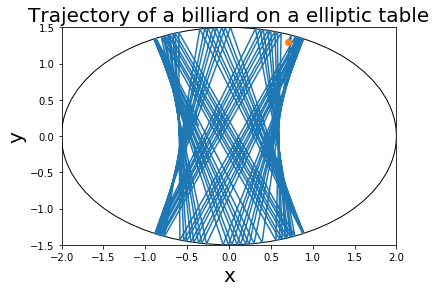

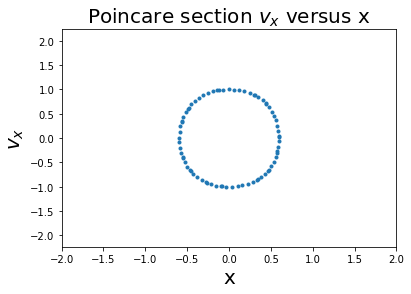


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 1 3
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 316.22776601683796


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

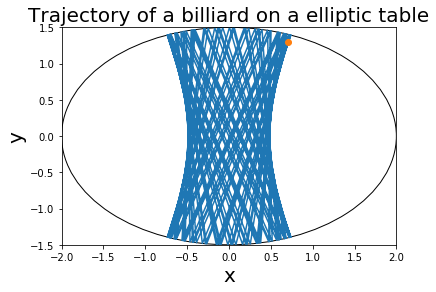

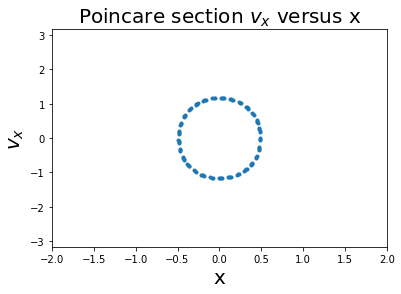


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 1 4
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 412.31056256176606


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

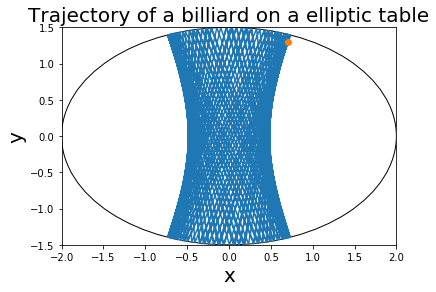

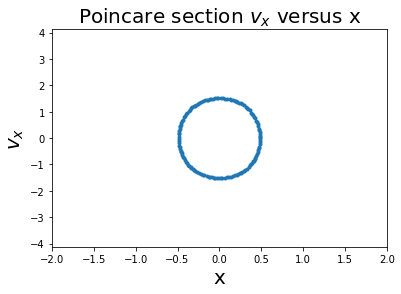


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 1 5
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 509.9019513592784


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

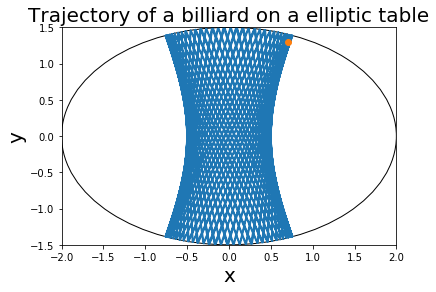

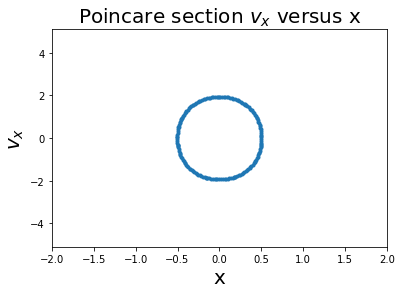


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 1 6
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 608.276253029822


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

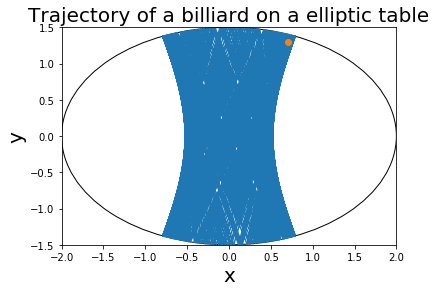

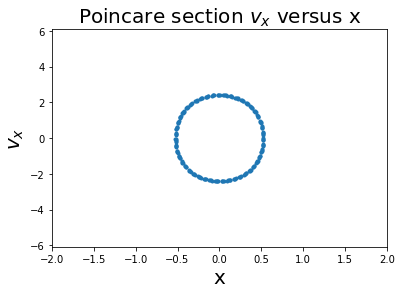


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 1 7
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 707.1067811865476


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

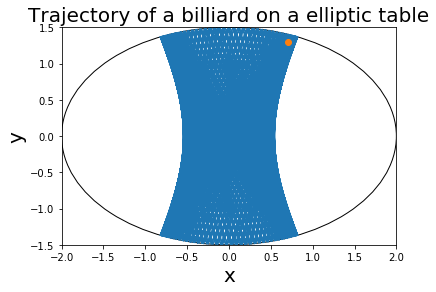

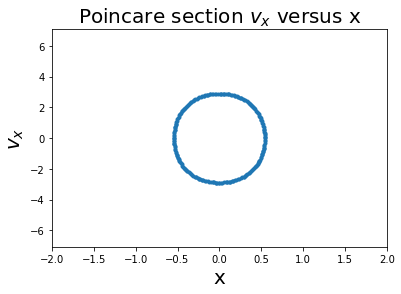


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 1 8
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 806.2257748298549


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

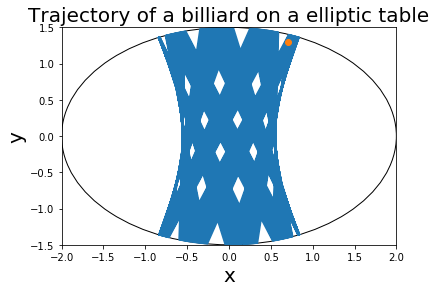

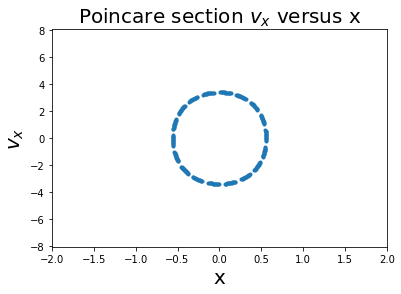


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 1 9
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 905.5385138137417


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

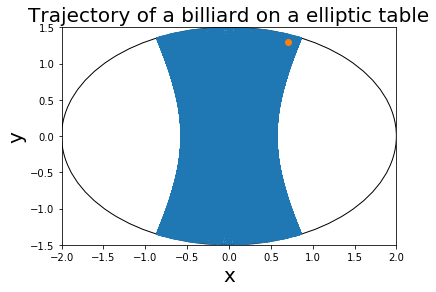

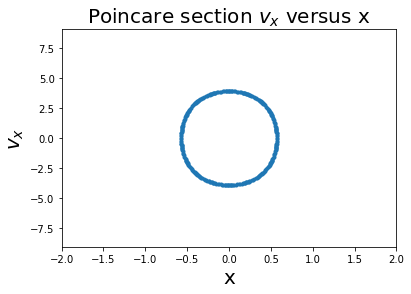


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 1 10
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 1004.987562112089


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

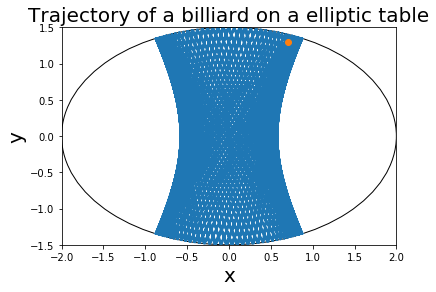

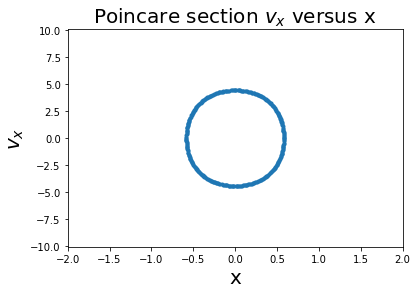


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 1 11
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 1104.536101718726


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

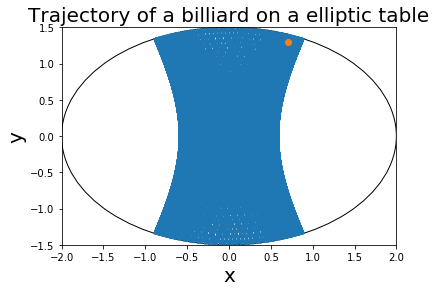

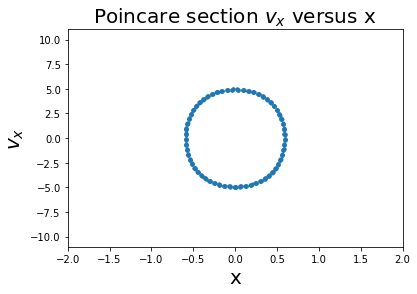


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 1 12
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 1204.1594578792296


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

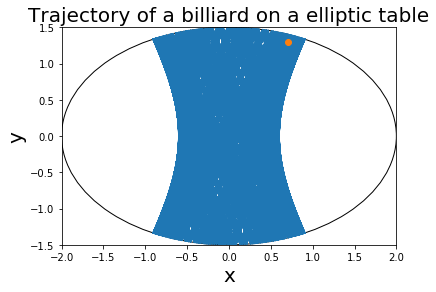

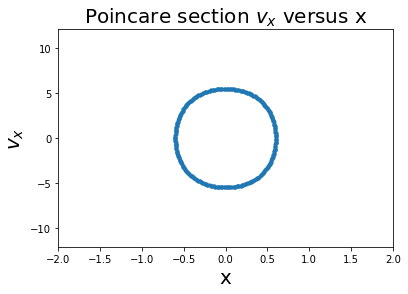


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 1 13
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 1303.8404810405298


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

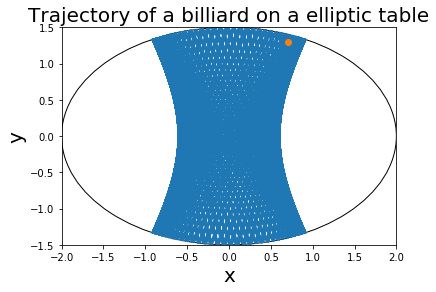

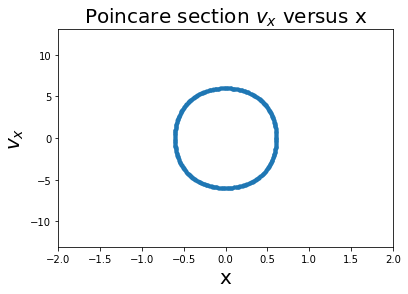


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 1 14
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 1403.56688476182


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

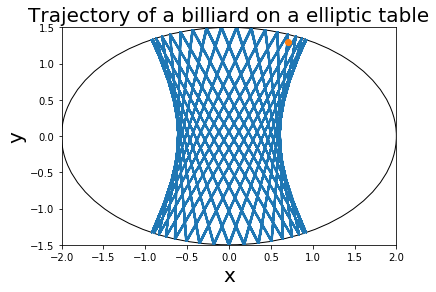

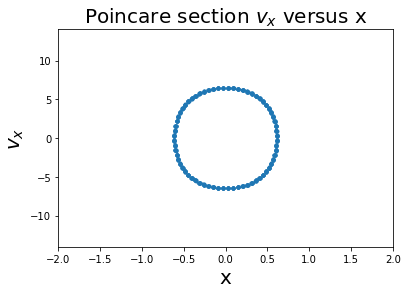


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 1 15
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 1503.3296378372909


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

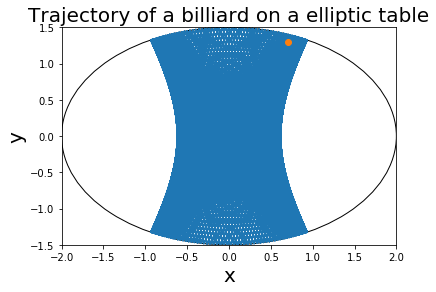

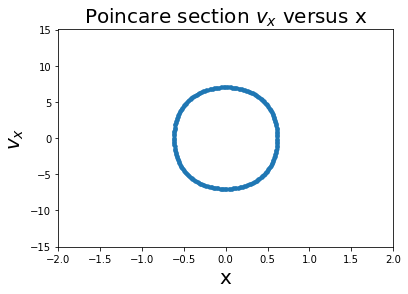


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 1 16
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 1603.1219541881399


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

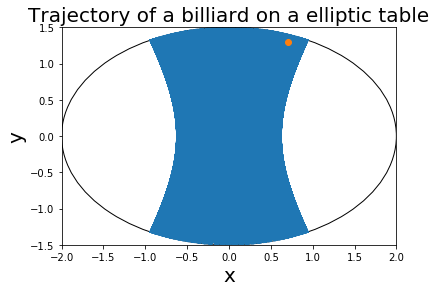

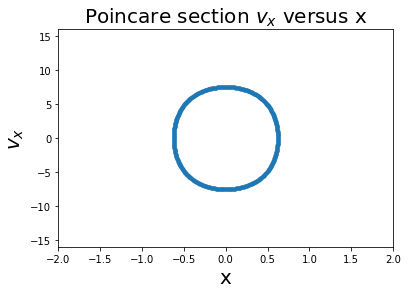


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 1 17
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 1702.9386365926403


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

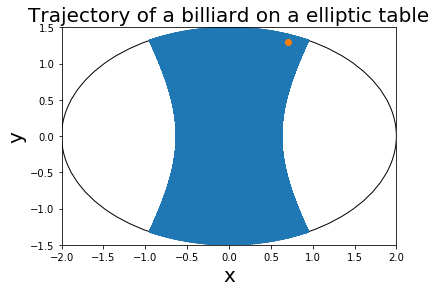

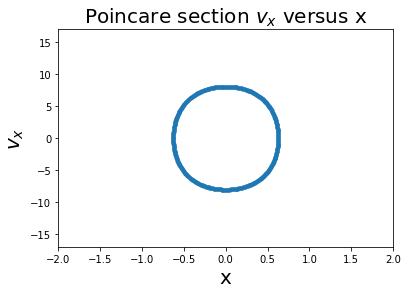


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 1 18
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 1802.7756377319947


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

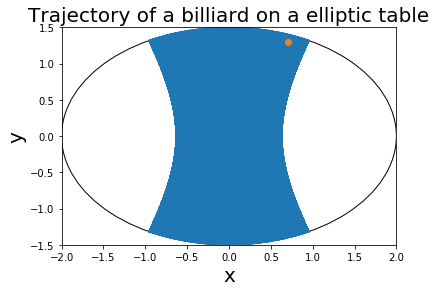

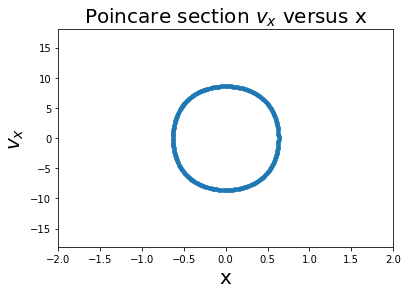


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 1 19
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 1902.6297590440447


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

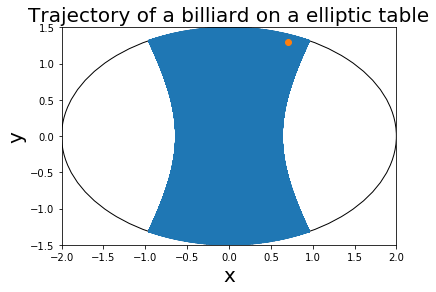

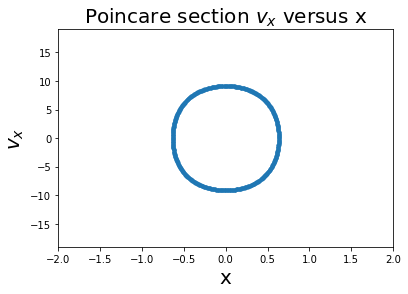


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 1 20
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 2002.4984394500786


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

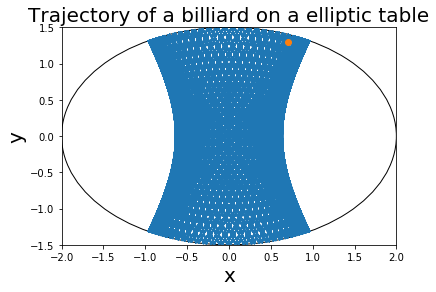

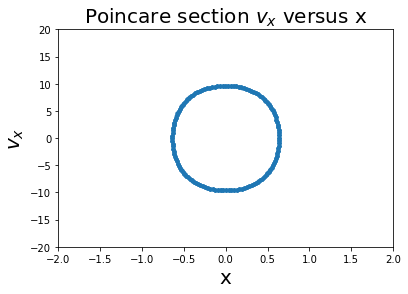


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 1 21
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 2102.379604162864


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

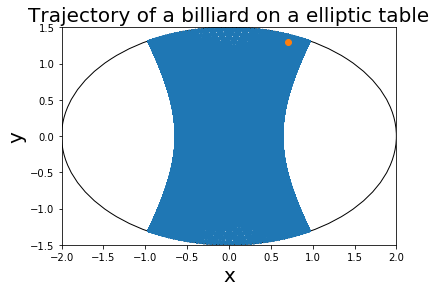

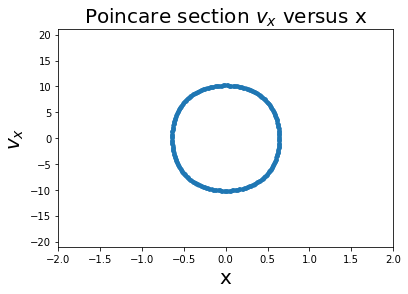


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 1 22
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 2202.271554554524


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

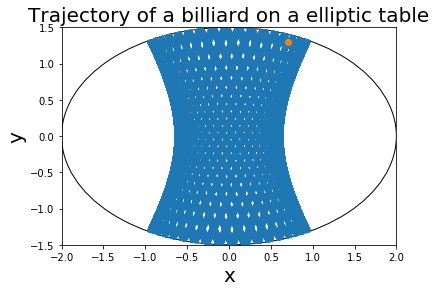

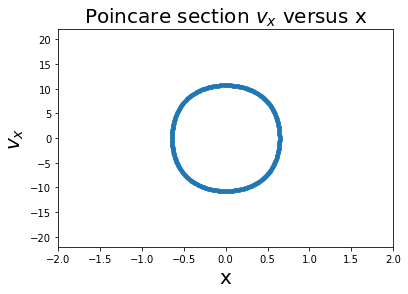


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 1 23
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 2302.1728866442677


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

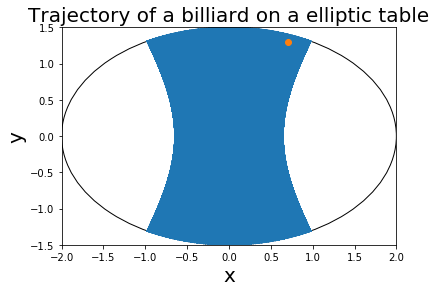

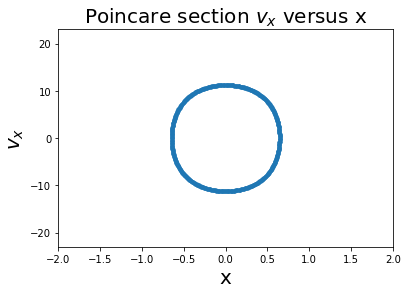


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 1 24
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 2402.082429892863


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

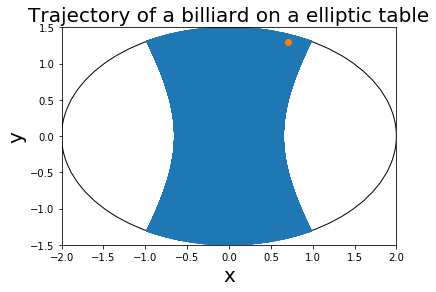

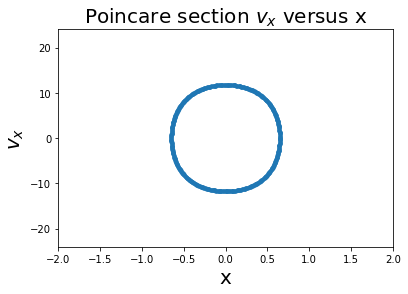


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 1 25
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 2501.999200639361


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

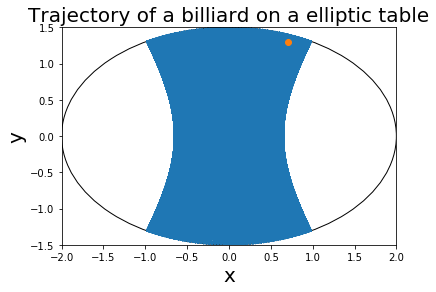

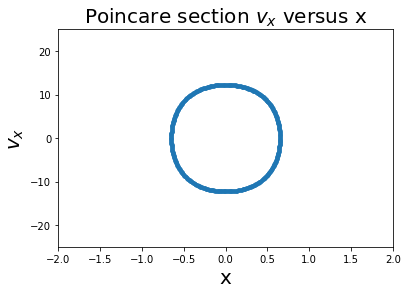


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 1 26
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 2601.922366251538


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

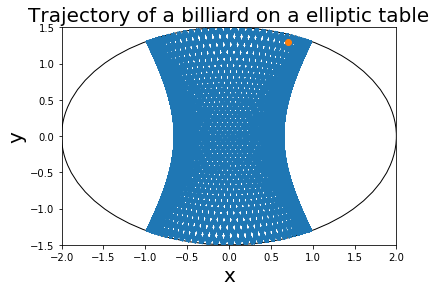

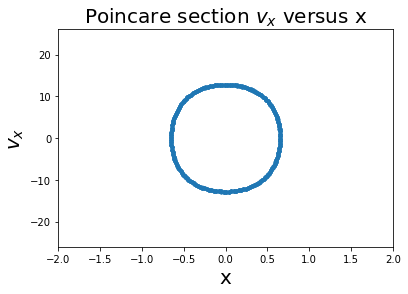


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 1 27
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 2701.851217221259


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

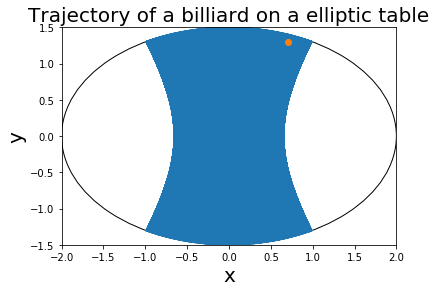

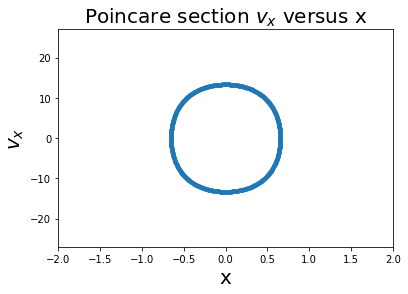


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 1 28
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 2801.78514522438


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

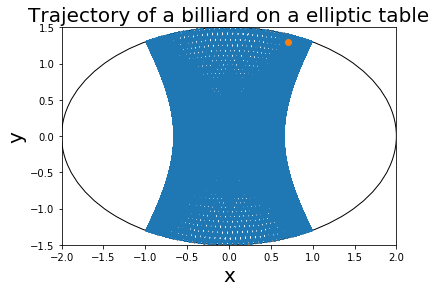

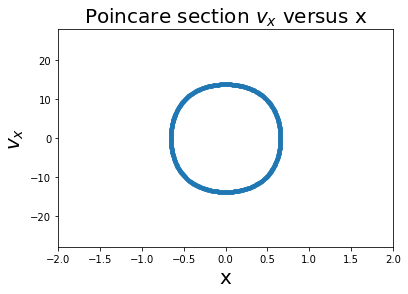


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 1 29
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 2901.723625709382


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

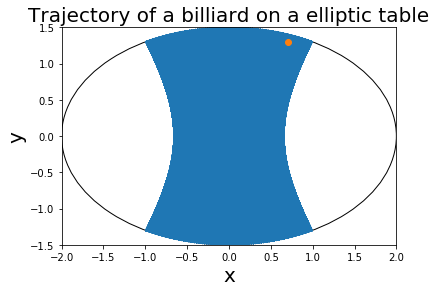

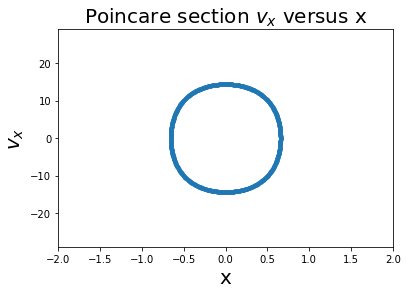


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 1 30
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 3001.6662039607268


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

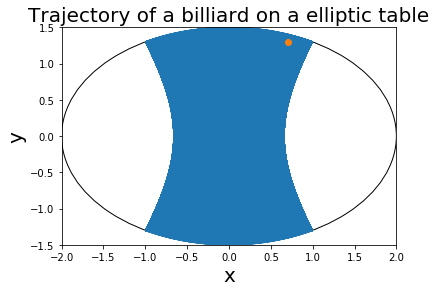

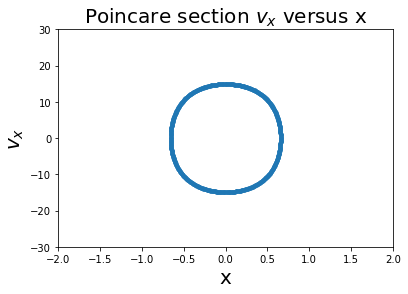


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 1 31
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 3101.6124838541646


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

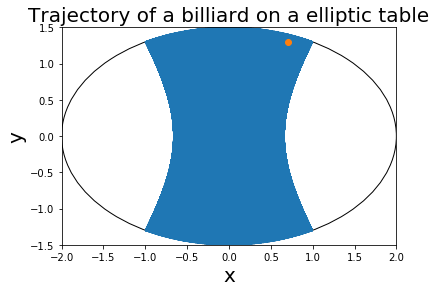

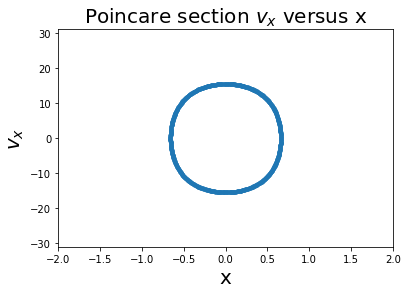


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 1 32
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 3201.5621187164243


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

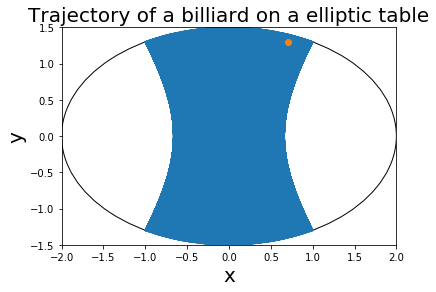

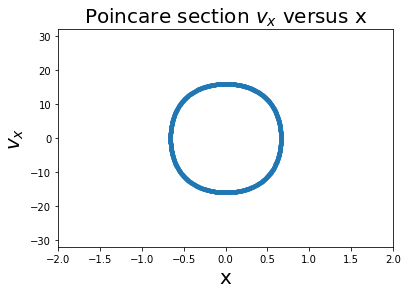


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 1 33
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 3301.5148038438356


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

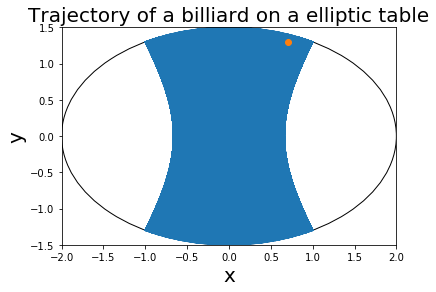

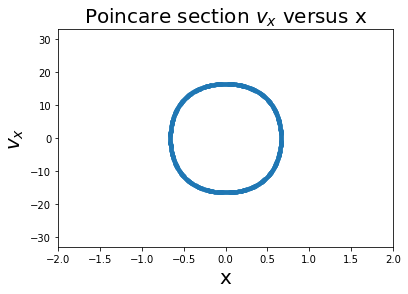


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 1 34
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 3401.4702703389903


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

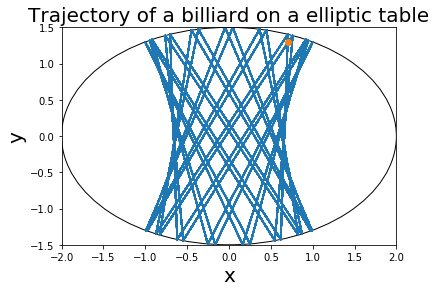

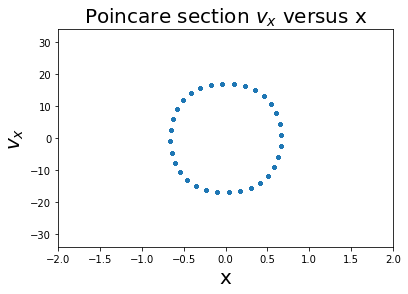


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 1 35
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 3501.4282800023198


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

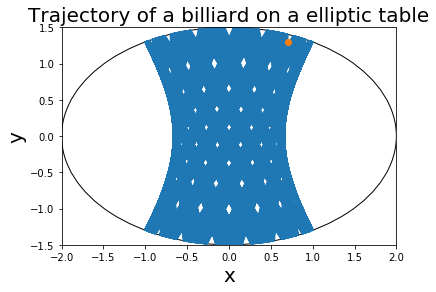

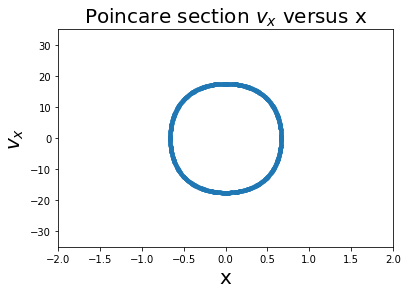


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 1 36
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 3601.3886210738215


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

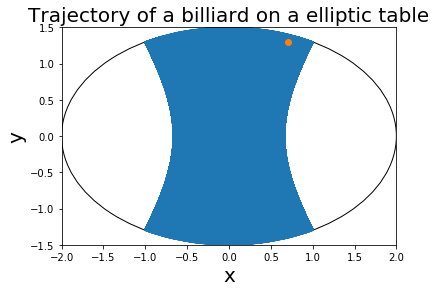

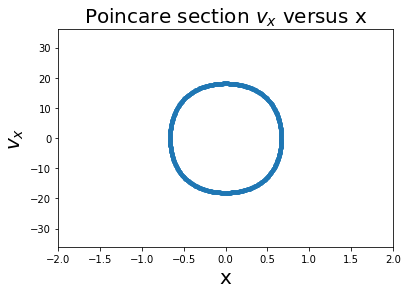


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 1 37
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 3701.3511046643494


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

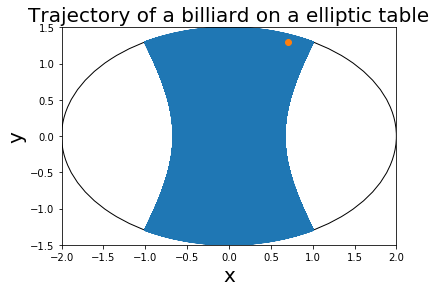

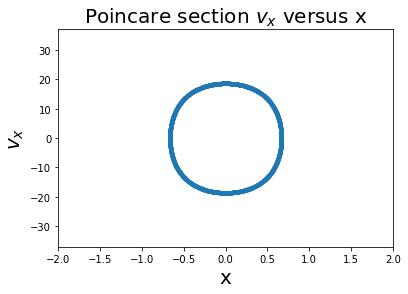


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 1 38
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 3801.3155617496423


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

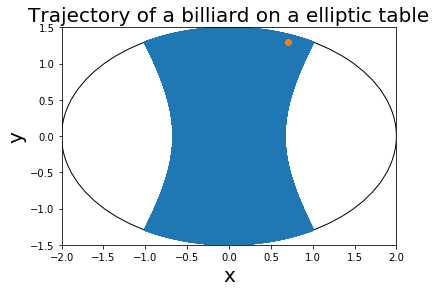

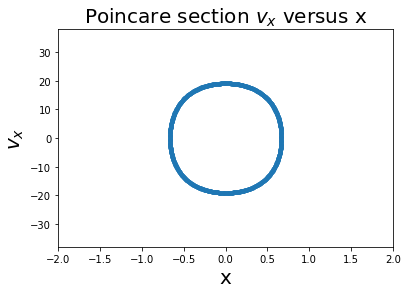


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 1 39
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 3901.2818406262318


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

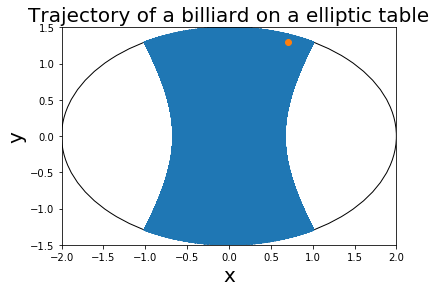

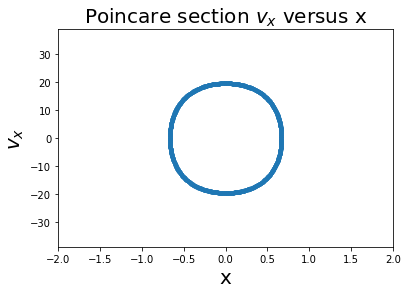


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 1 40
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 4001.249804748511


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

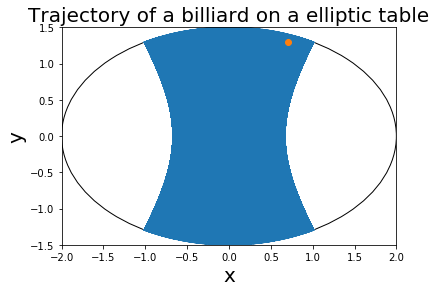

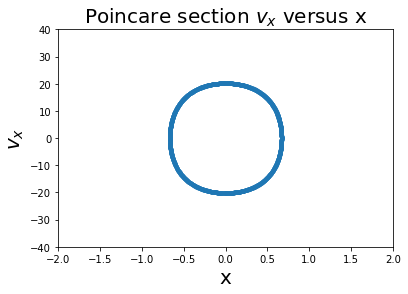


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 1 41
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 4101.219330881975


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

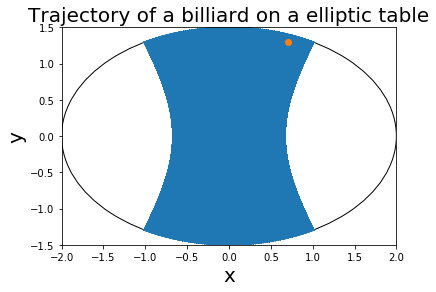

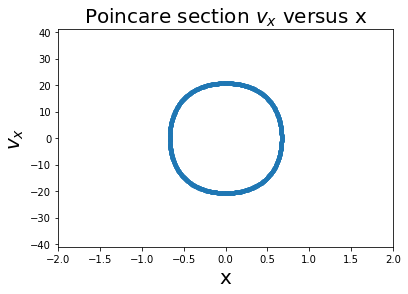


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 1 42
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 4201.190307520001


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

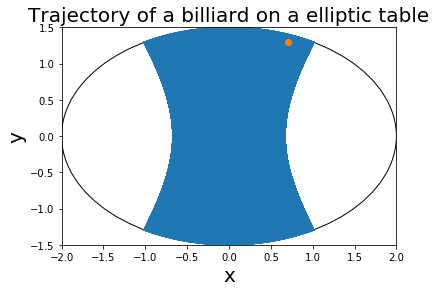

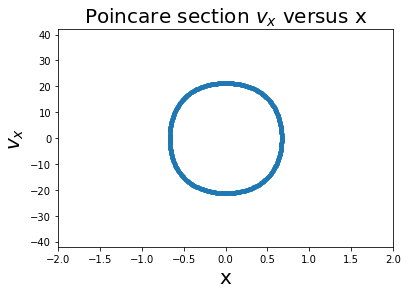


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 1 43
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 4301.162633521314


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

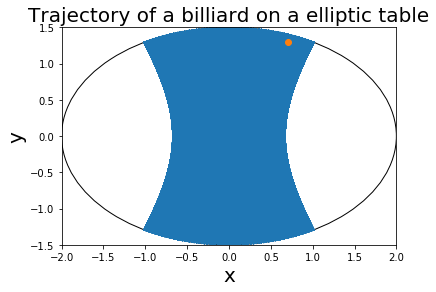

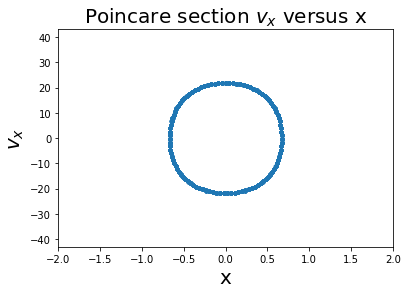


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 1 44
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 4401.136216933078


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

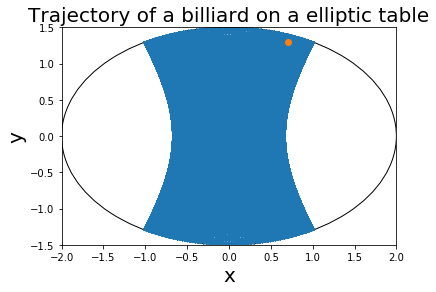

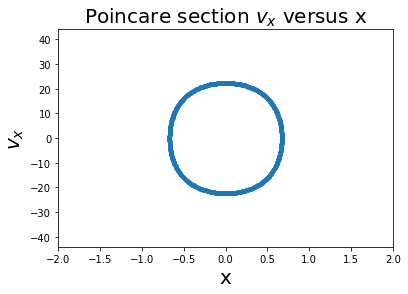


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 1 45
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 4501.11097397076


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

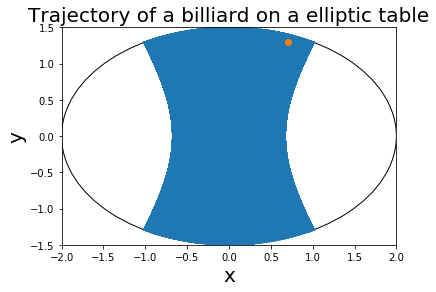

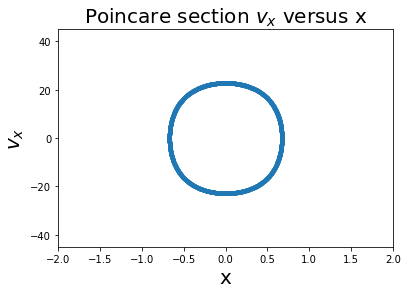


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 1 46
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 4601.086828130937


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

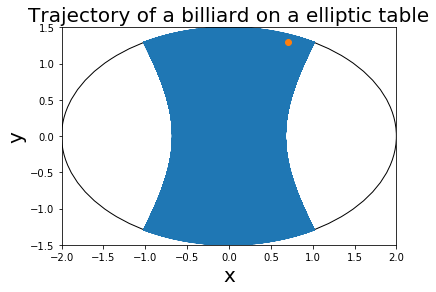

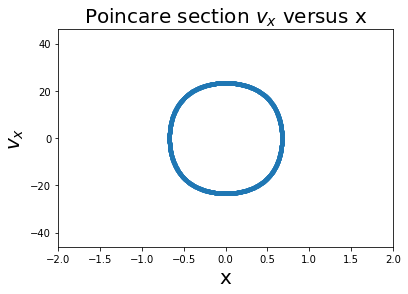


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 1 47
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 4701.063709417263


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

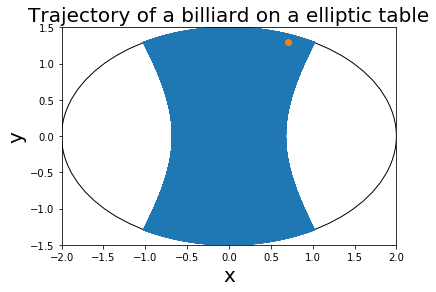

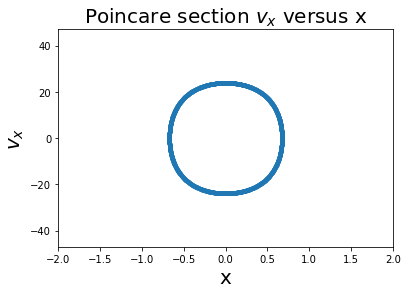


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 1 48
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 4801.041553663122


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

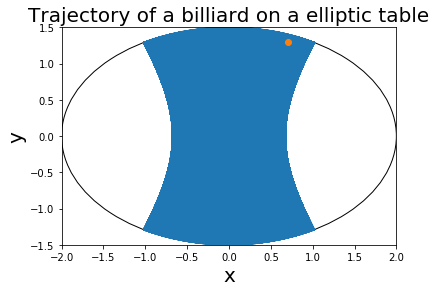

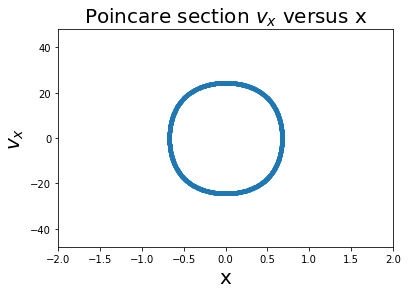


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 1 49
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 4901.020301937138


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

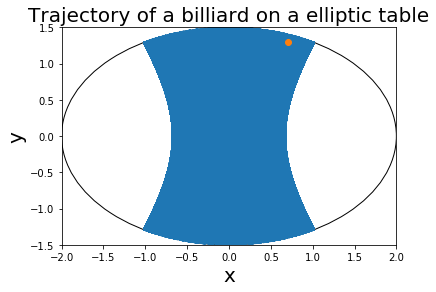

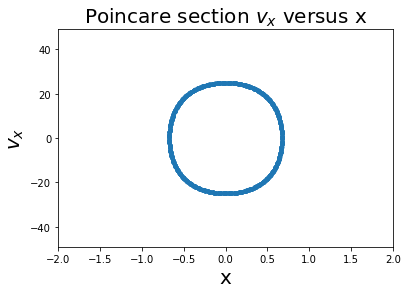


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 2 1
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 223.60679774997897


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

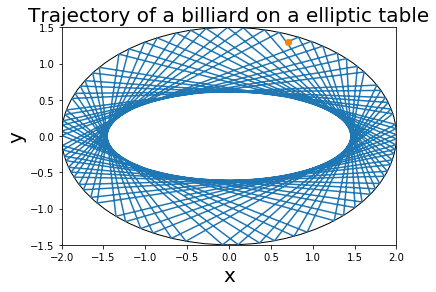

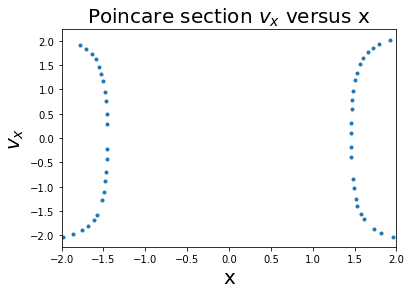


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 2 2
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 282.842712474619


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

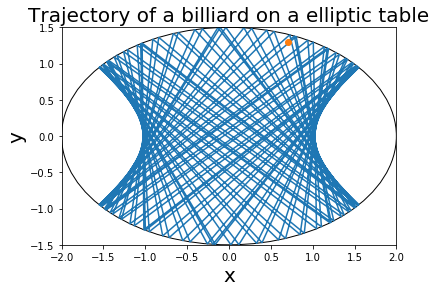

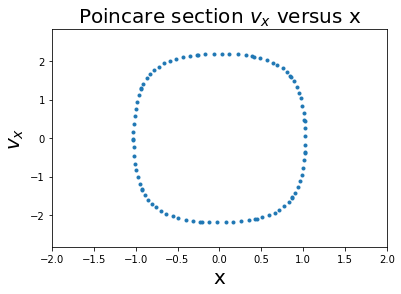


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 2 3
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 360.5551275463989


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

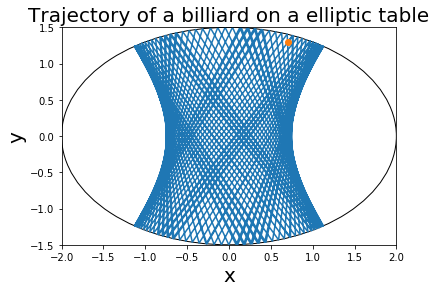

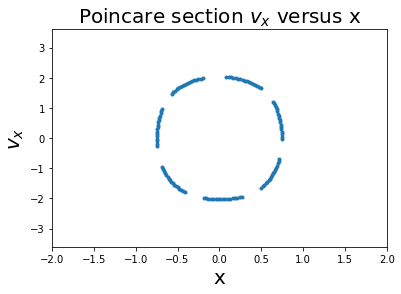


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 2 4
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 447.21359549995793


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

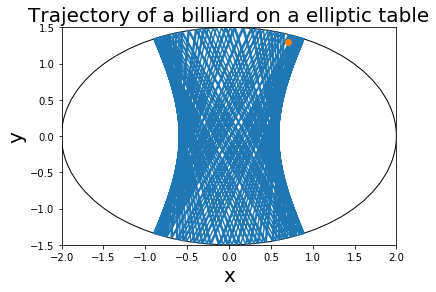

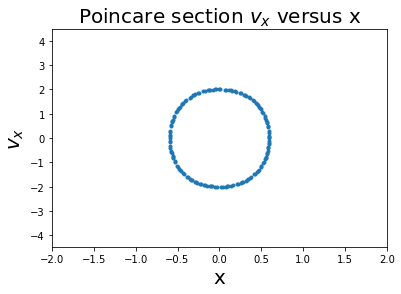


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 2 5
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 538.5164807134504


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

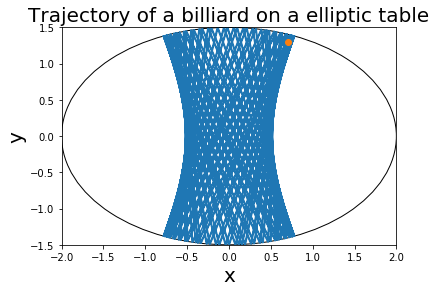

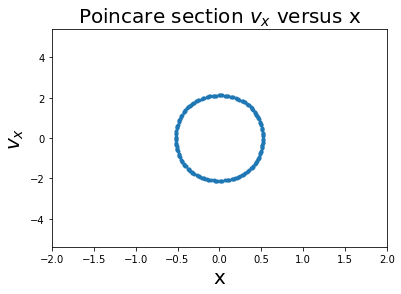


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 2 6
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 632.4555320336759


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

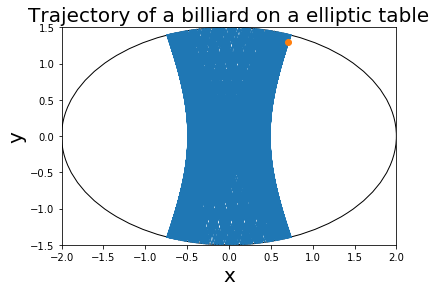

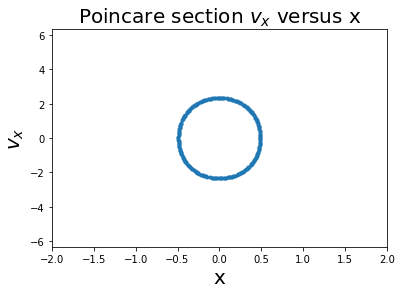


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 2 7
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 728.0109889280518


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

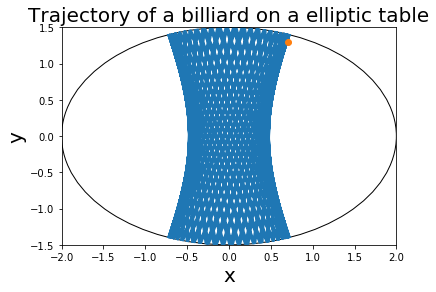

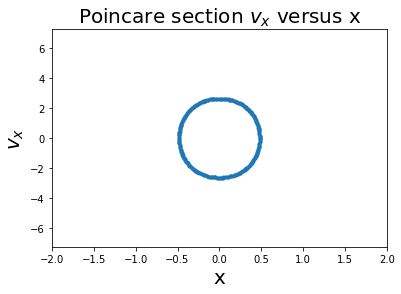


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 2 8
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 824.6211251235321


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

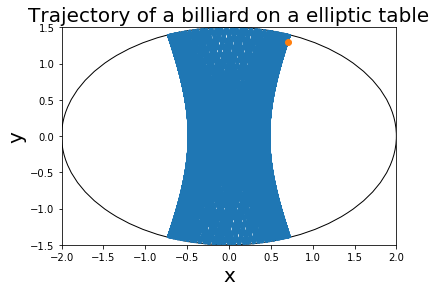

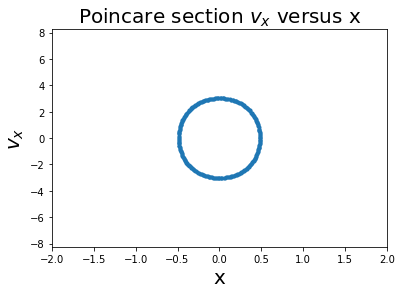


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 2 9
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 921.9544457292888


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

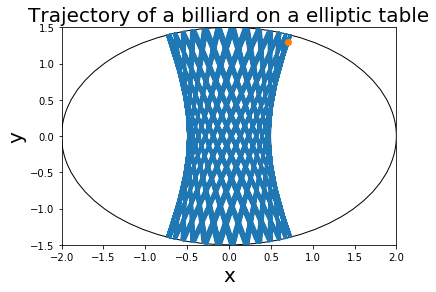

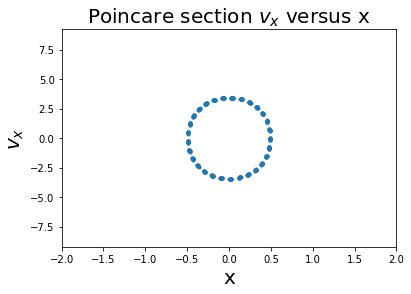


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 2 10
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 1019.8039027185569


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

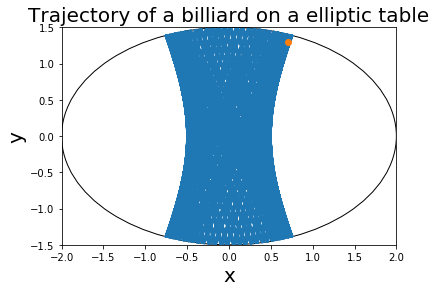

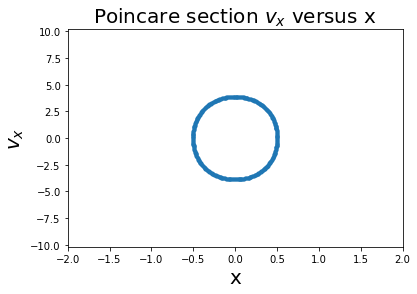


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 2 11
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 1118.033988749895


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

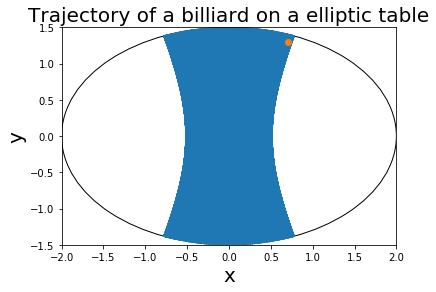

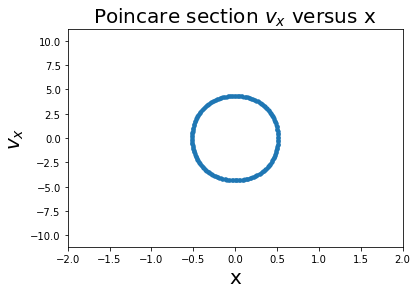


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 2 12
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 1216.552506059644


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

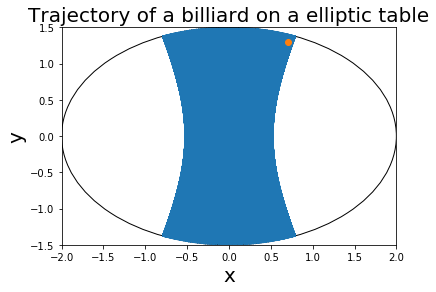

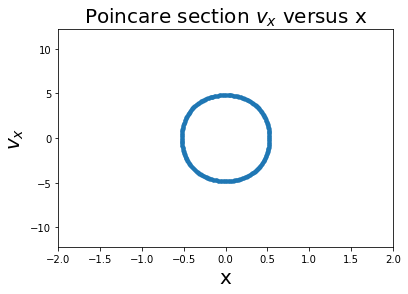


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 2 13
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 1315.2946437965904


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

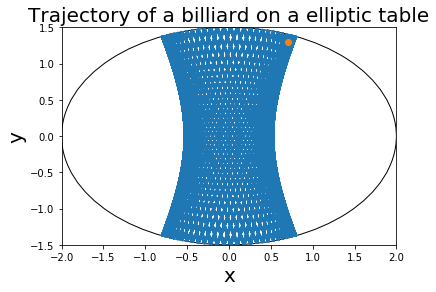

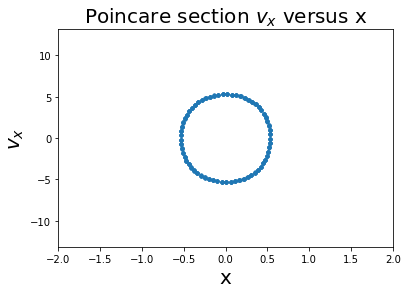


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 2 14
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 1414.213562373095


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

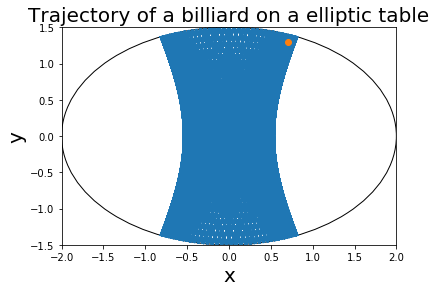

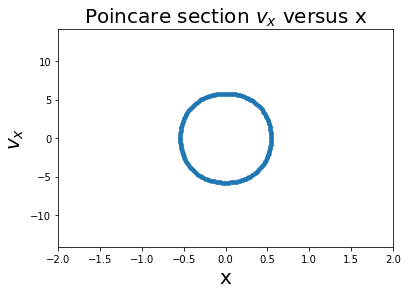


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 2 15
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 1513.2745950421556


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

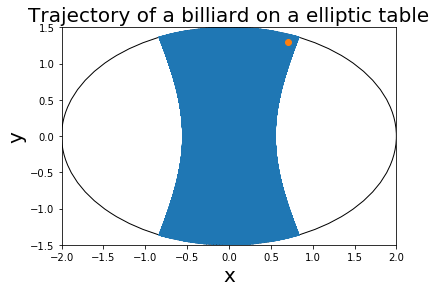

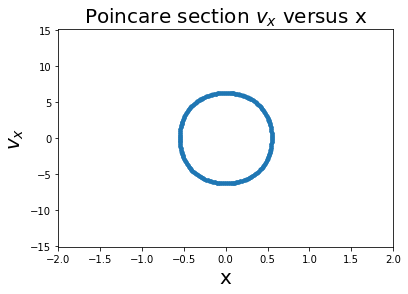


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 2 16
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 1612.4515496597098


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

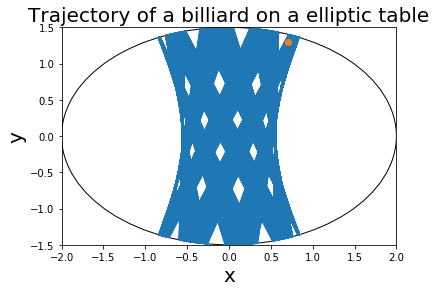

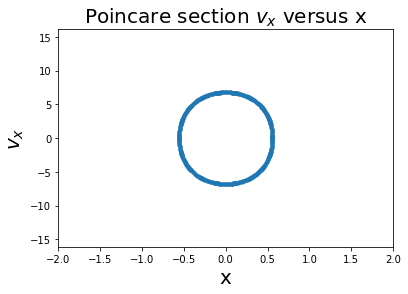


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 2 17
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 1711.724276862369


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

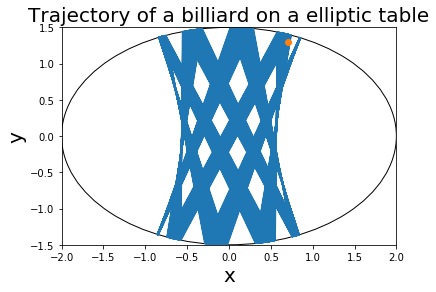

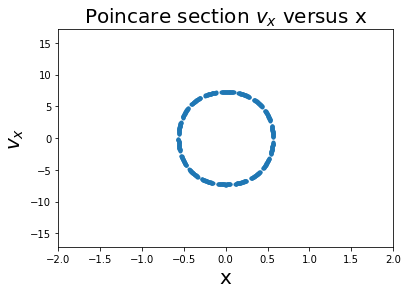


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 2 18
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 1811.0770276274834


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

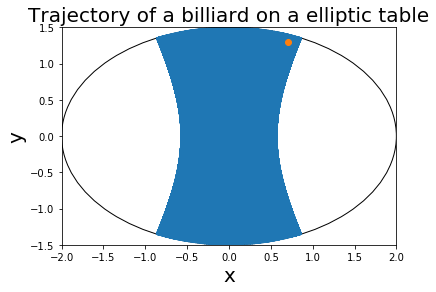

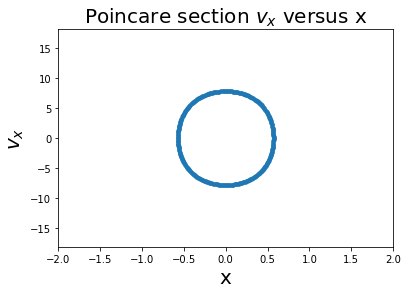


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 2 19
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 1910.49731745428


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

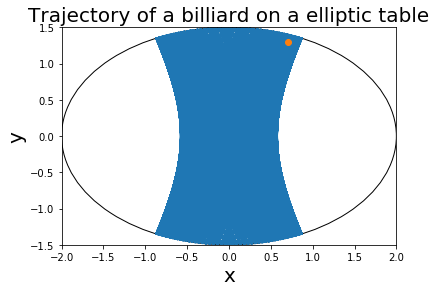

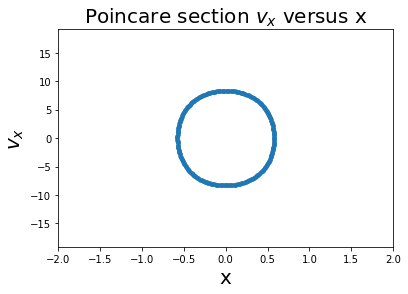


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 2 20
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 2009.975124224178


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

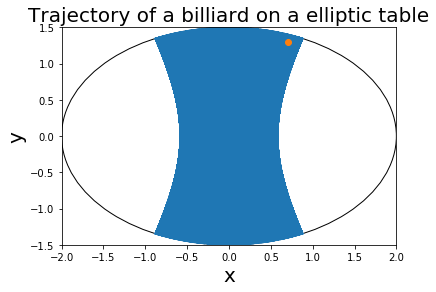

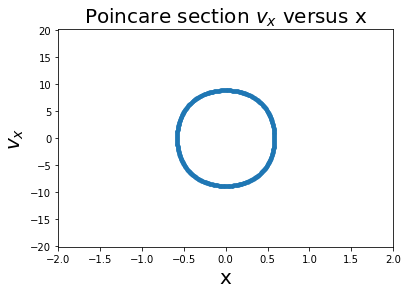


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 2 21
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 2109.5023109728986


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

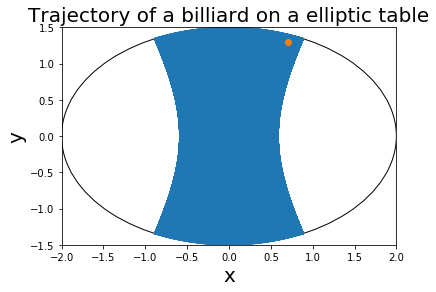

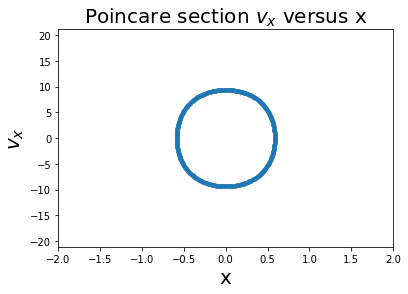


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 2 22
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 2209.072203437452


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

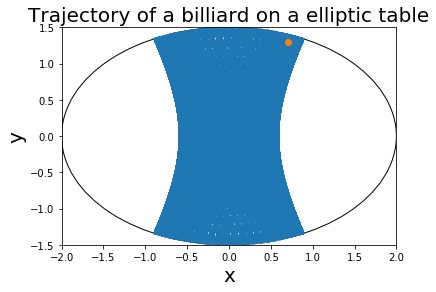

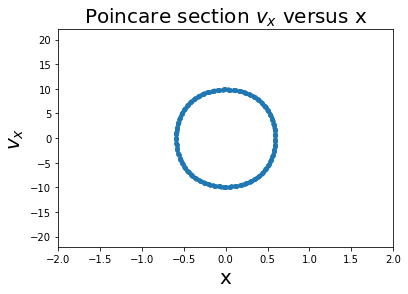


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 2 23
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 2308.679276123039


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

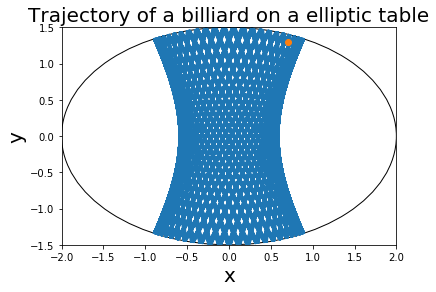

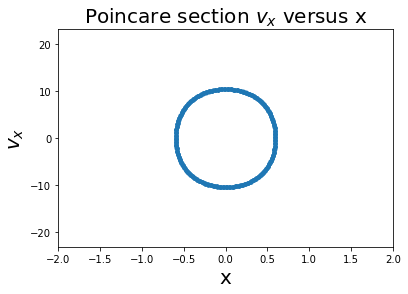


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 2 24
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 2408.3189157584593


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

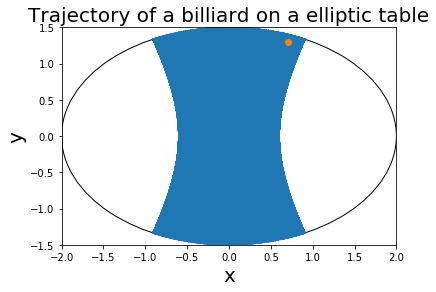

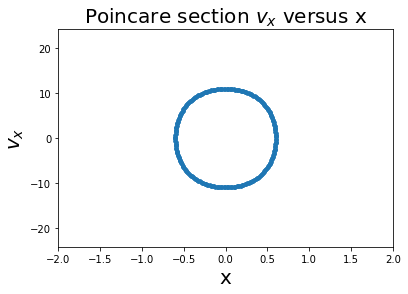


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 2 25
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 2507.9872407968905


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

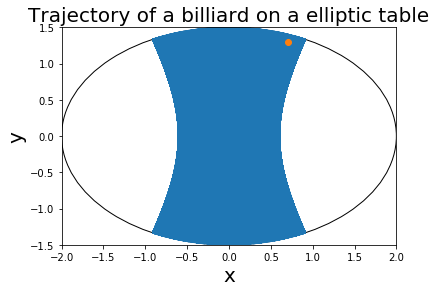

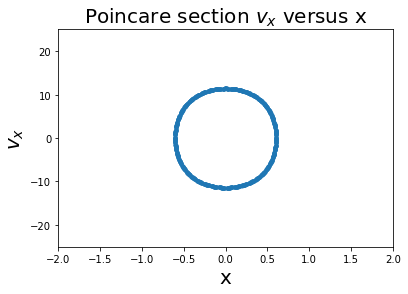


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 2 26
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 2607.6809620810595


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

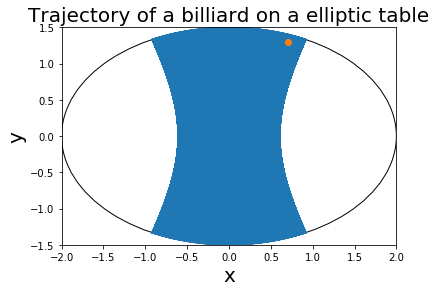

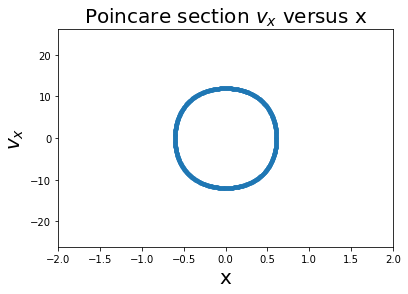


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 2 27
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 2707.3972741361767


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

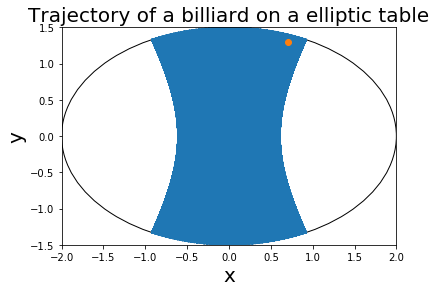

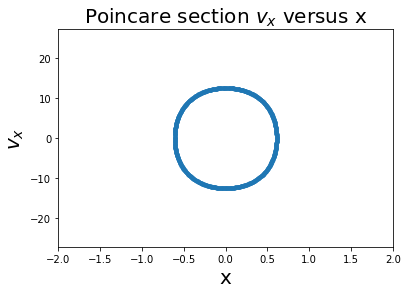


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 2 28
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 2807.13376952364


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

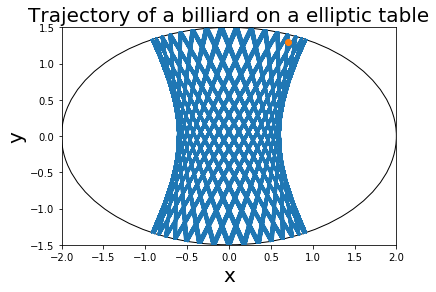

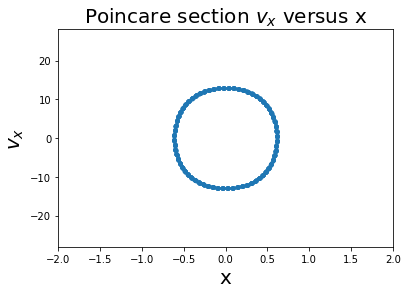


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 2 29
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 2906.8883707497266


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

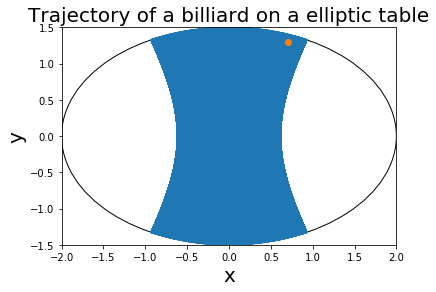

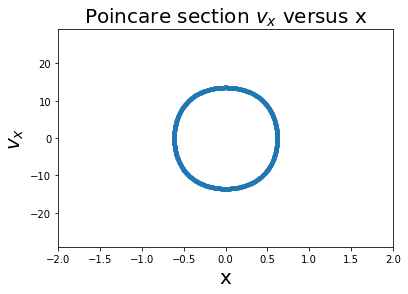


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 2 30
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 3006.6592756745817


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

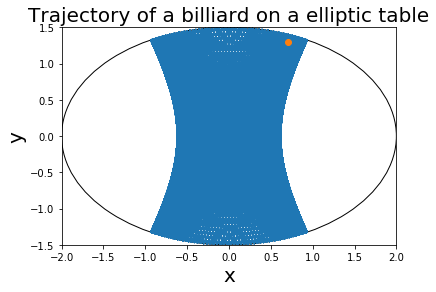

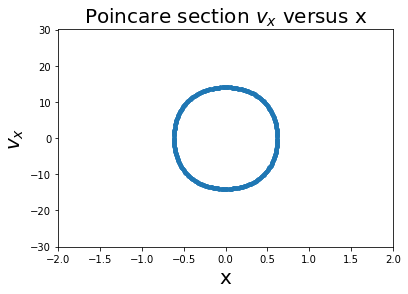


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 2 31
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 3106.444913401813


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

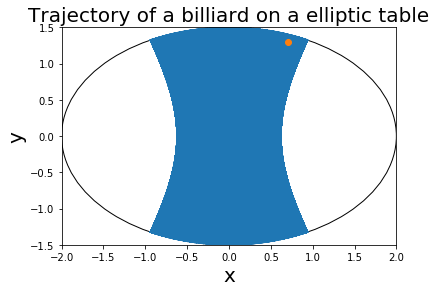

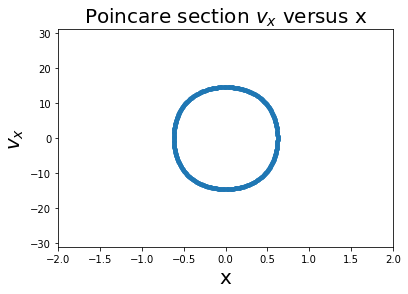


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 2 32
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 3206.2439083762797


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

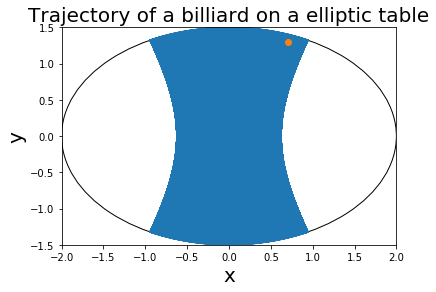

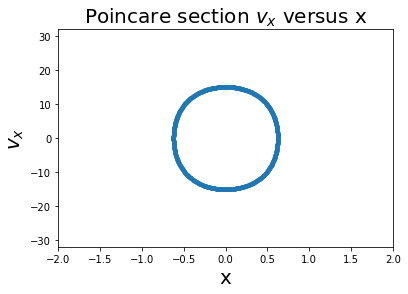


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 2 33
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 3306.055050963308


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

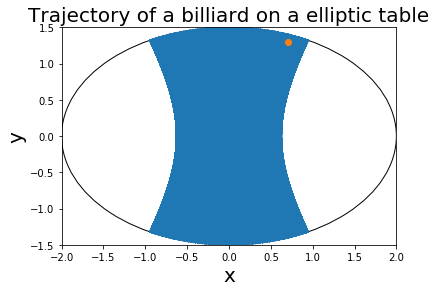

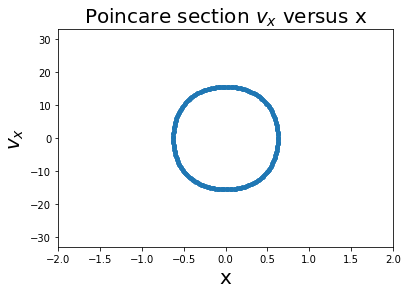


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 2 34
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 3405.8772731852805


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

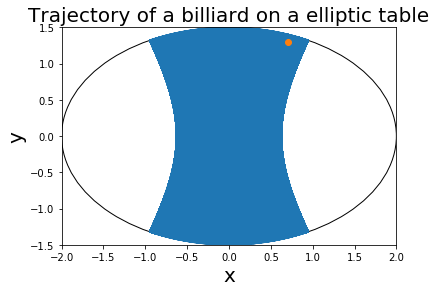

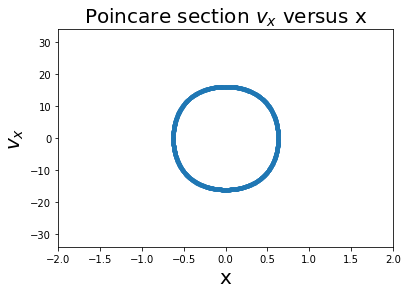


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 2 35
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 3505.709628591621


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

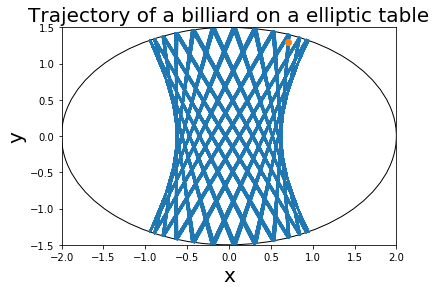

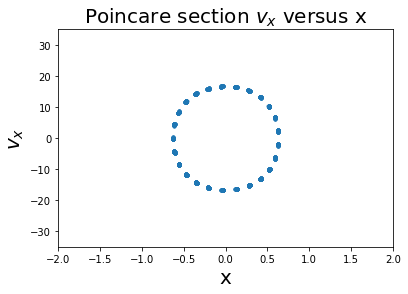


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 2 36
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 3605.5512754639894


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

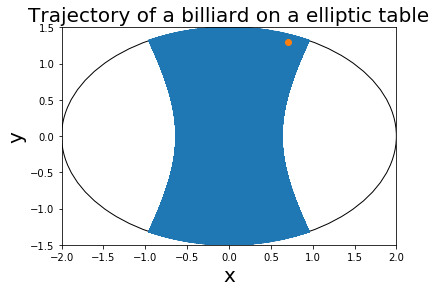

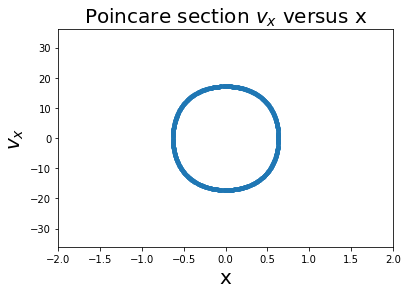


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 2 37
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 3705.401462729781


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

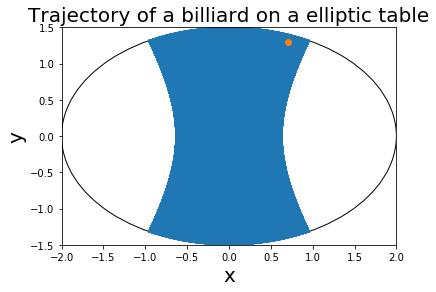

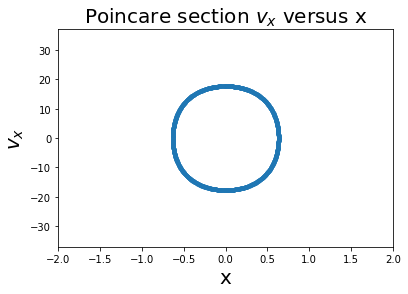


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 2 38
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 3805.2595180880894


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

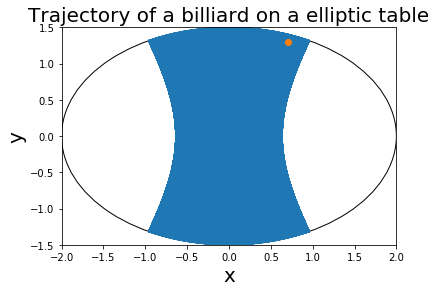

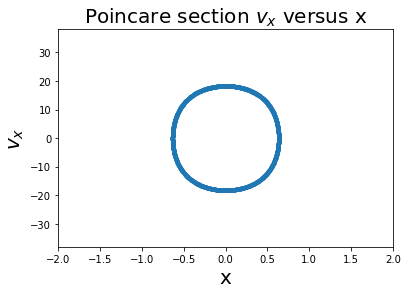


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 2 39
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 3905.124837953327


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

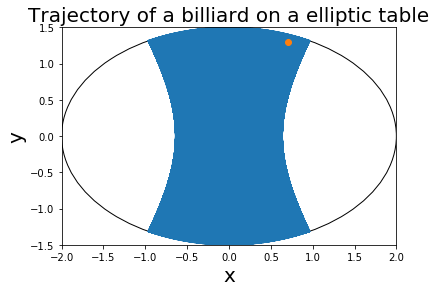

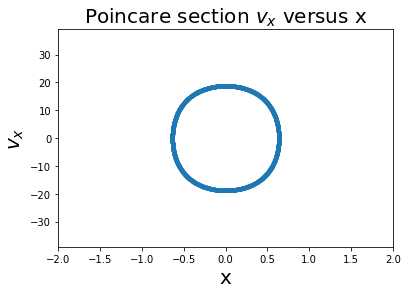


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 2 40
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 4004.9968789001573


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

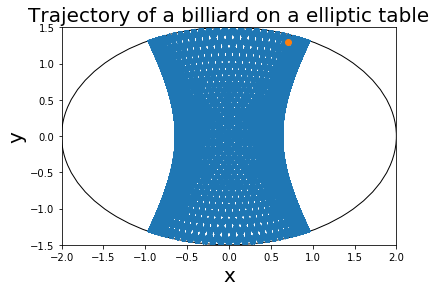

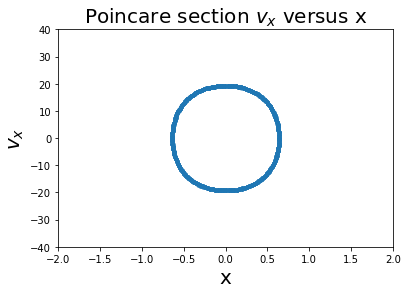


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 2 41
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 4104.875150354758


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

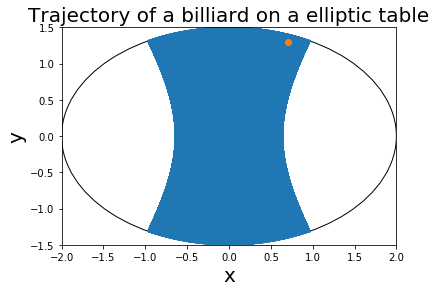

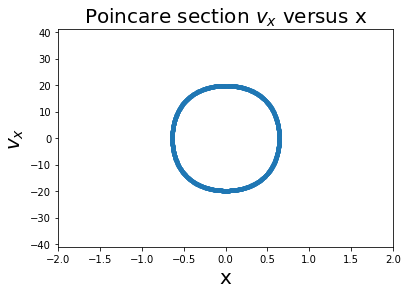


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 2 42
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 4204.759208325728


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

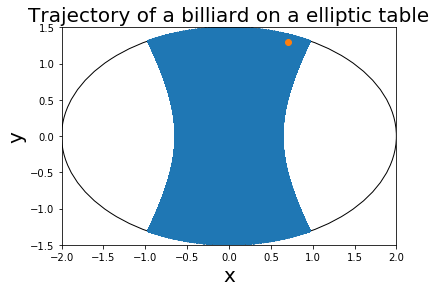

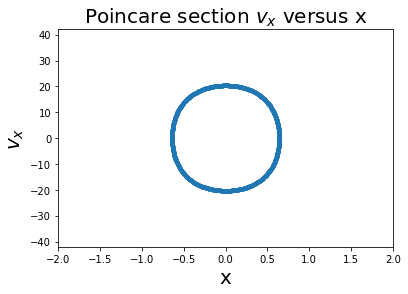


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 2 43
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 4304.6486500061765


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

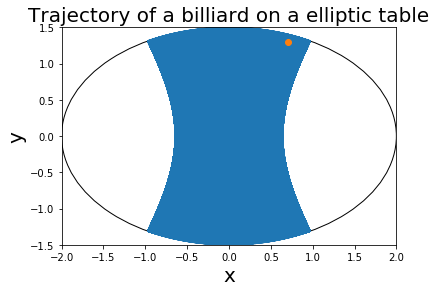

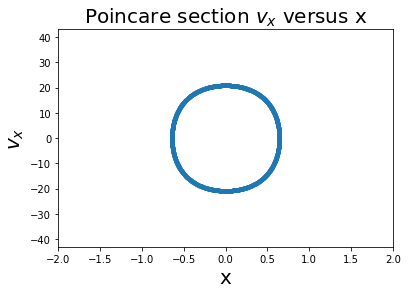


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 2 44
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 4404.543109109048


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

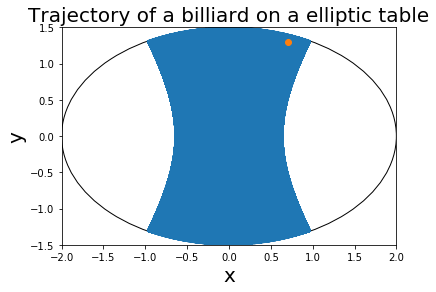

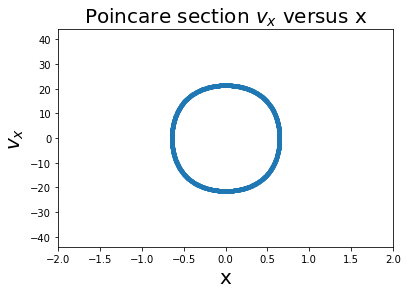


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 2 45
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 4504.442251822084


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

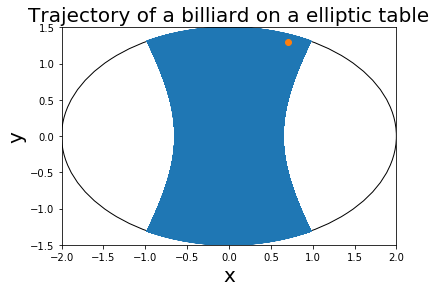

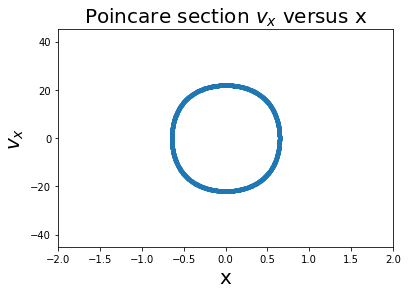


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 2 46
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 4604.345773288535


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

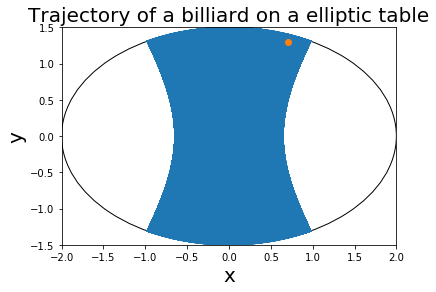

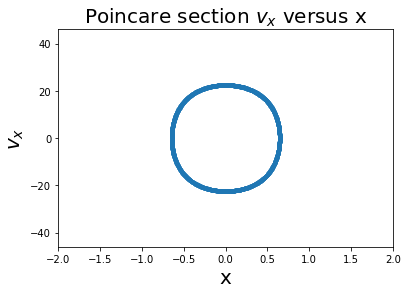


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 2 47
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 4704.253394535631


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

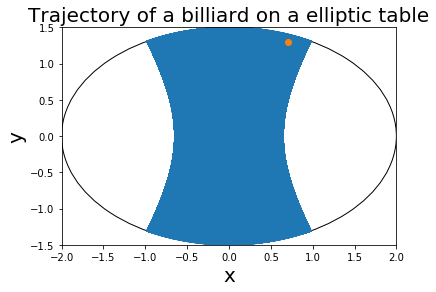

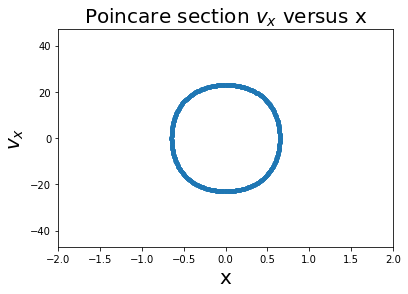


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 2 48
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 4804.164859785726


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

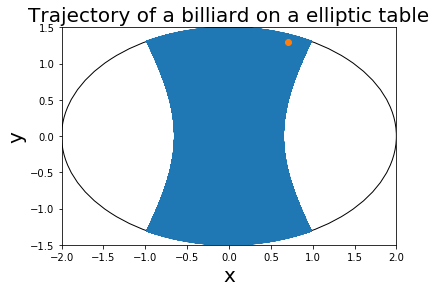

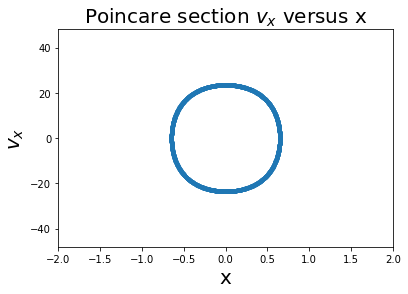


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 2 49
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 4904.079934095692


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

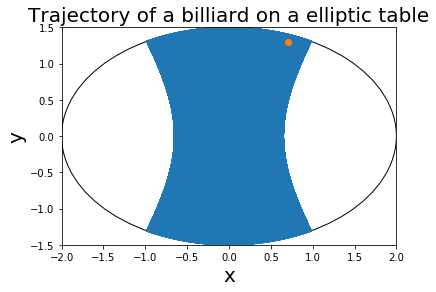

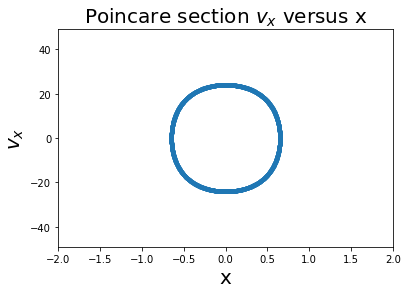


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 3 1
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 316.22776601683796


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

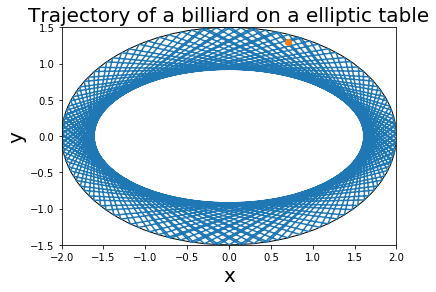

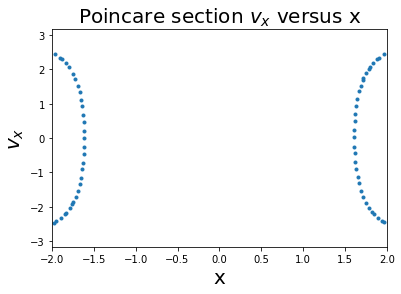


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 3 2
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 360.5551275463989


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

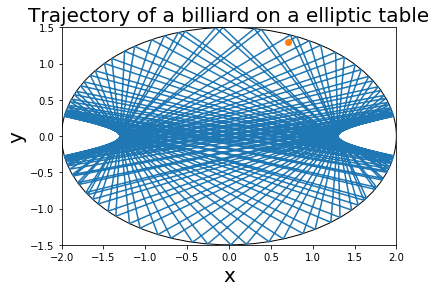

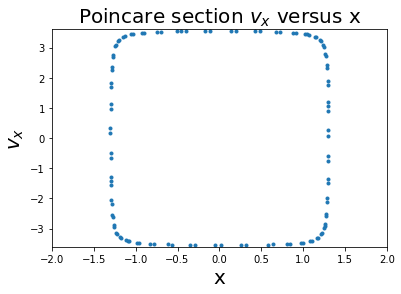


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 3 3
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 424.2640687119285


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

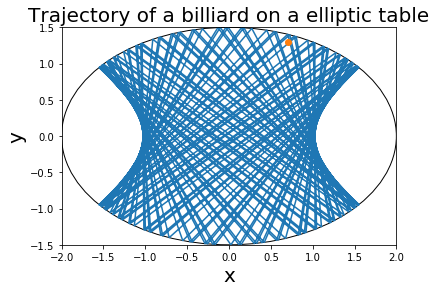

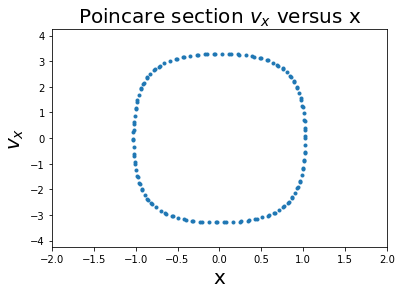


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 3 4
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 500.0


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

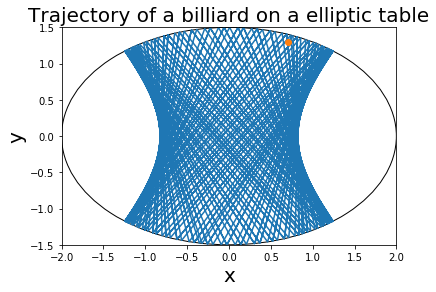

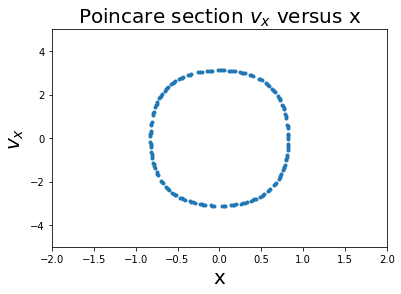


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 3 5
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 583.0951894845301


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

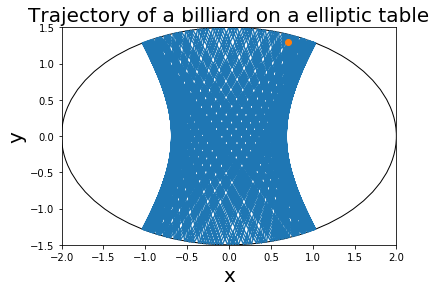

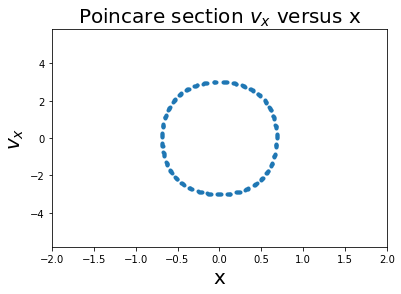


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 3 6
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 670.820393249937


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

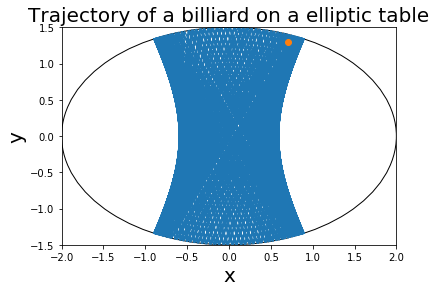

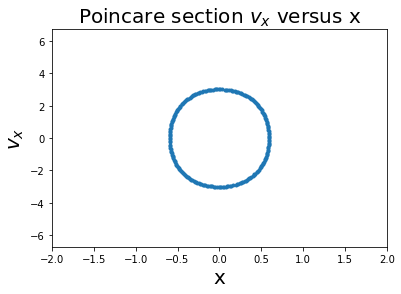


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 3 7
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 761.5773105863909


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

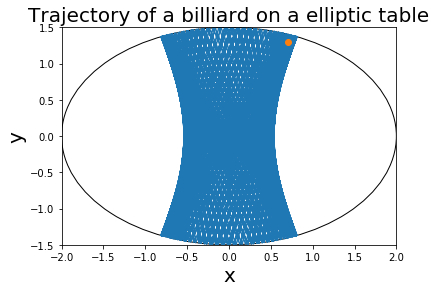

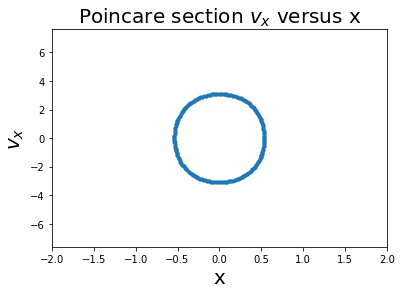


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 3 8
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 854.4003745317531


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

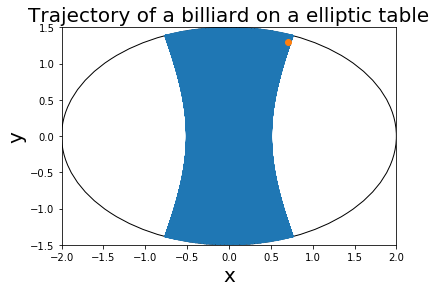

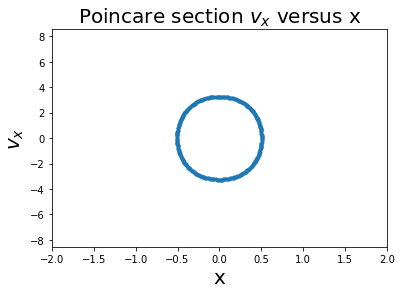


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 3 9
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 948.6832980505138


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

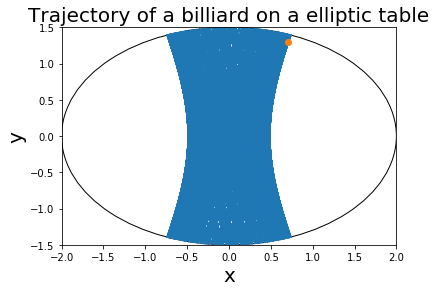

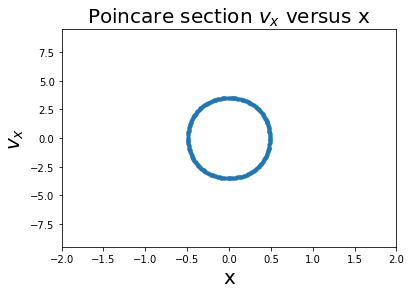


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 3 10
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 1044.030650891055


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

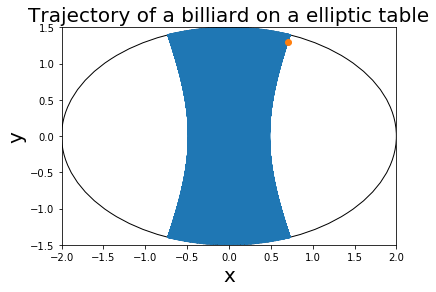

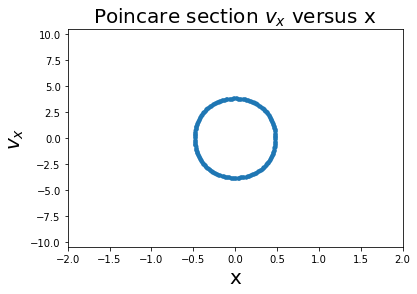


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 3 11
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 1140.175425099138


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

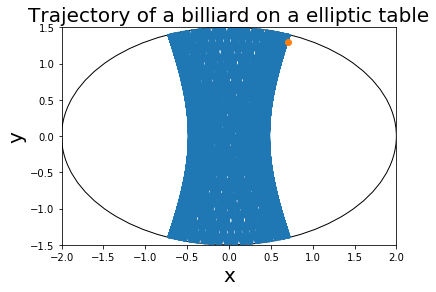

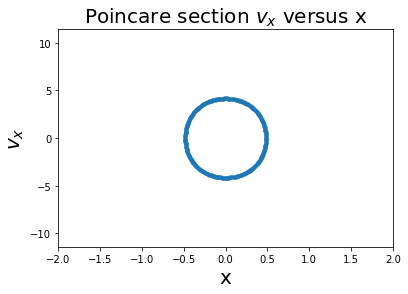


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 3 12
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 1236.9316876852981


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

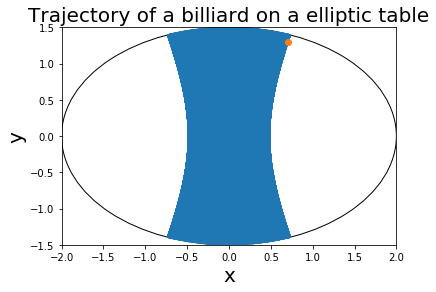

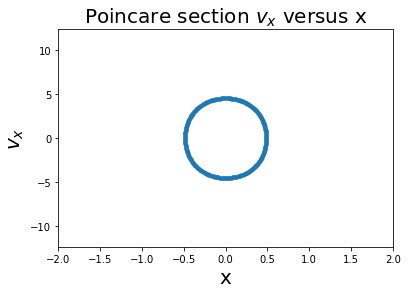


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 3 13
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 1334.1664064126335


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

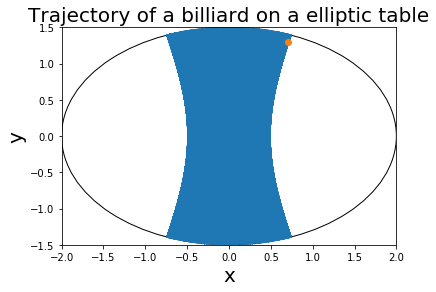

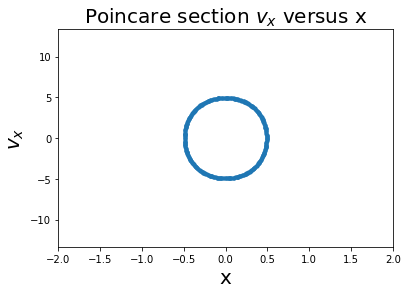


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 3 14
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 1431.7821063276353


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

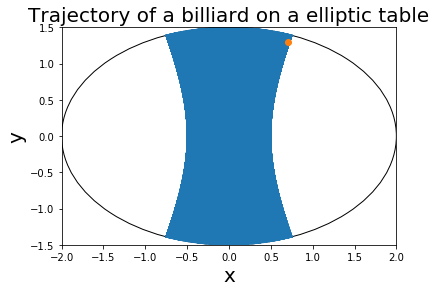

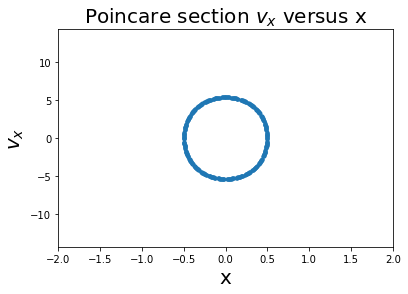


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 3 15
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 1529.7058540778355


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

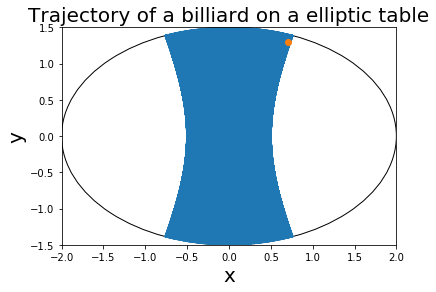

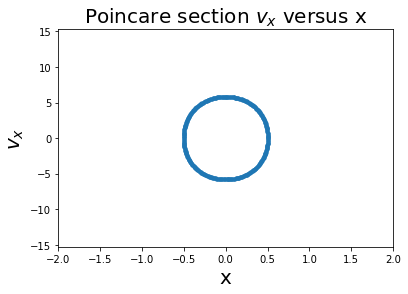


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 3 16
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 1627.8820596099706


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

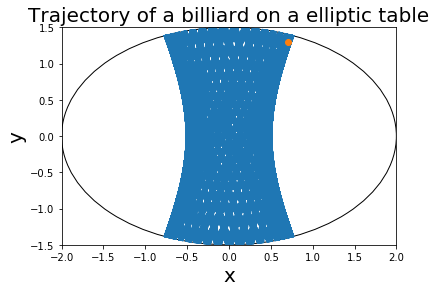

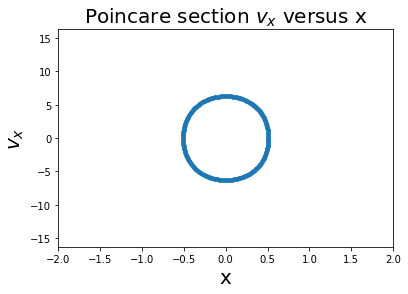


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 3 17
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 1726.2676501632068


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

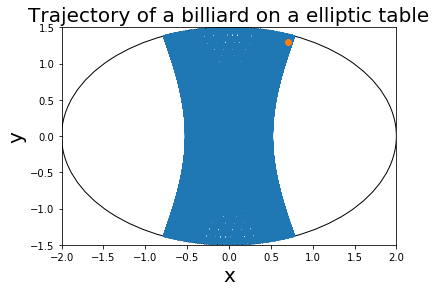

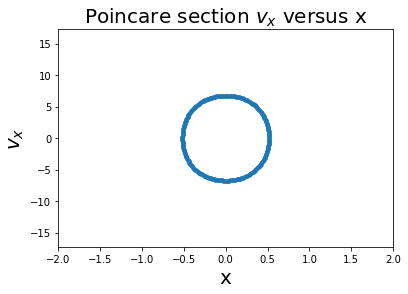


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 3 18
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 1824.8287590894658


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

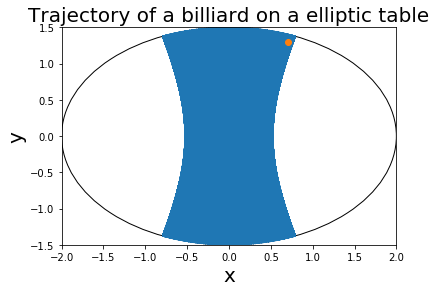

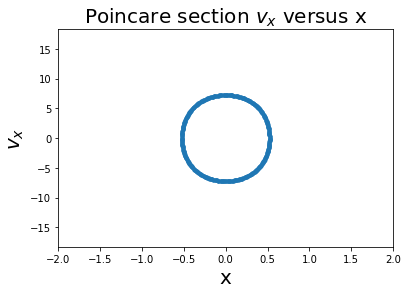


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 3 19
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 1923.5384061671343


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

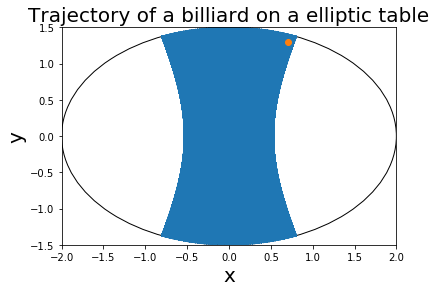

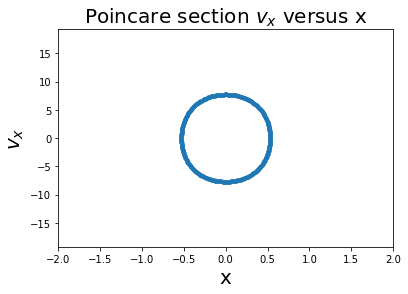


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 3 20
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 2022.3748416156684


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

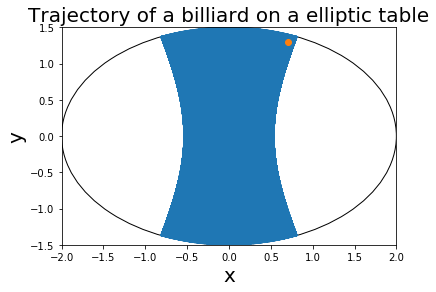

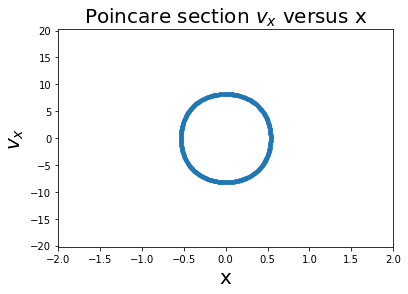


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 3 21
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 2121.3203435596424


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

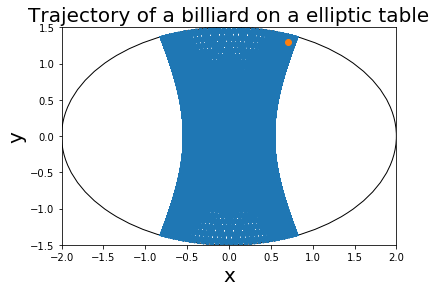

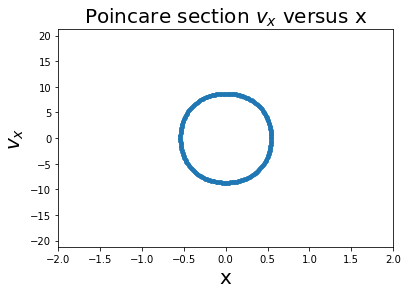


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 3 22
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 2220.360331117452


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

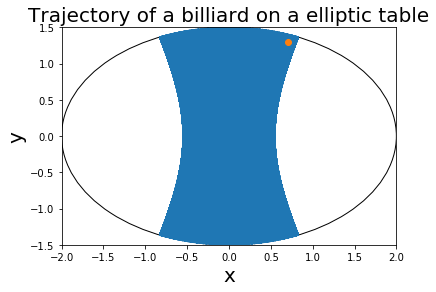

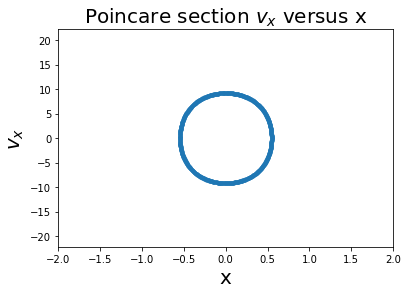


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 3 23
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 2319.4827009486403


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

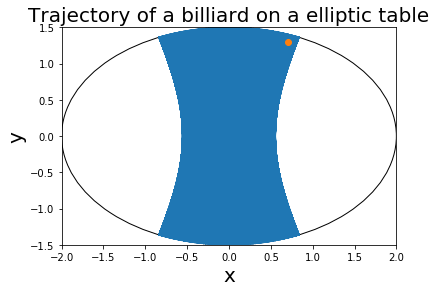

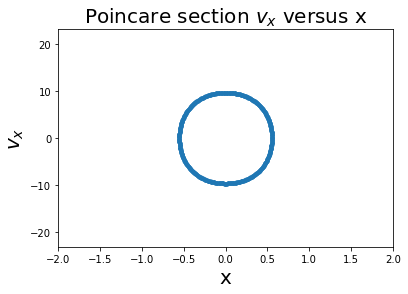


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 3 24
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 2418.677324489565


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

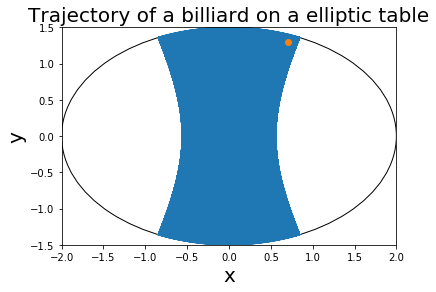

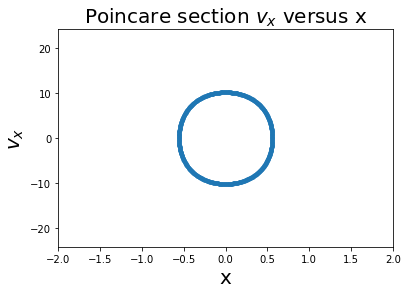


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 3 25
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 2517.935662402834


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

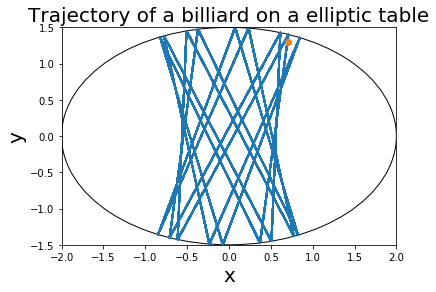

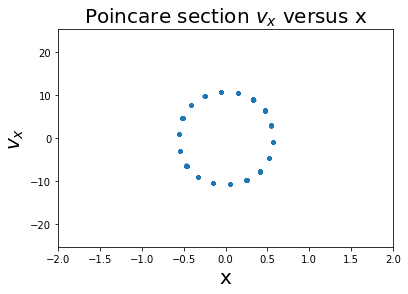


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 3 26
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 2617.25046566048


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

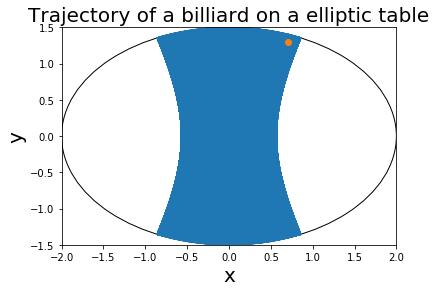

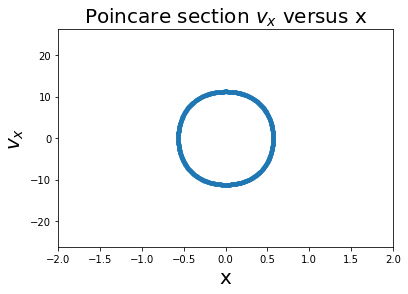


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 3 27
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 2716.6155414412247


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

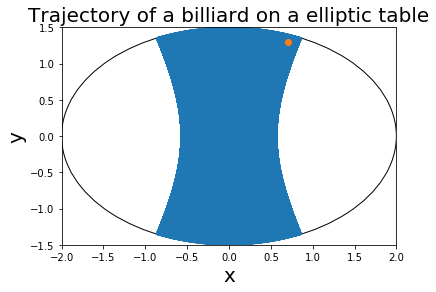

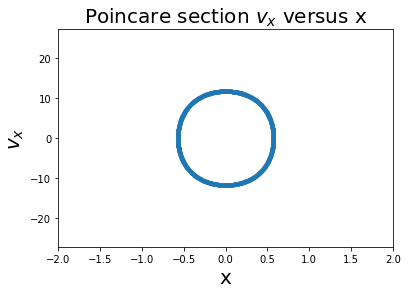


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 3 28
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 2816.0255680657447


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

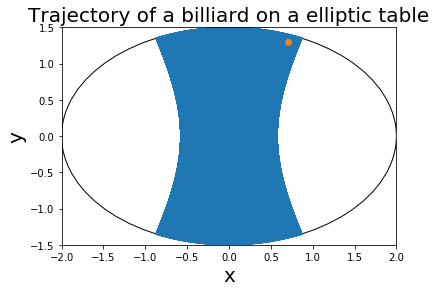

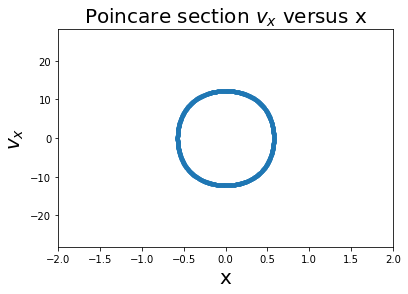


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 3 29
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 2915.4759474226503


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

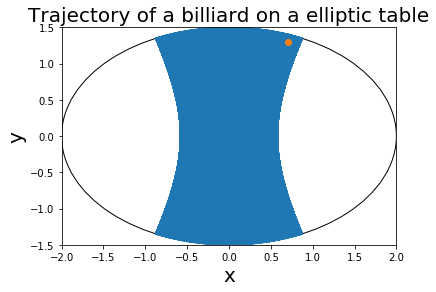

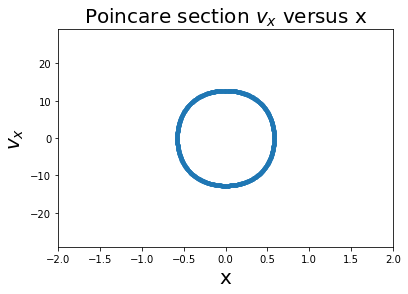


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 3 30
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 3014.962686336267


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

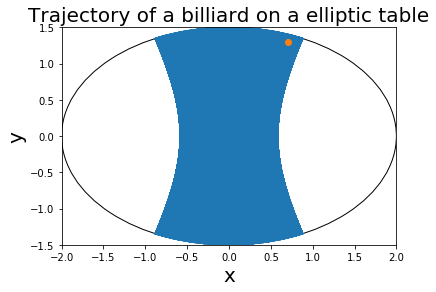

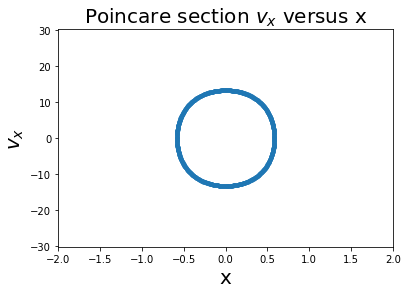


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 3 31
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 3114.482300479487


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

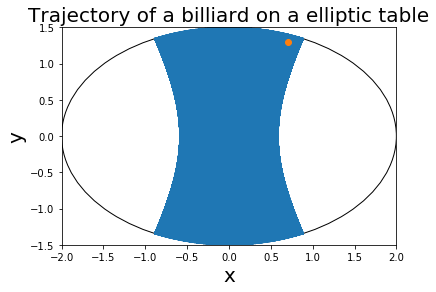

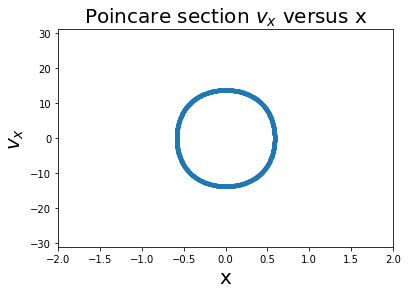


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 3 32
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 3214.0317359976393


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

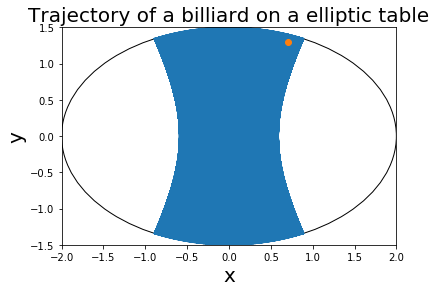

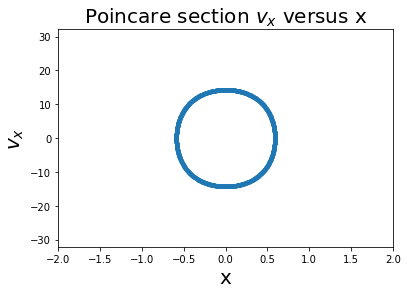


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 3 33
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 3313.608305156178


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

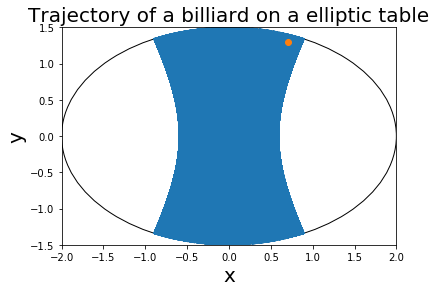

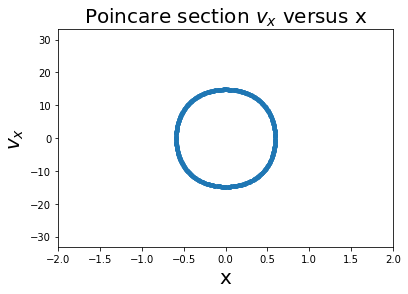


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 3 34
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 3413.2096331752023


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

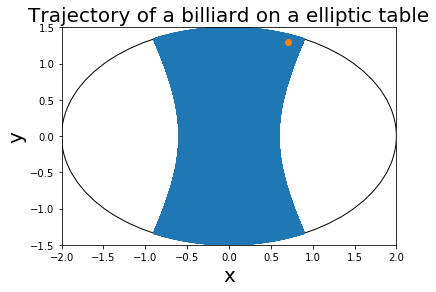

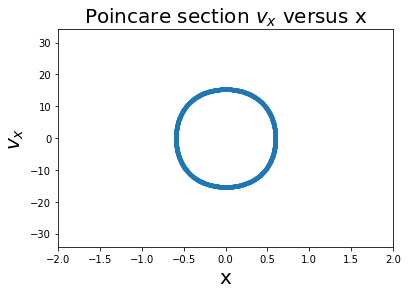


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 3 35
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 3512.833614050059


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

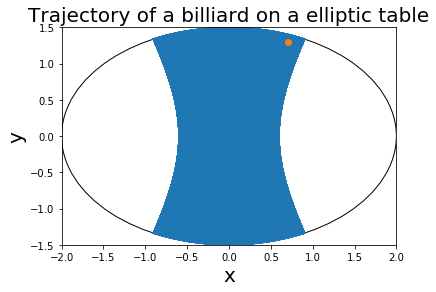

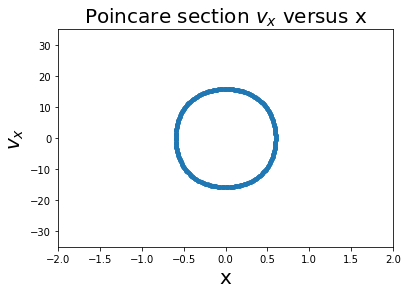


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 3 36
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 3612.4783736376885


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

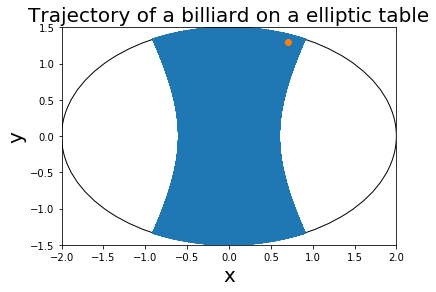

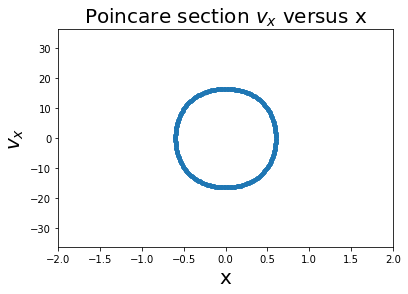


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 3 37
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 3712.142238654117


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

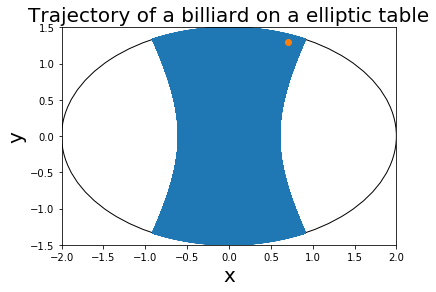

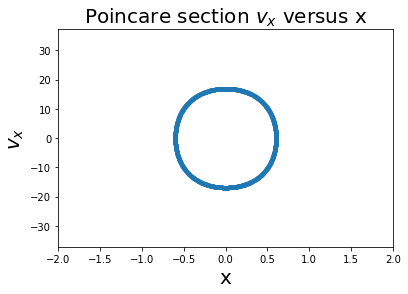


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 3 38
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 3811.8237105091835


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

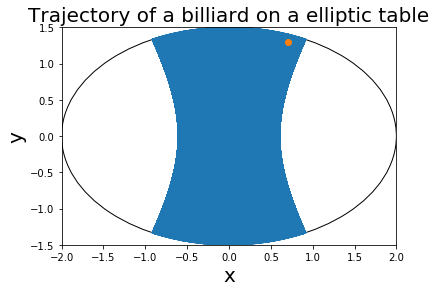

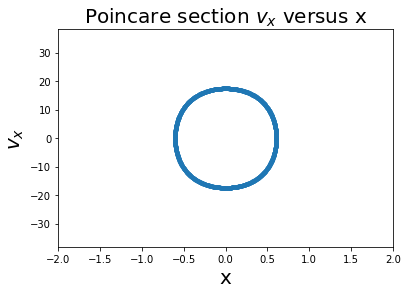


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 3 39
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 3911.521443121589


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

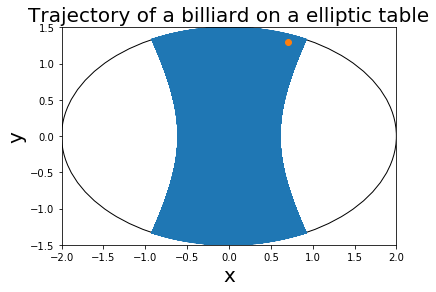

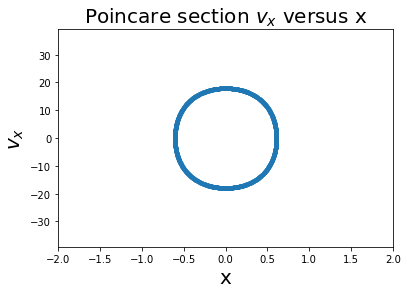


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 3 40
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 4011.234224026316


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

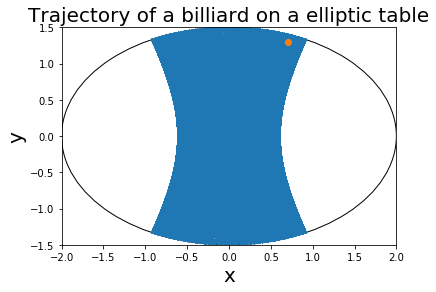

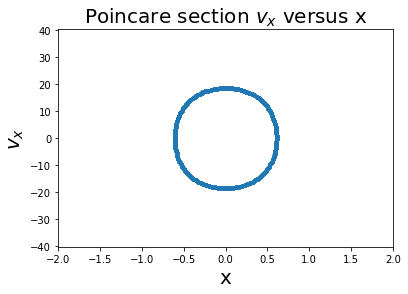


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 3 41
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 4110.960958218893


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

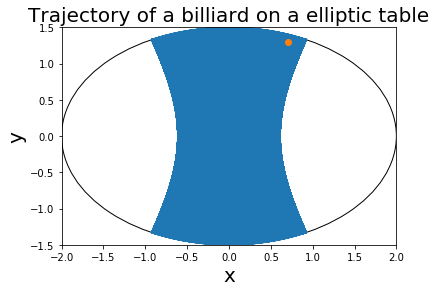

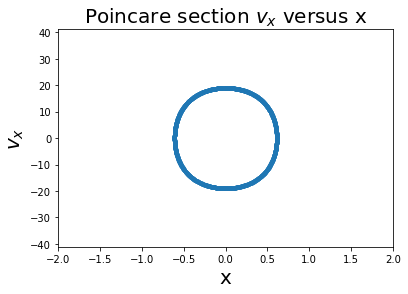


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 3 42
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 4210.70065428546


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

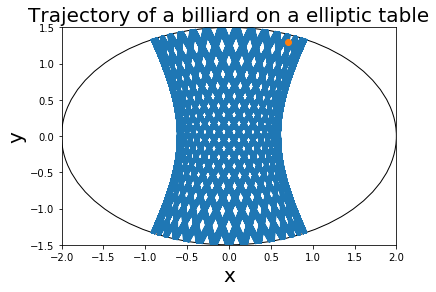

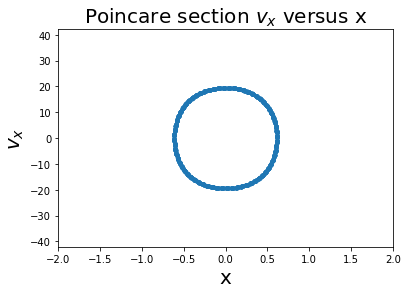


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 3 43
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 4310.452412450461


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

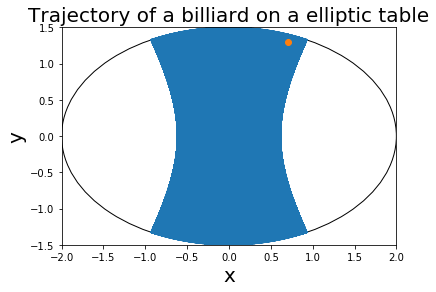

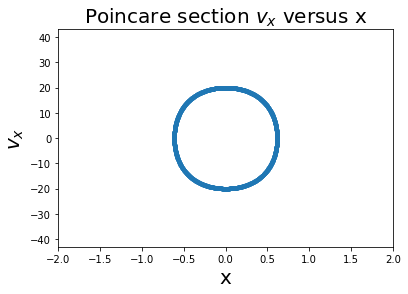


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 3 44
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 4410.215414239989


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

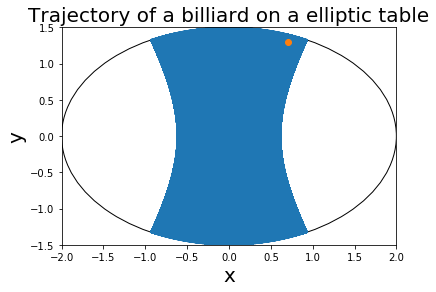

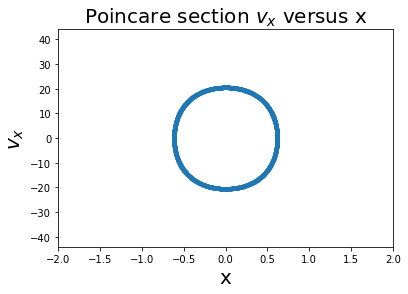


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 3 45
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 4509.988913511872


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

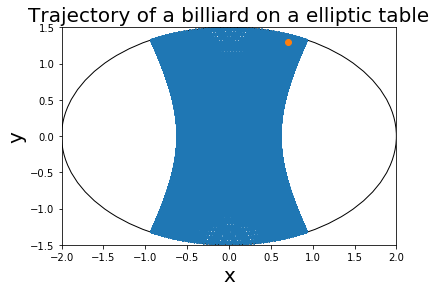

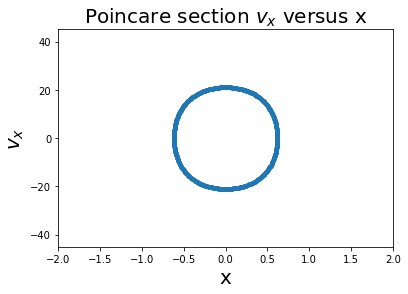


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 3 46
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 4609.772228646444


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

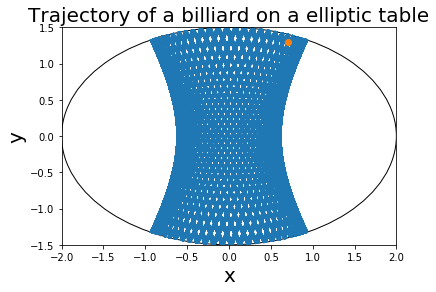

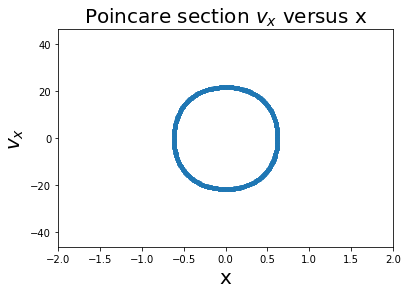


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 3 47
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 4709.564735726646


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

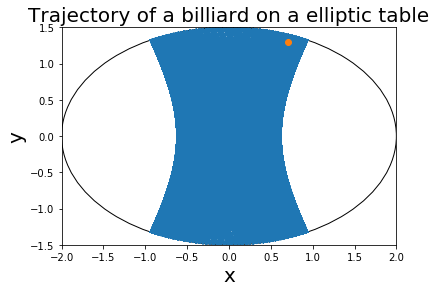

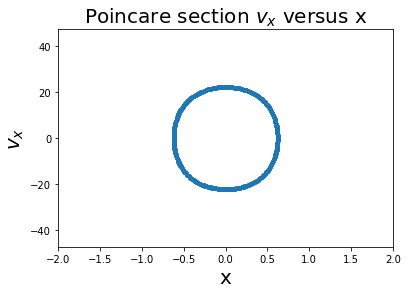


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 3 48
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 4809.365862564419


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

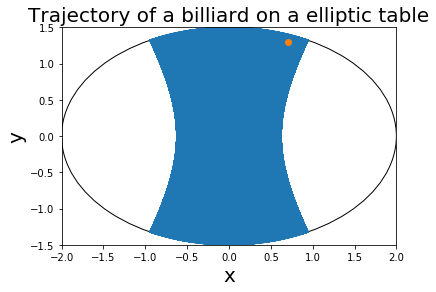

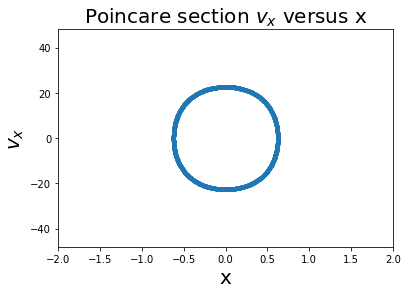


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 3 49
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 4909.1750834534305


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

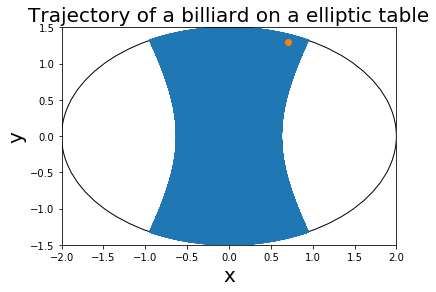

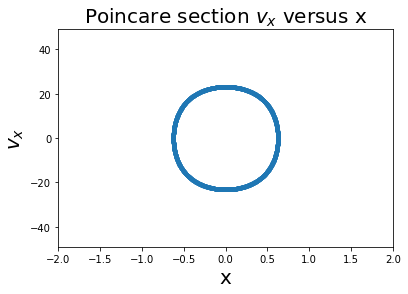


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 4 1
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 412.31056256176606


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

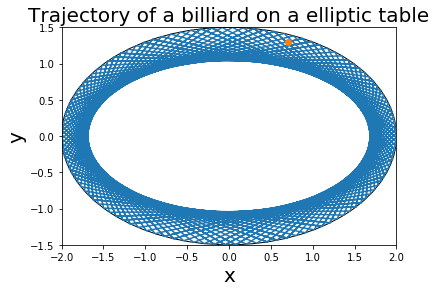

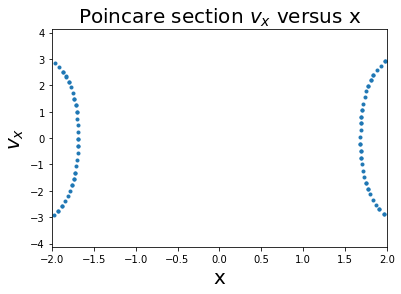


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 4 2
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 447.21359549995793


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

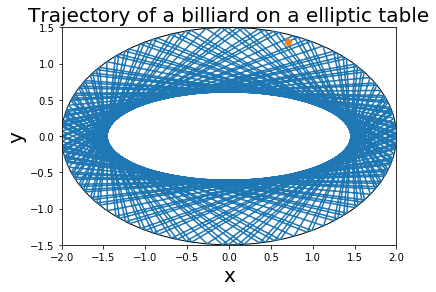

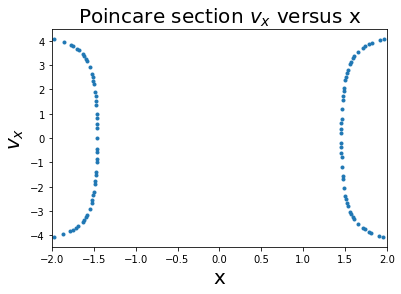


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 4 3
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 500.0


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

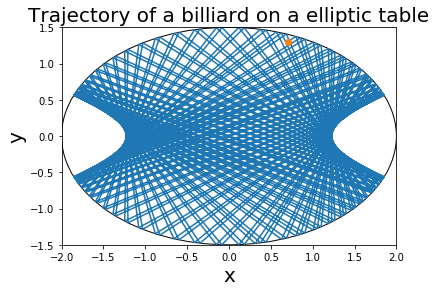

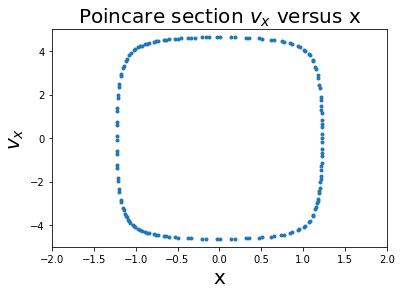


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 4 4
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 565.685424949238


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

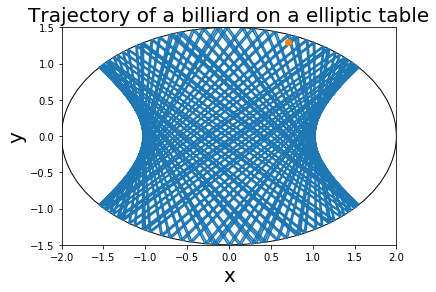

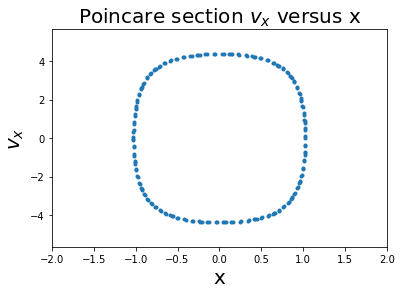


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 4 5
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 640.3124237432849


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

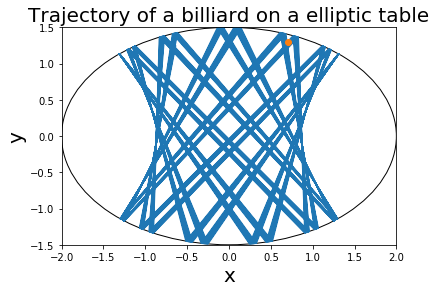

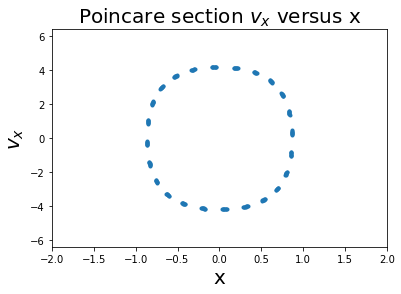


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 4 6
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 721.1102550927978


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

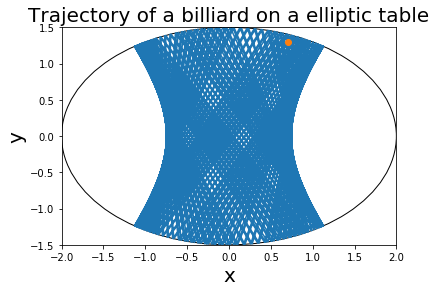

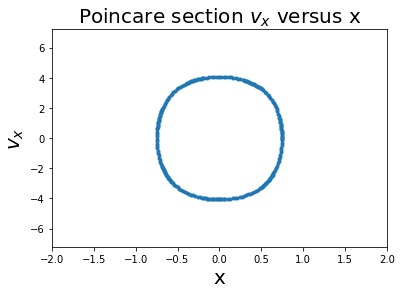


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 4 7
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 806.2257748298549


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

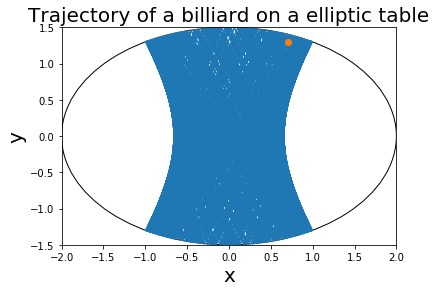

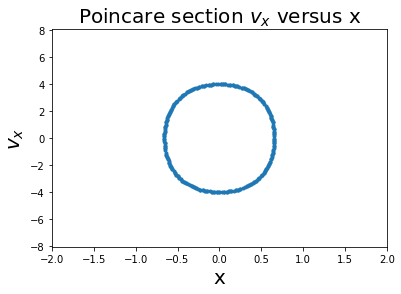


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 4 8
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 894.4271909999159


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

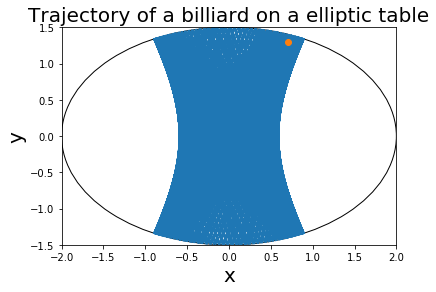

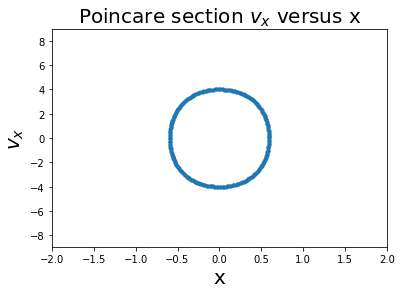


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 4 9
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 984.8857801796104


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

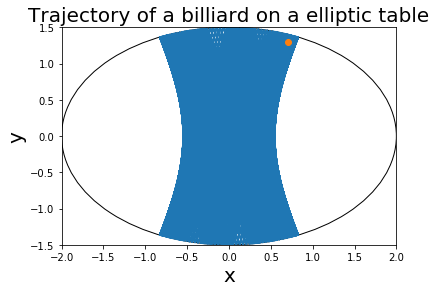

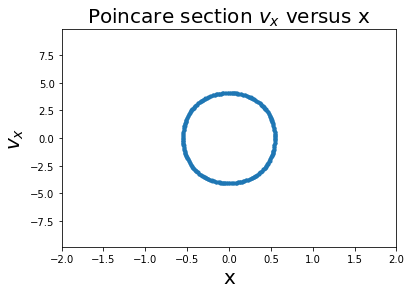


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 4 10
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 1077.0329614269008


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

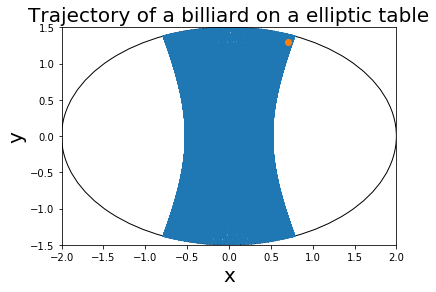

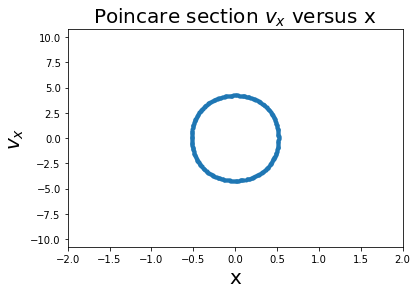


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 4 11
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 1170.4699910719626


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

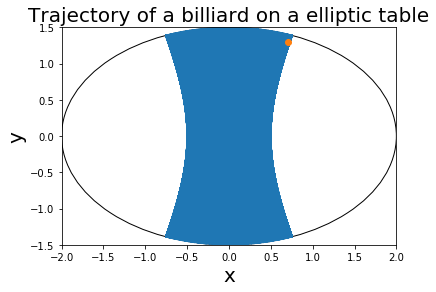

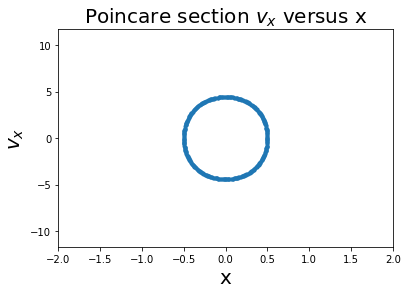


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 4 12
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 1264.9110640673518


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

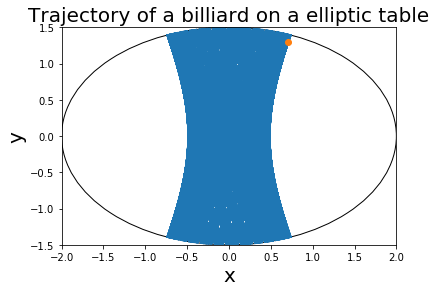

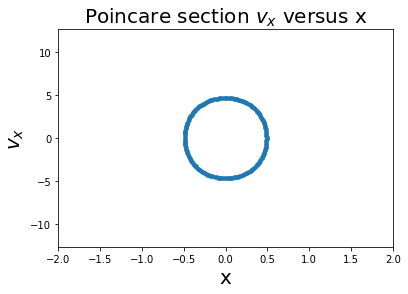


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 4 13
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 1360.1470508735445


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

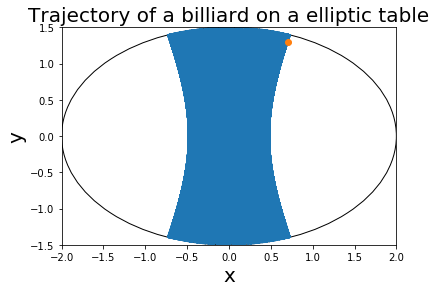

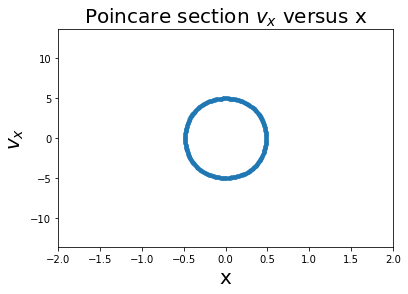


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 4 14
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 1456.0219778561036


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

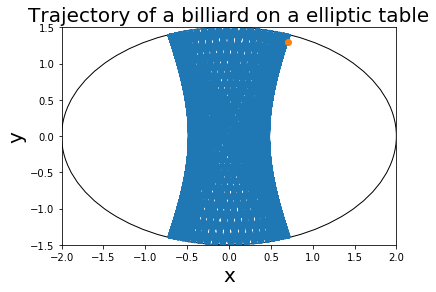

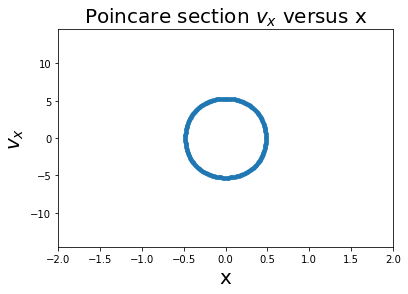


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 4 15
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 1552.4174696260025


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

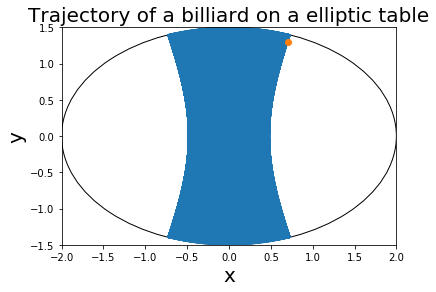

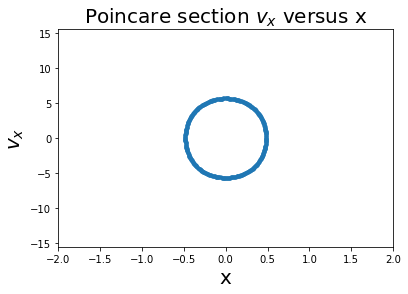


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 4 16
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 1649.2422502470642


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

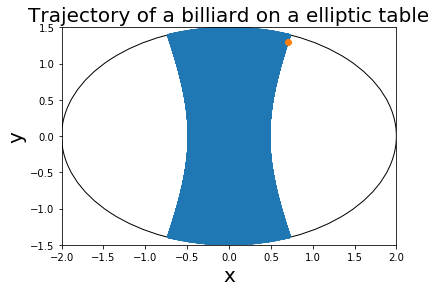

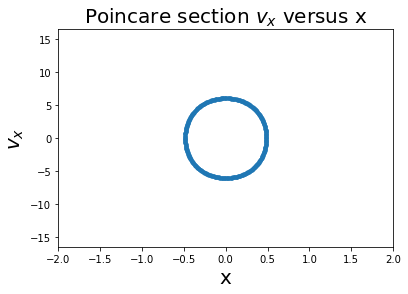


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 4 17
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 1746.4249196572978


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

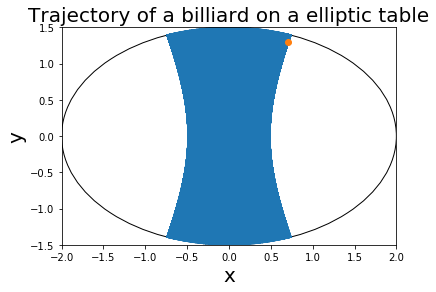

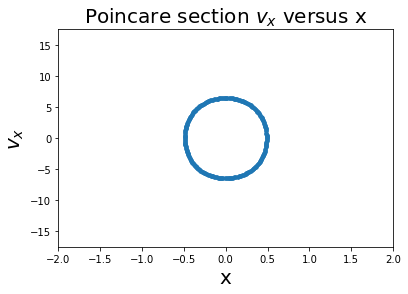


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 4 18
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 1843.9088914585775


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

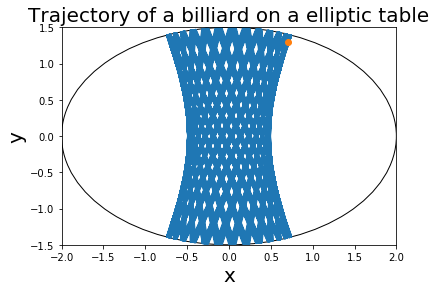

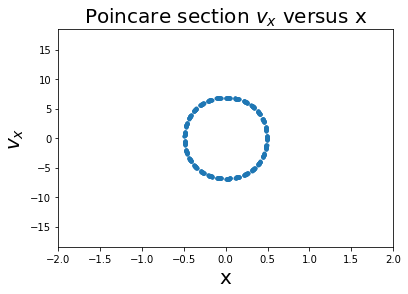


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 4 19
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 1941.6487838947598


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

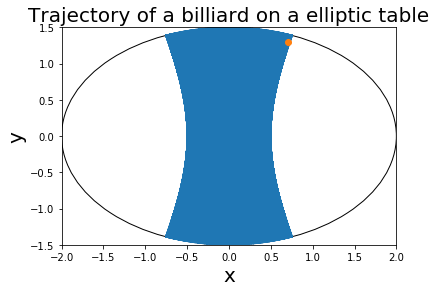

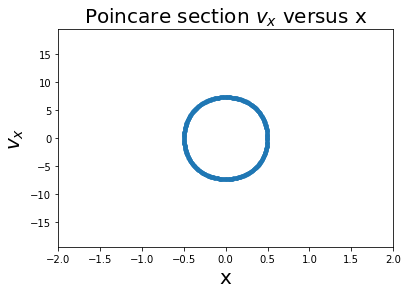


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 4 20
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 2039.6078054371137


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

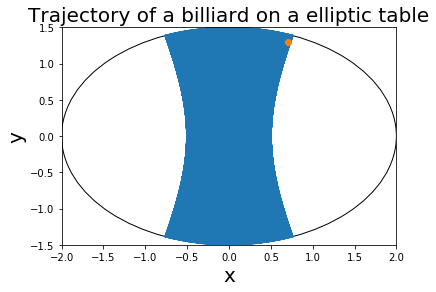

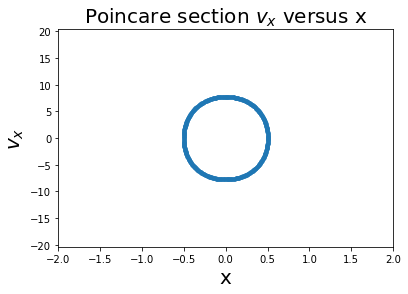


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 4 21
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 2137.755832643195


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

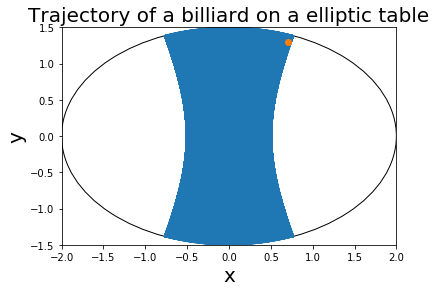

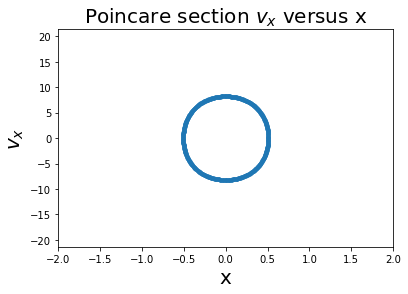


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 4 22
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 2236.06797749979


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

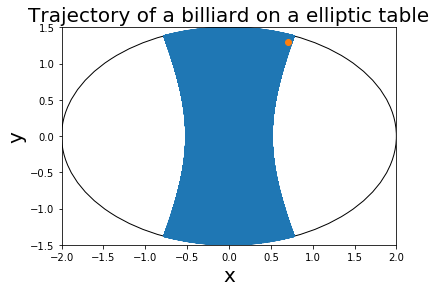

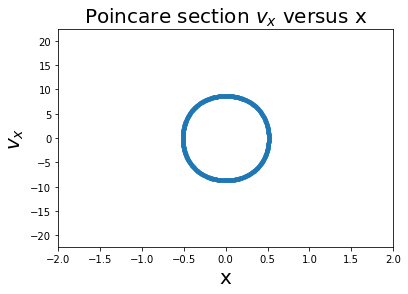


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 4 23
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 2334.5235059857505


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

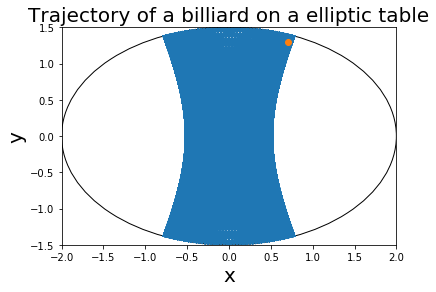

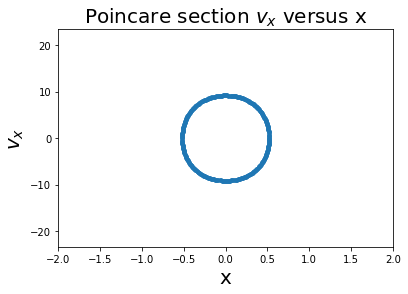


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 4 24
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 2433.105012119288


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

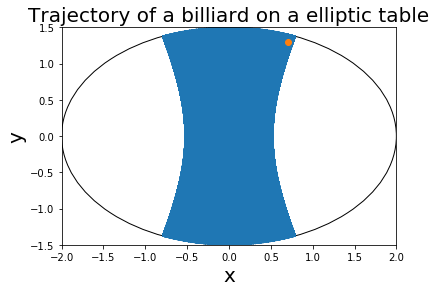

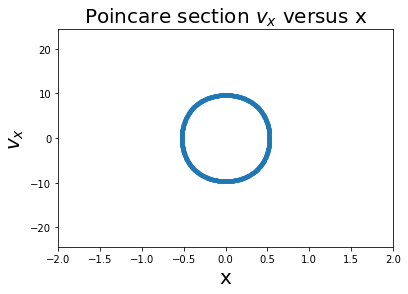


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 4 25
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 2531.7977802344326


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

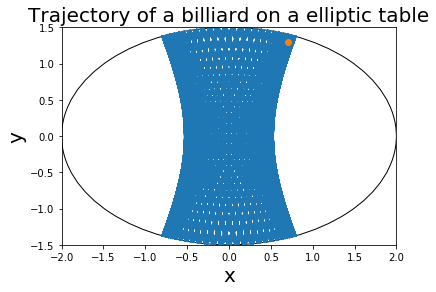

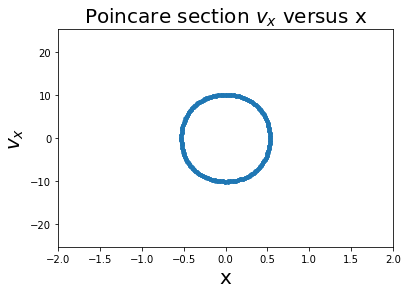


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 4 26
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 2630.589287593181


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

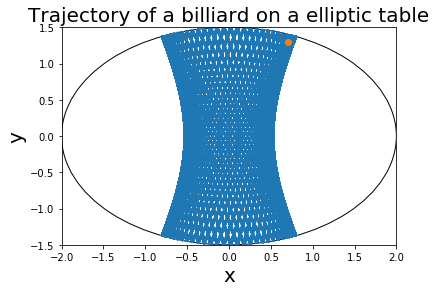

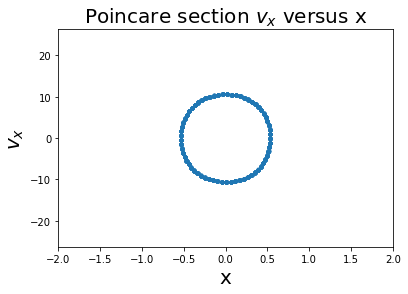


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 4 27
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 2729.4688127912364


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

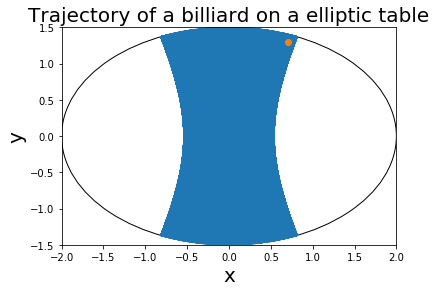

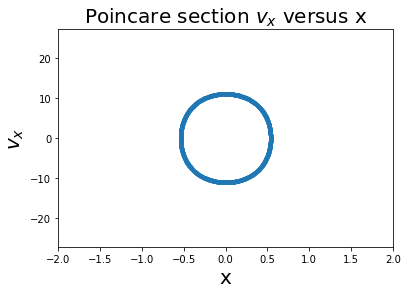


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 4 28
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 2828.42712474619


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

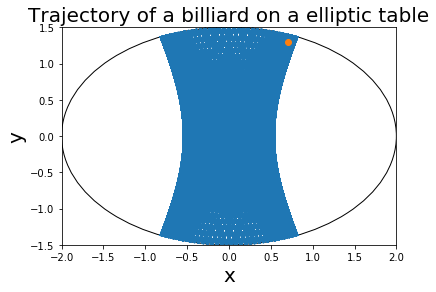

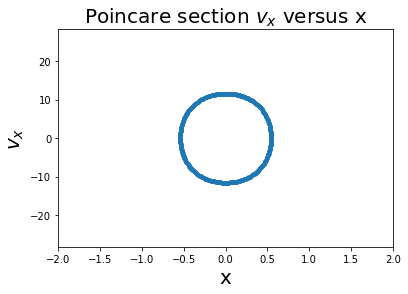


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 4 29
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 2927.4562336608897


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

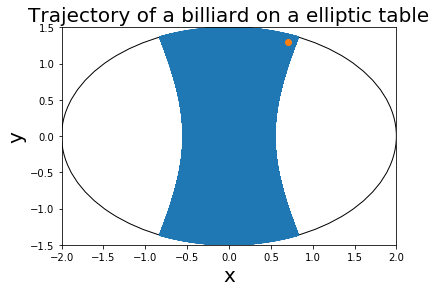

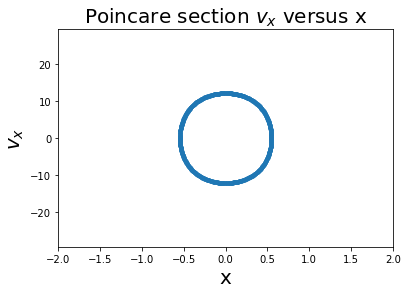


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 4 30
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 3026.5491900843112


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

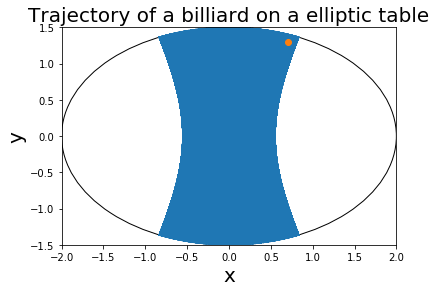

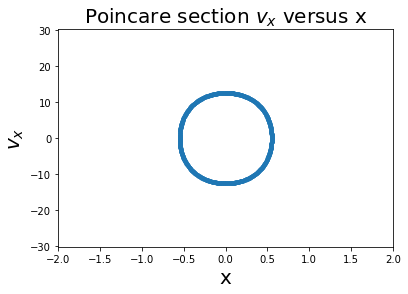


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 4 31
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 3125.699921617557


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

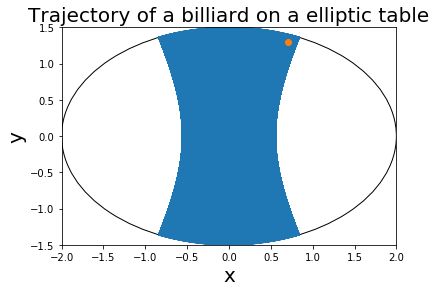

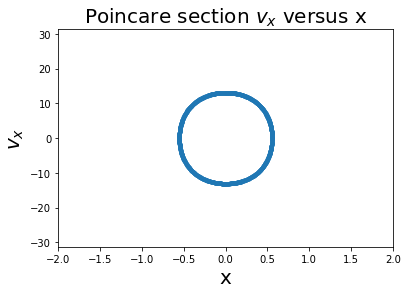


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 4 32
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 3224.9030993194197


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

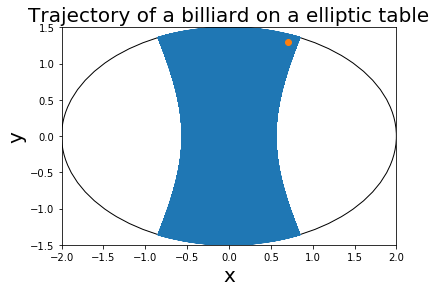

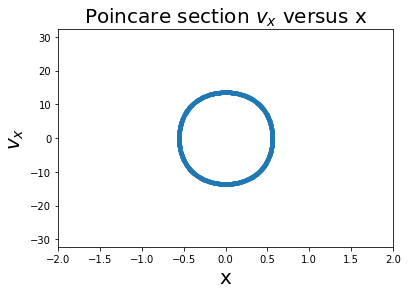


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 4 33
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 3324.1540277189324


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

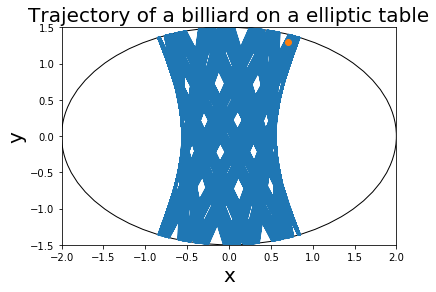

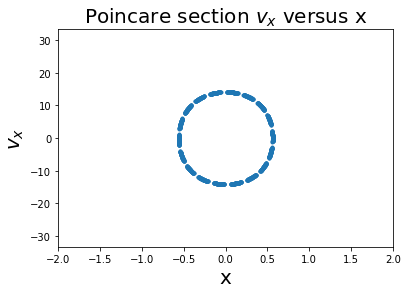


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 4 34
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 3423.448553724738


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

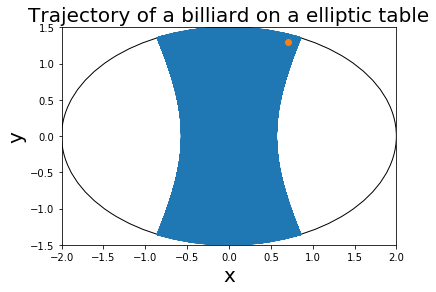

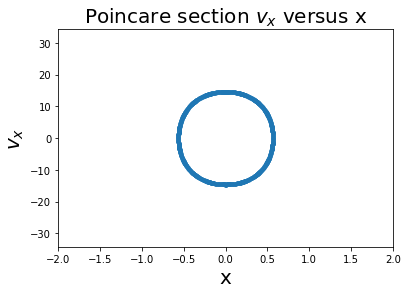


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 4 35
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 3522.782990761707


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

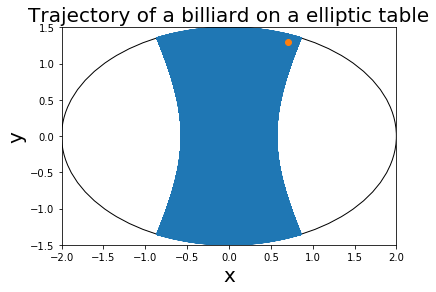

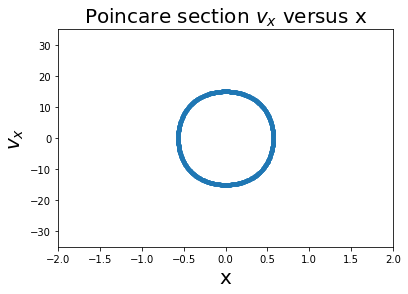


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 4 36
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 3622.154055254967


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

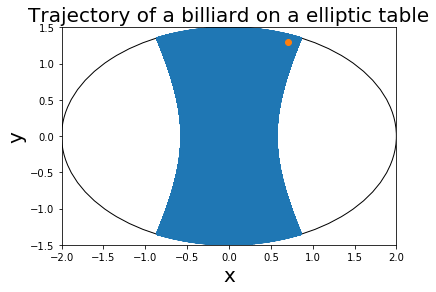

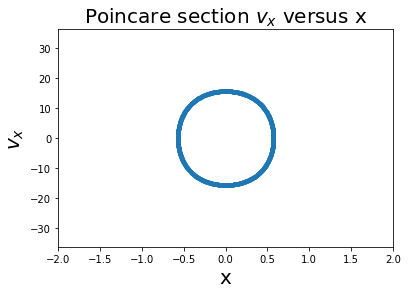


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 4 37
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 3721.558813185679


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

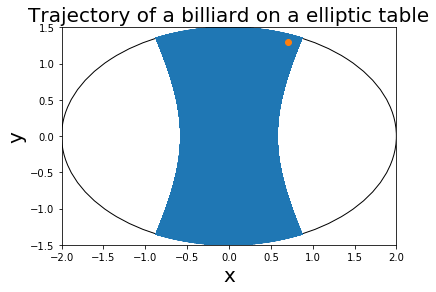

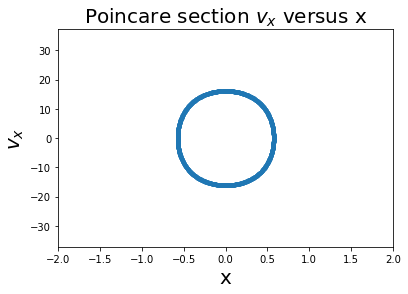


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 4 38
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 3820.99463490856


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

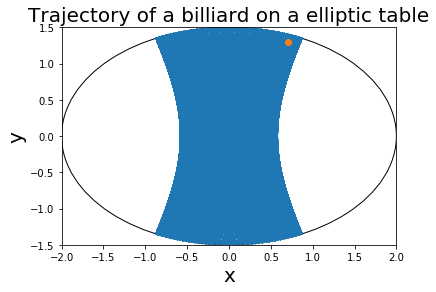

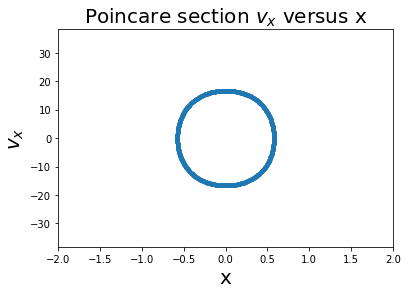


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 4 39
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 3920.459156782532


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

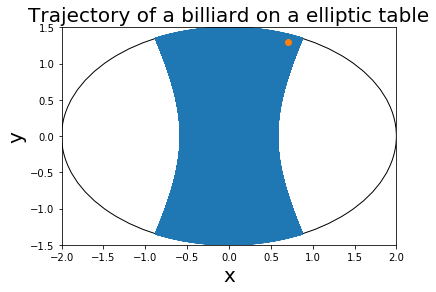

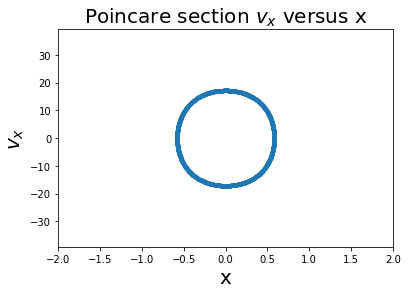


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 4 40
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 4019.950248448356


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

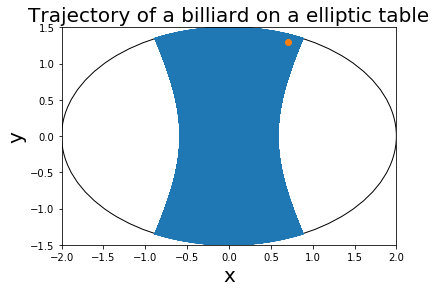

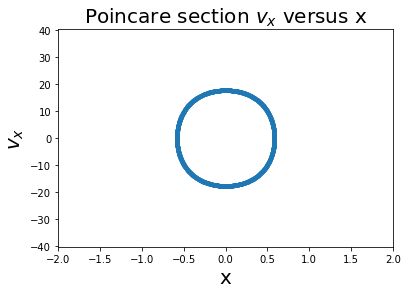


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 4 41
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 4119.465984809196


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

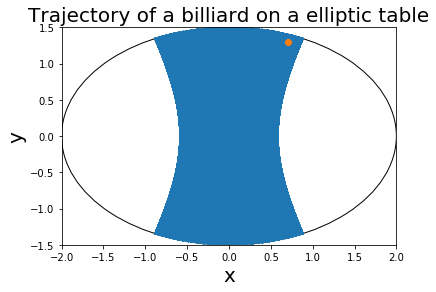

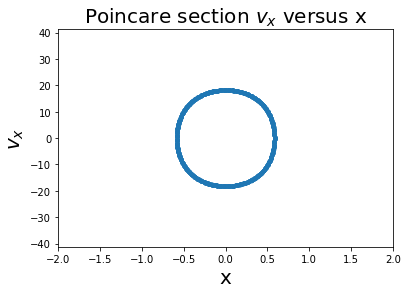


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 4 42
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 4219.004621945797


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

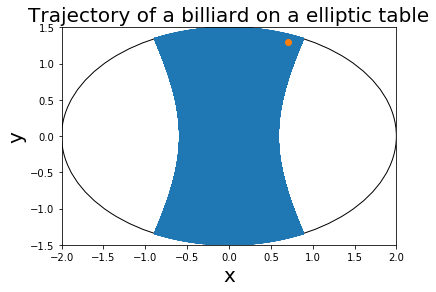

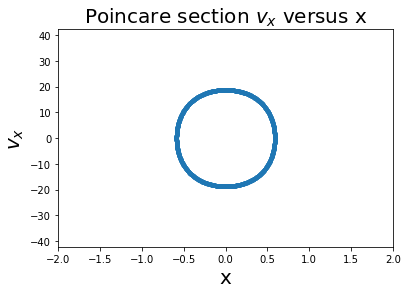


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 4 43
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 4318.564576337837


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

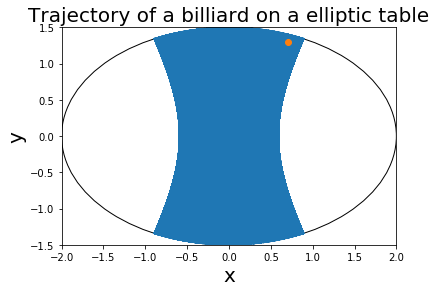

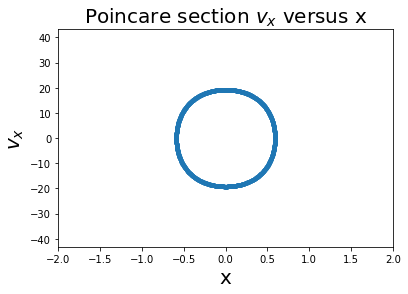


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 4 44
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 4418.144406874904


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

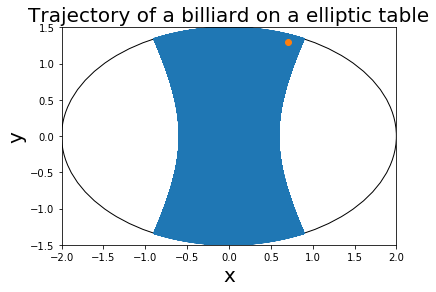

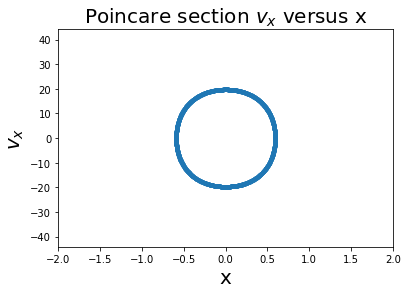


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 4 45
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 4517.7427992306075


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

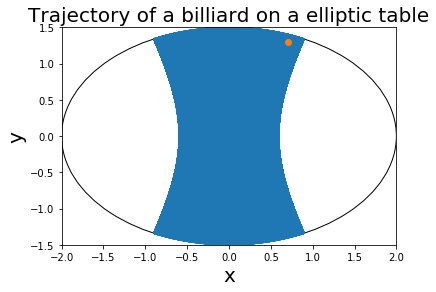

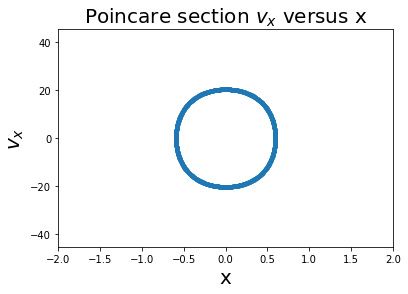


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 4 46
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 4617.358552246078


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

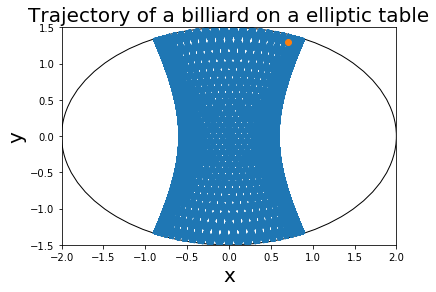

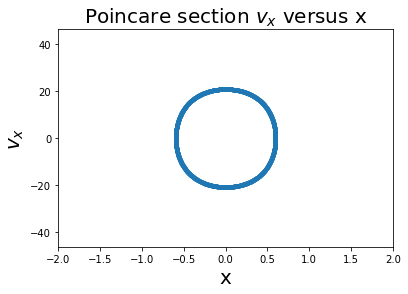


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 4 47
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 4716.990566028302


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

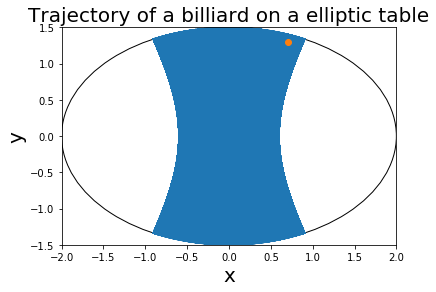

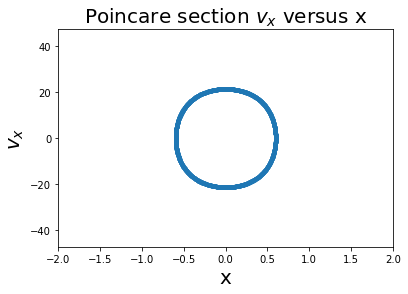


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 4 48
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 4816.637831516919


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

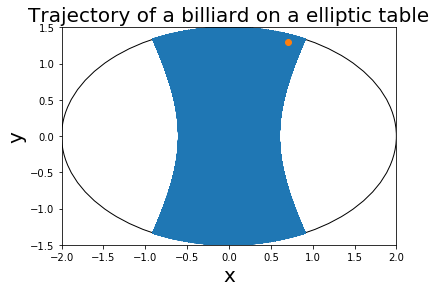

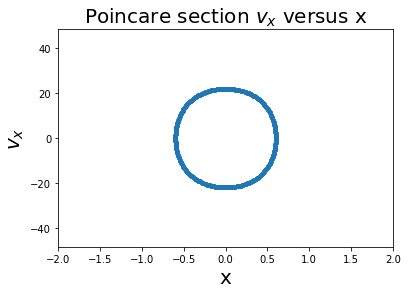


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 4 49
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 4916.299421312742


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

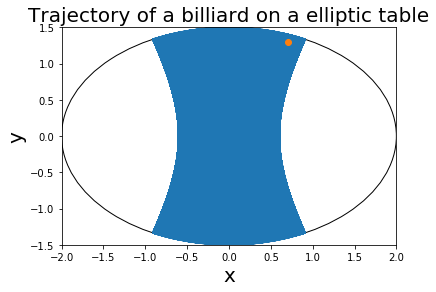

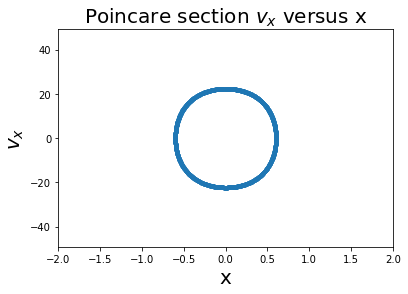


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 5 1
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 509.9019513592784


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

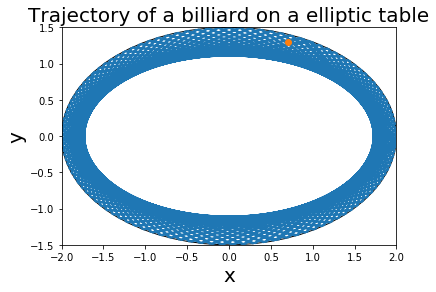

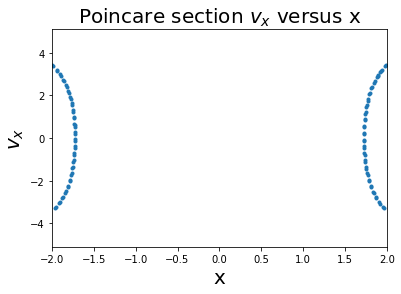


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 5 2
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 538.5164807134504


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

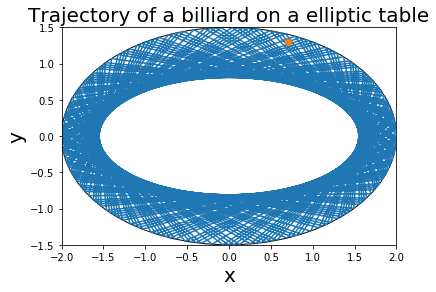

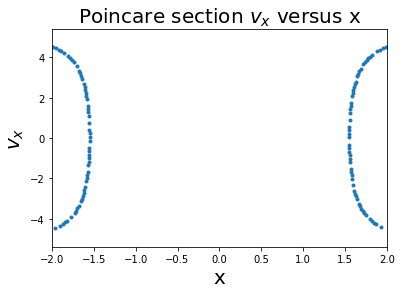


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 5 3
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 583.0951894845301


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

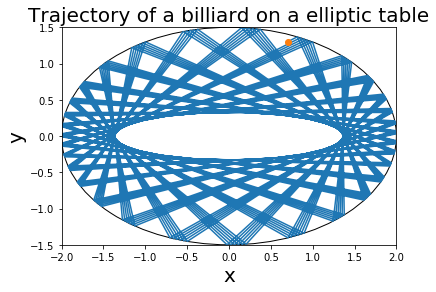

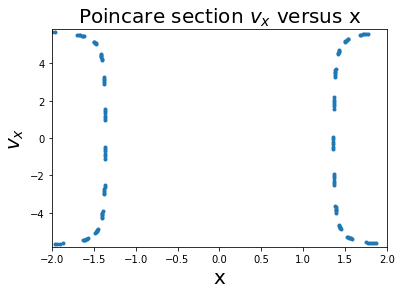


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 5 4
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 640.3124237432849


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

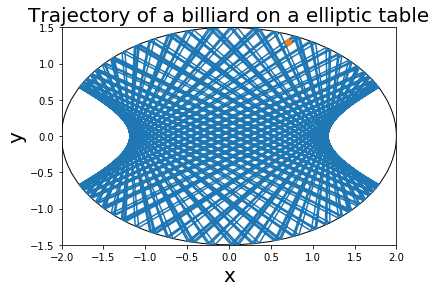

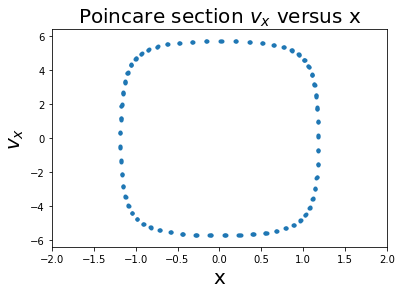


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 5 5
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 707.1067811865476


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

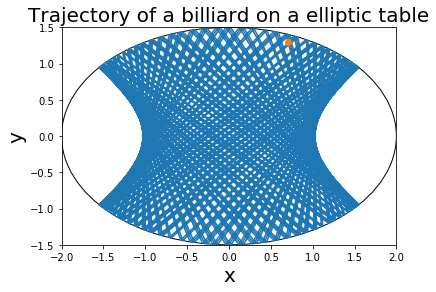

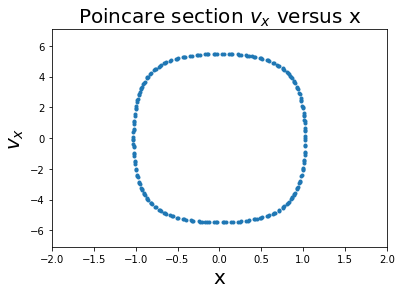


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 5 6
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 781.0249675906654


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

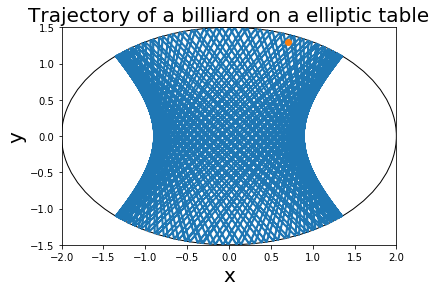

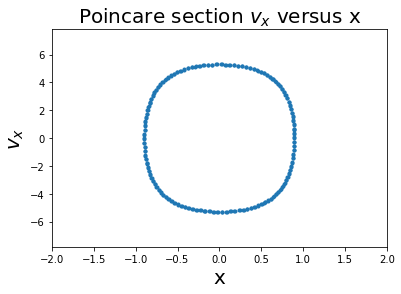


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 5 7
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 860.2325267042627


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

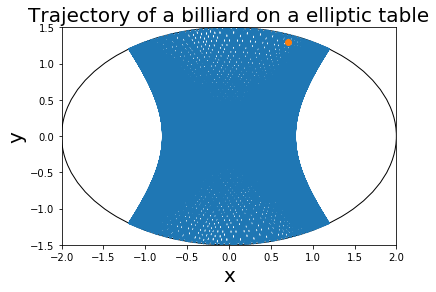

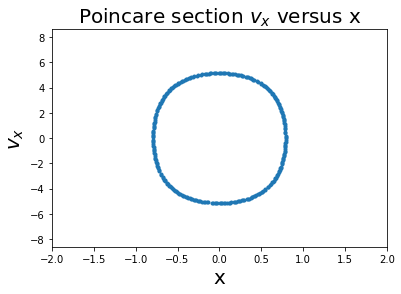


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 5 8
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 943.3981132056604


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

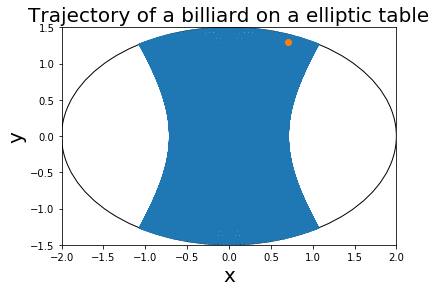

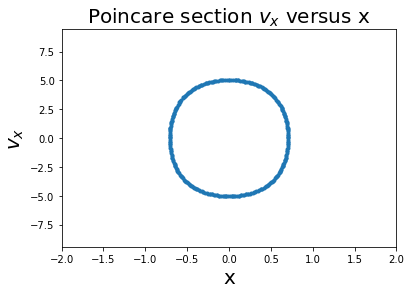


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 5 9
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 1029.5630140987


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

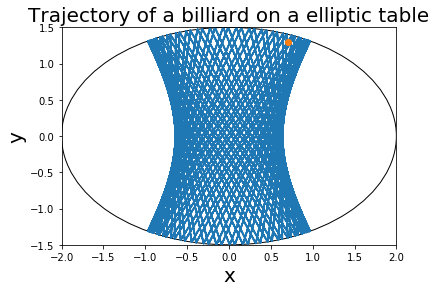

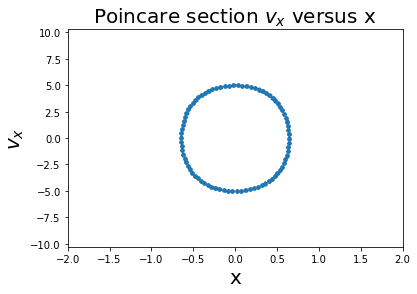


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 5 10
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 1118.033988749895


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

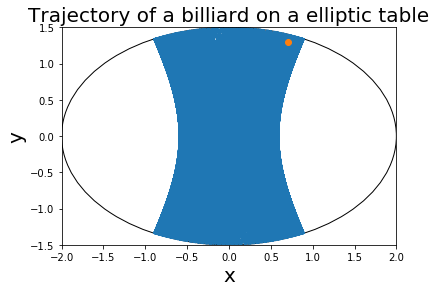

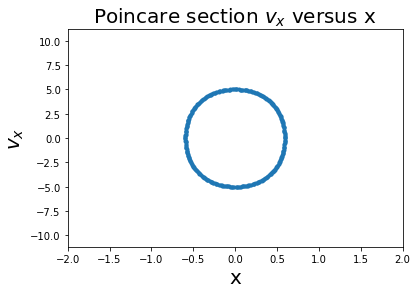


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 5 11
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 1208.3045973594571


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

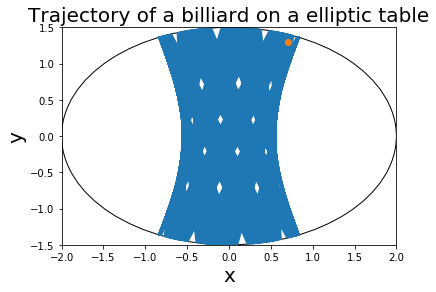

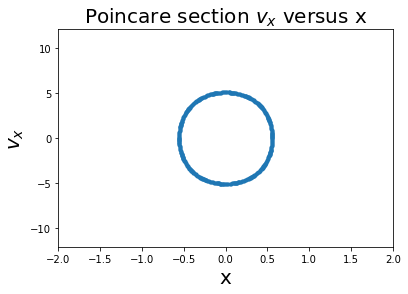


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 5 12
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 1300.0


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

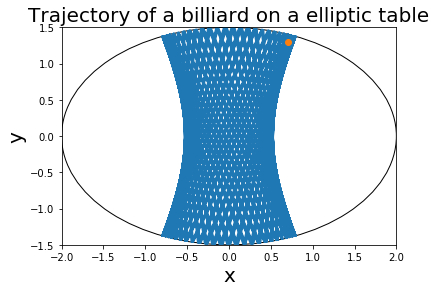

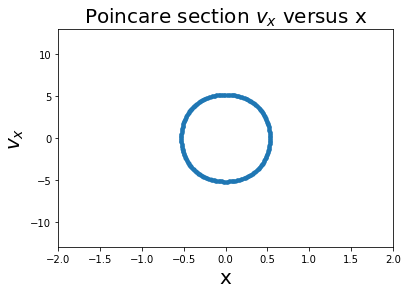


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 5 13
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 1392.838827718412


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

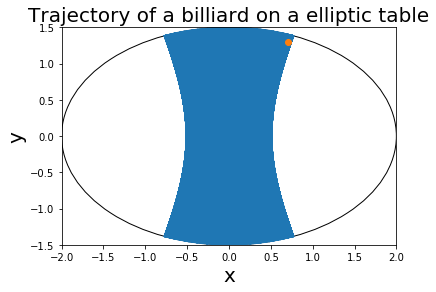

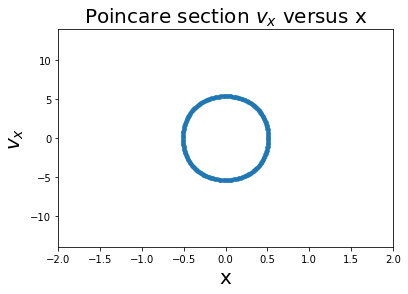


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 5 14
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 1486.6068747318507


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

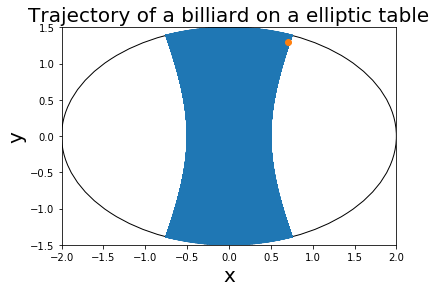

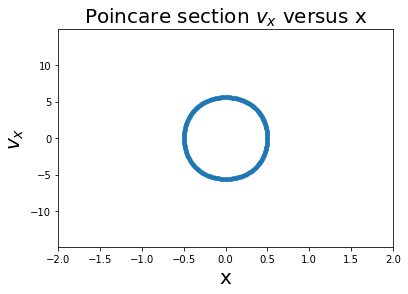


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 5 15
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 1581.1388300841895


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

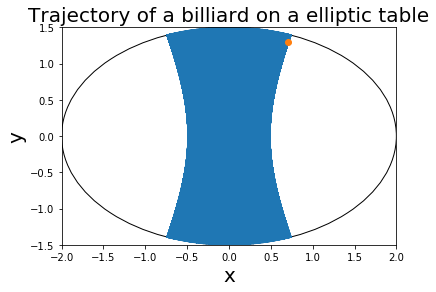

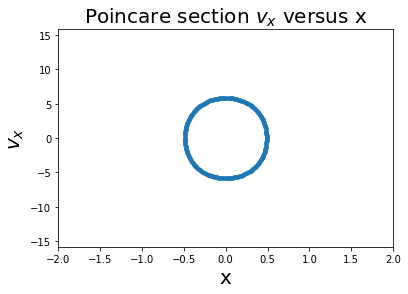


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 5 16
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 1676.3054614240211


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

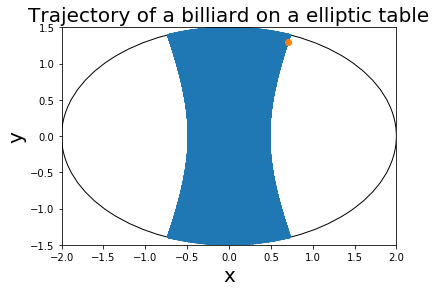

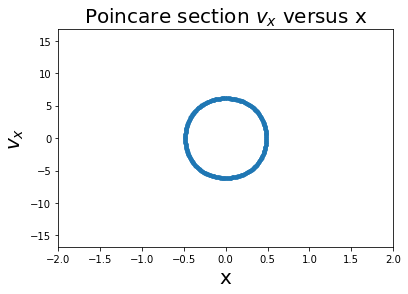


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 5 17
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 1772.004514666935


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

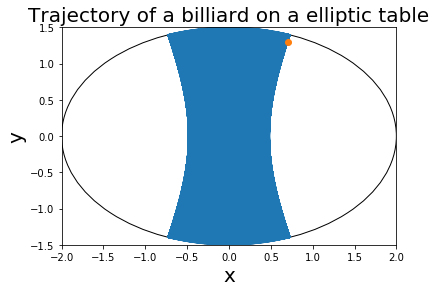

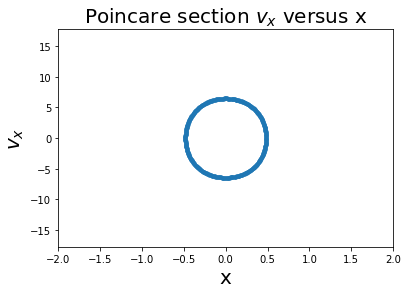


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 5 18
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 1868.1541692269407


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

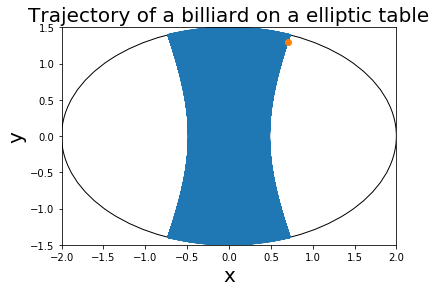

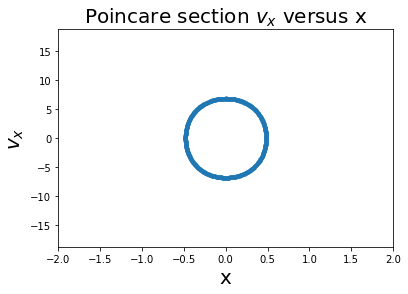


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 5 19
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 1964.68827043885


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

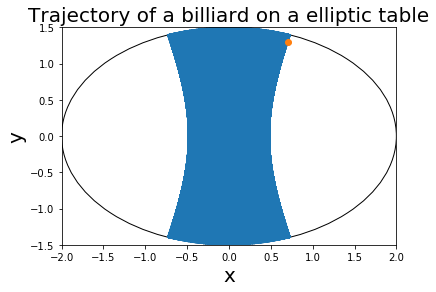

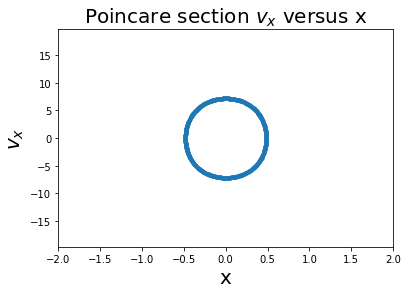


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 5 20
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 2061.5528128088304


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

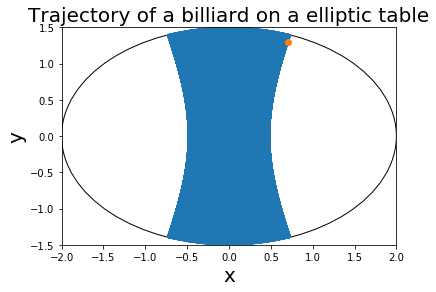

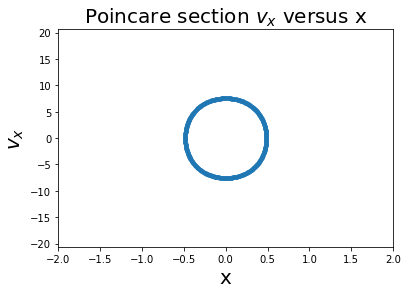


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 5 21
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 2158.7033144922902


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

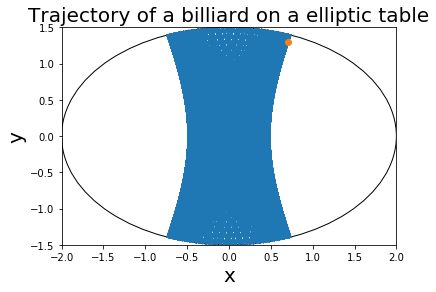

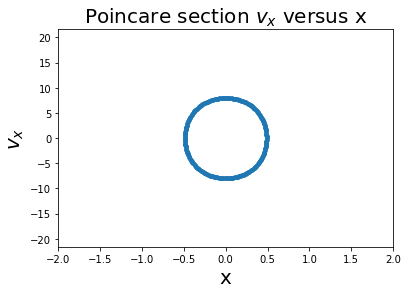


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 5 22
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 2256.1028345356954


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

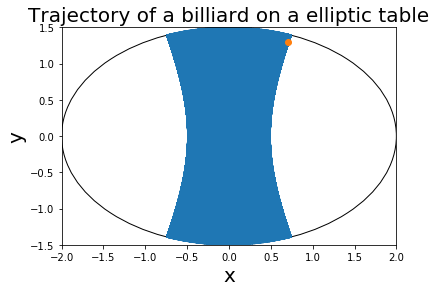

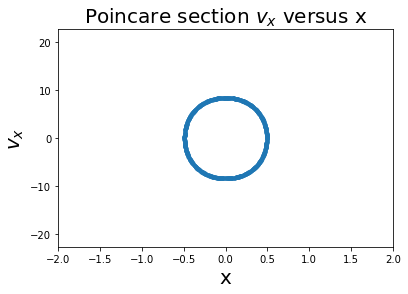


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 5 23
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 2353.720459187964


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

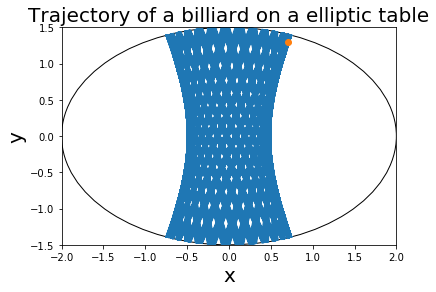

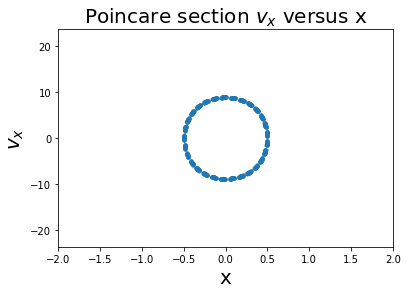


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 5 24
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 2451.5301344262525


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

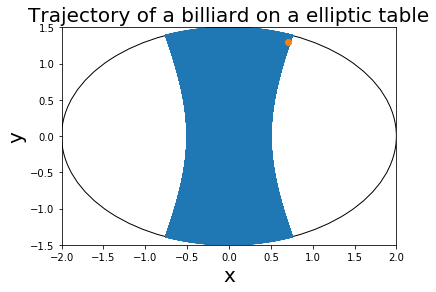

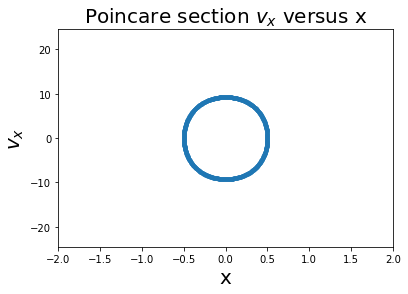


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 5 25
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 2549.5097567963926


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

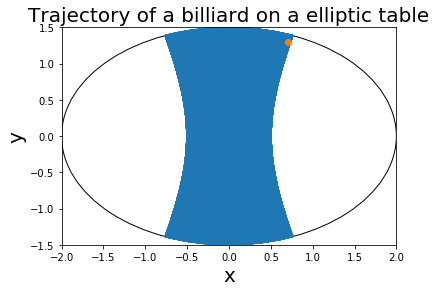

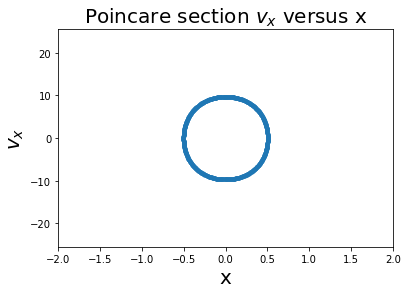


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 5 26
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 2647.6404589747453


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

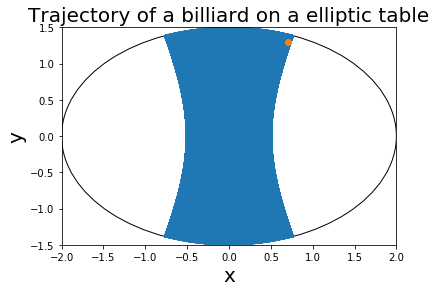

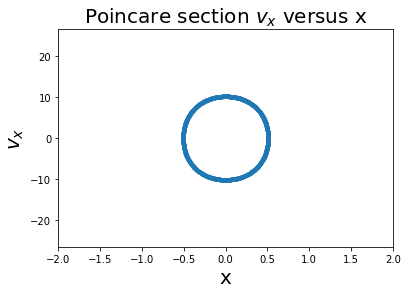


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 5 27
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 2745.9060435491965


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

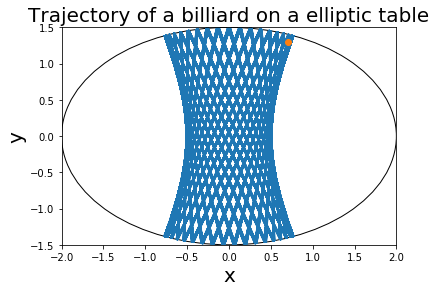

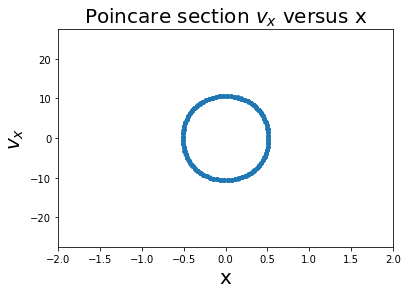


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 5 28
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 2844.2925306655784


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

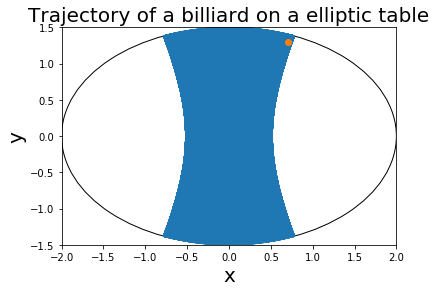

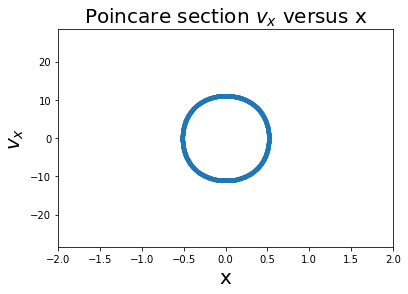


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 5 29
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 2942.7877939124323


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

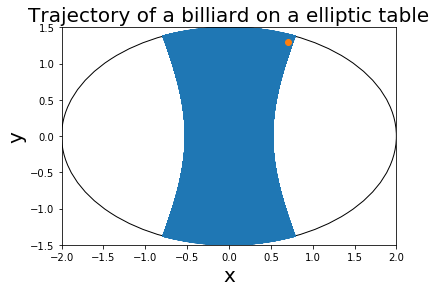

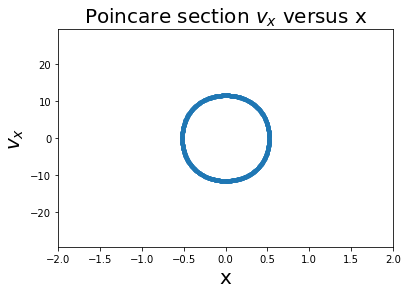


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 5 30
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 3041.38126514911


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

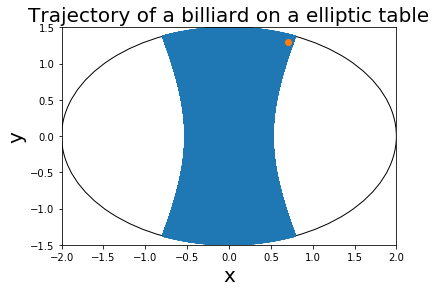

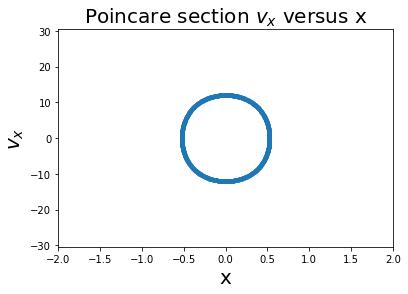


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 5 31
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 3140.0636936215164


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

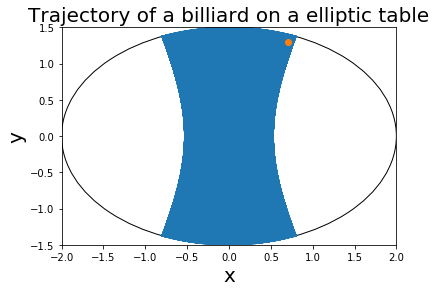

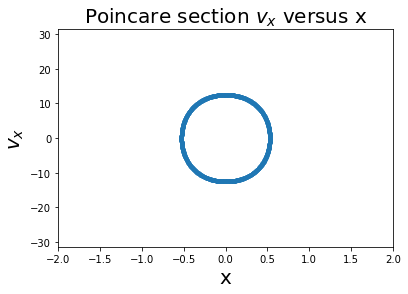


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 5 32
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 3238.826948140329


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

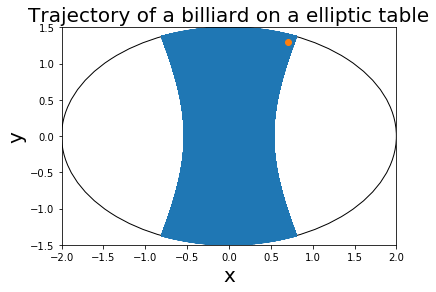

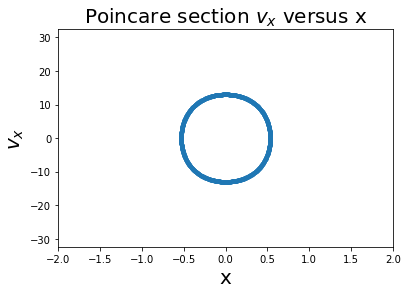


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 5 33
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 3337.6638536557275


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

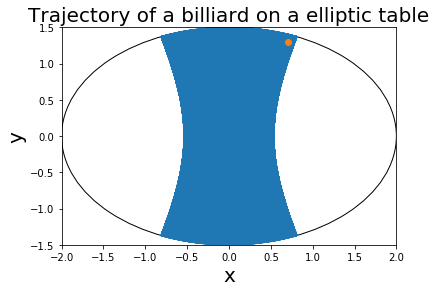

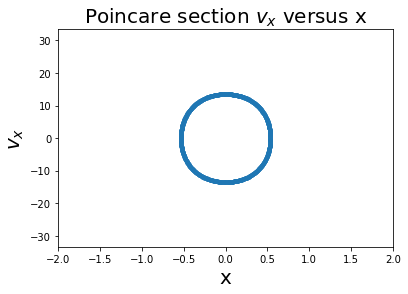


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 5 34
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 3436.5680554879164


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

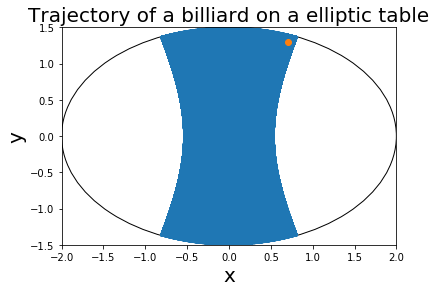

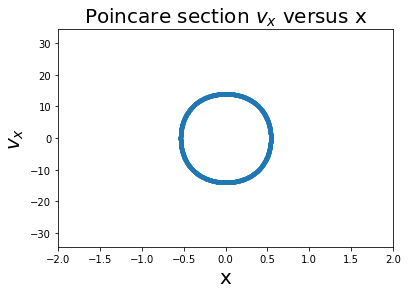


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 5 35
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 3535.533905932738


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

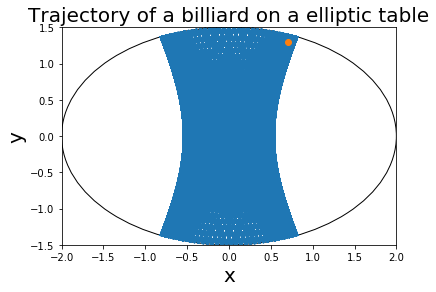

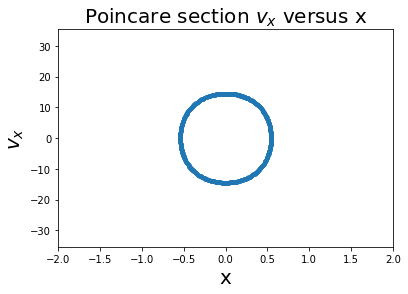


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 5 36
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 3634.556369077249


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

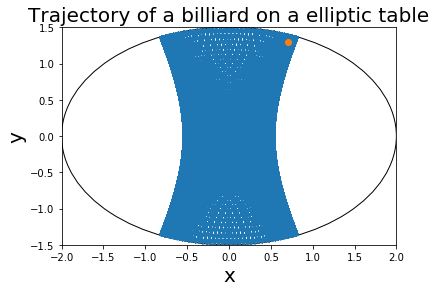

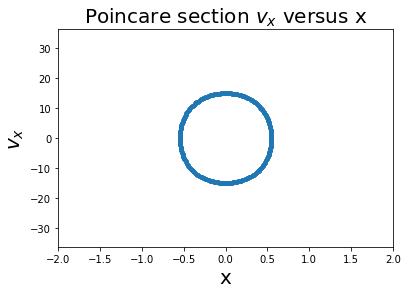


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 5 37
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 3733.630940518894


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

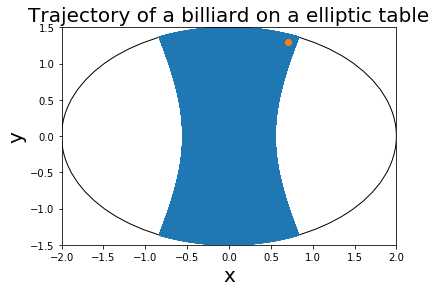

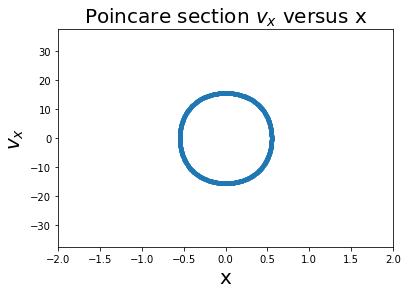


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 5 38
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 3832.75357934736


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

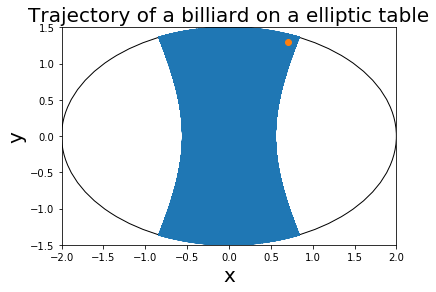

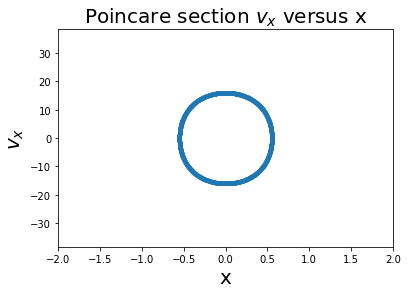


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 5 39
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 3931.9206502675


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

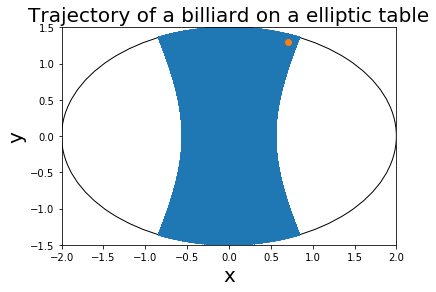

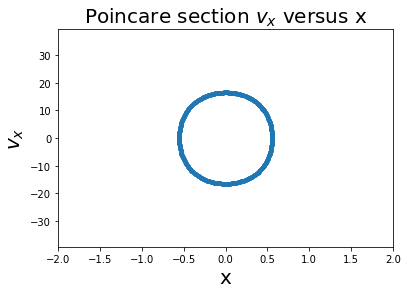


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 5 40
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 4031.1288741492745


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

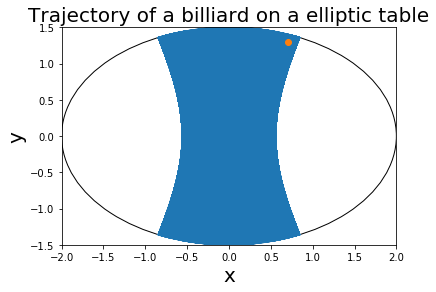

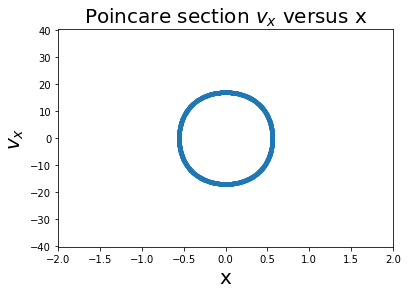


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 5 41
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 4130.375285612677


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

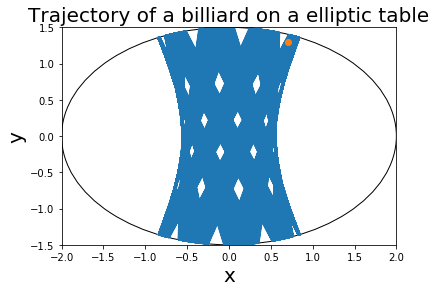

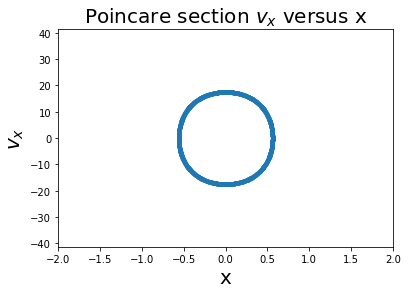


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 5 42
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 4229.65719651132


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

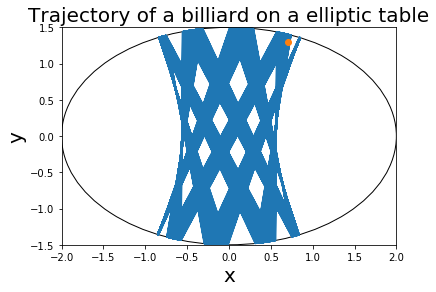

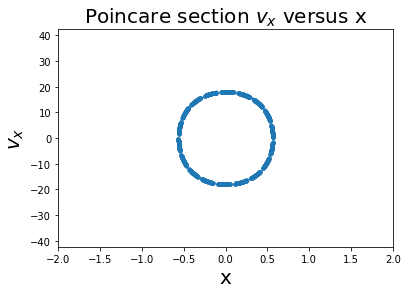


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 5 43
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 4328.972164382672


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

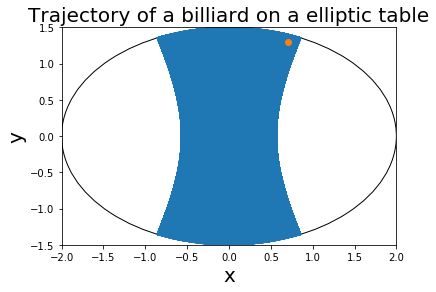

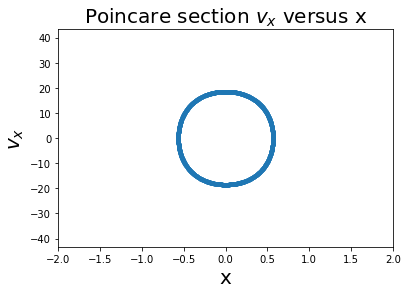


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 5 44
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 4428.317965096906


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

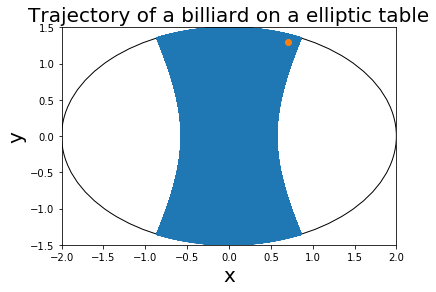

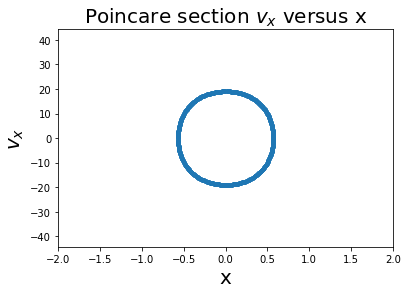


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 5 45
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 4527.6925690687085


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

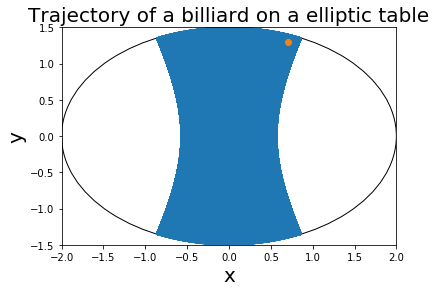

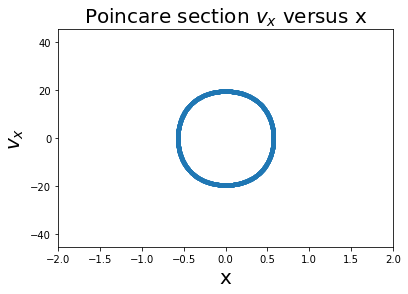


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 5 46
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 4627.09412050371


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

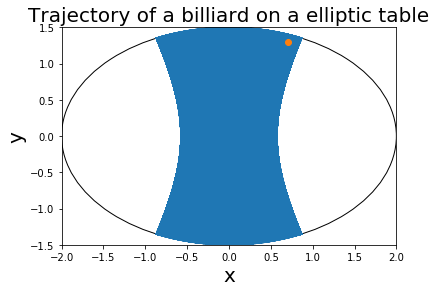

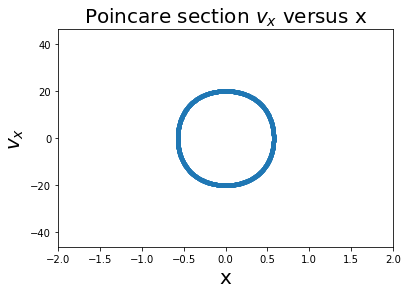


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 5 47
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 4726.52091923859


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

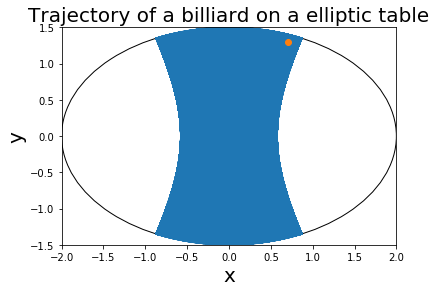

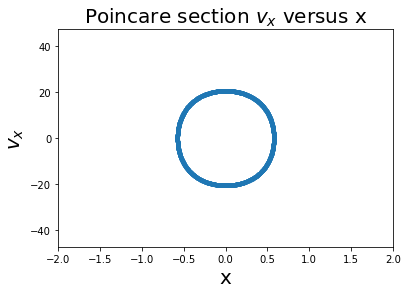


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 5 48
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 4825.971404805462


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

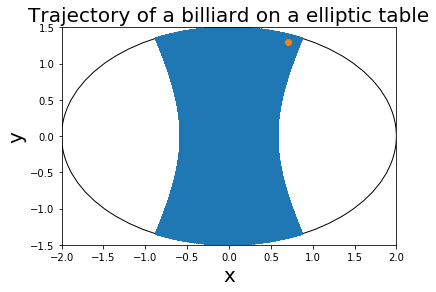

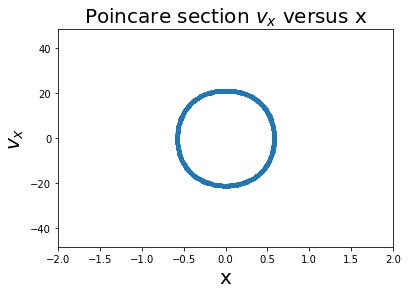


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 5 49
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 4925.4441424099


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

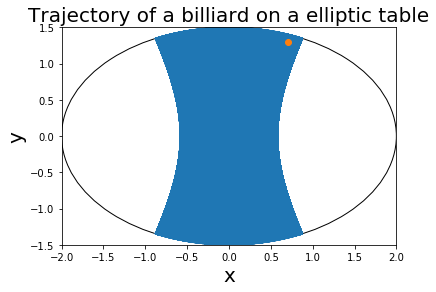

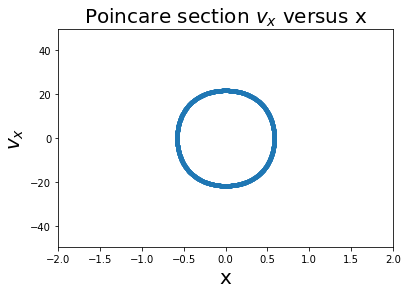


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 6 1
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 608.276253029822


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

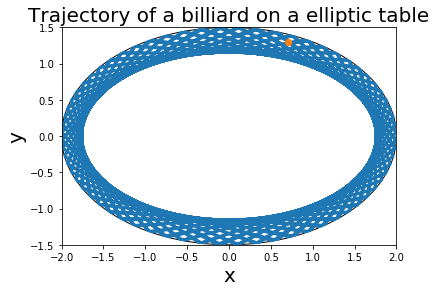

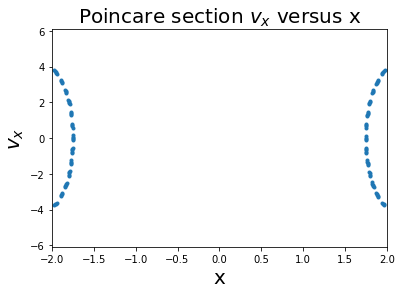


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 6 2
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 632.4555320336759


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

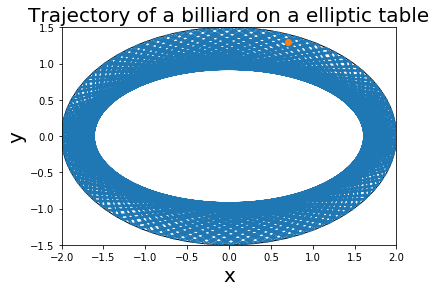

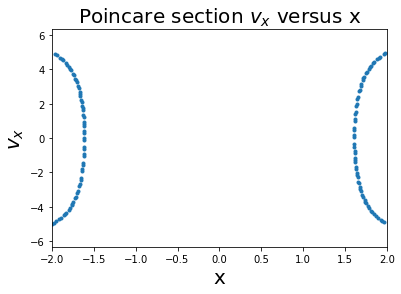


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 6 3
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 670.820393249937


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

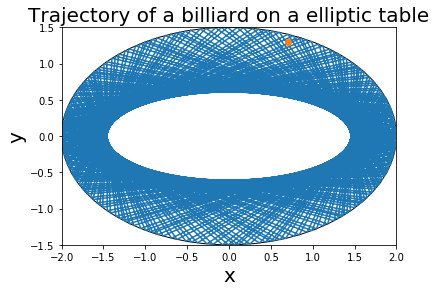

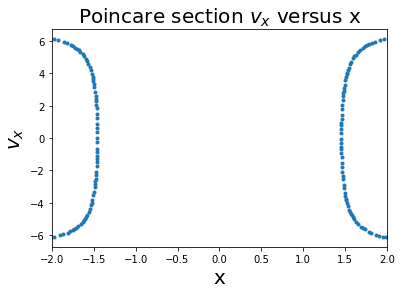


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 6 4
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 721.1102550927978


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

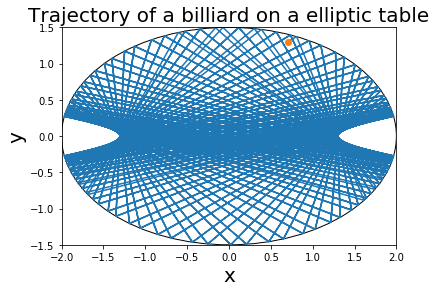

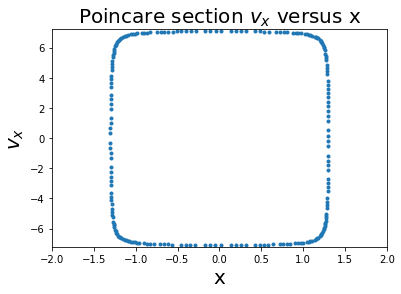


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 6 5
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 781.0249675906654


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

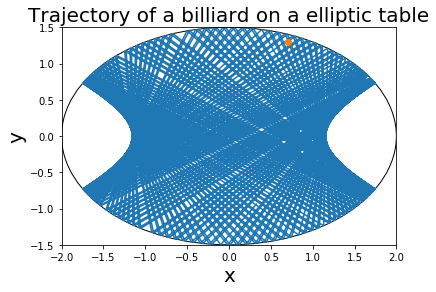

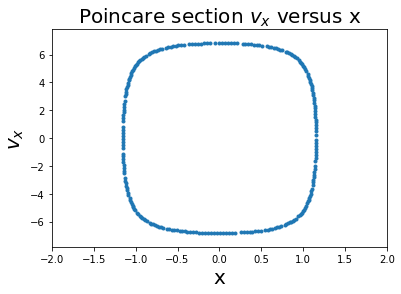


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 6 6
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 848.528137423857


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

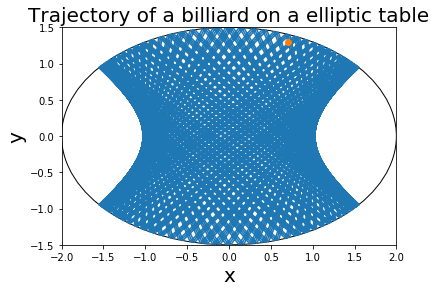

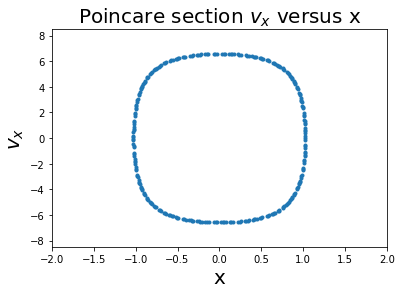


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 6 7
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 921.9544457292888


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

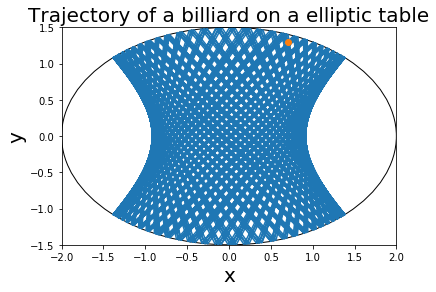

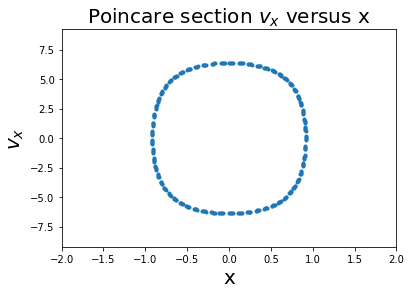


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 6 8
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 1000.0


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

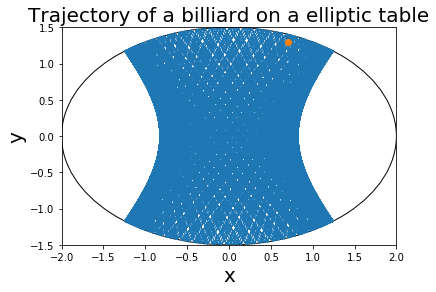

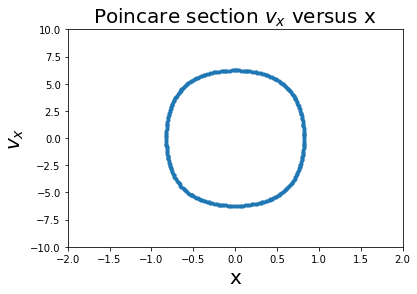


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 6 9
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 1081.6653826391969


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

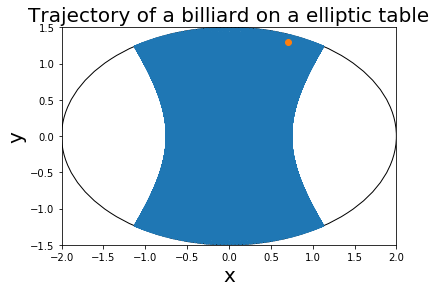

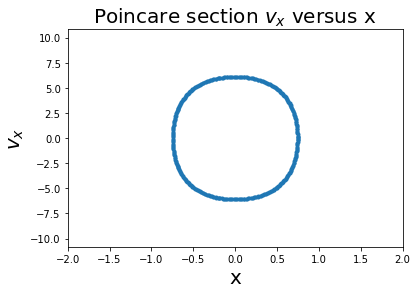


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 6 10
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 1166.1903789690602


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

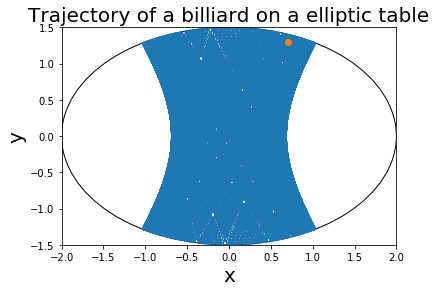

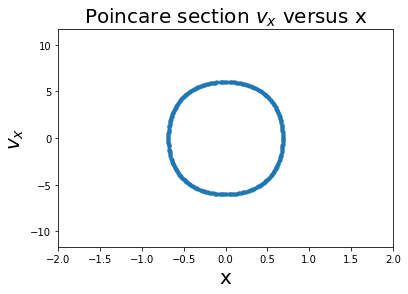


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 6 11
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 1252.9964086141667


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

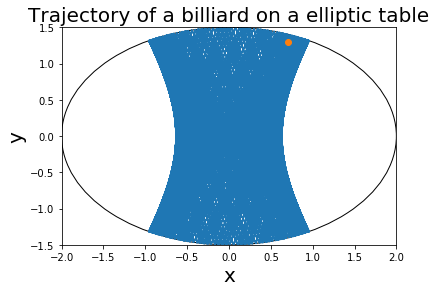

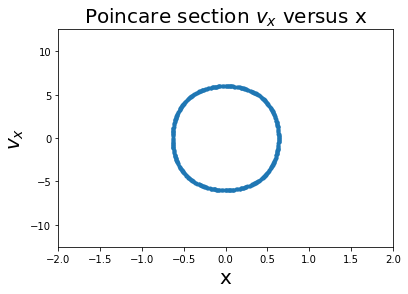


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 6 12
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 1341.640786499874


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

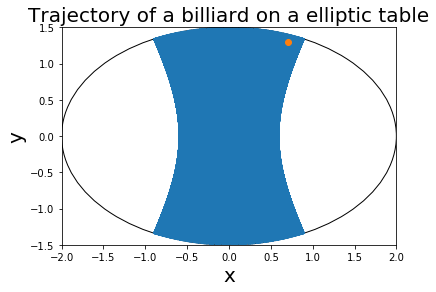

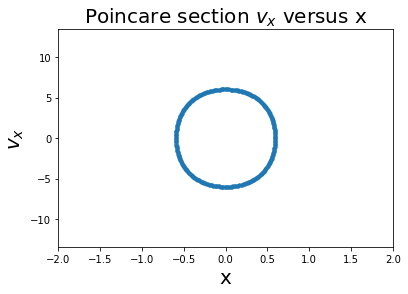


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 6 13
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 1431.7821063276353


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

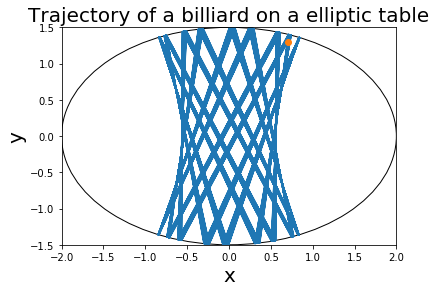

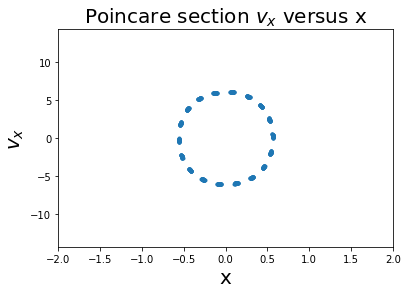


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 6 14
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 1523.1546211727818


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

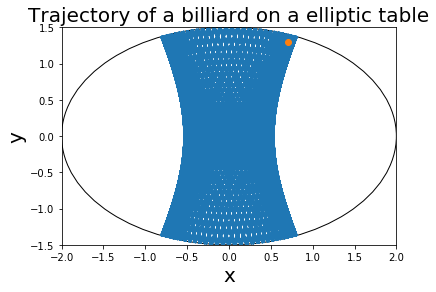

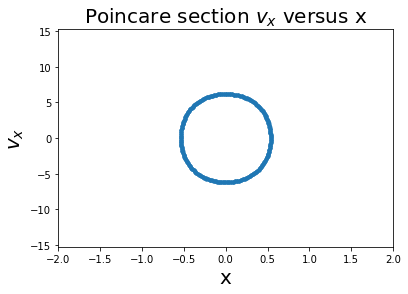


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 6 15
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 1615.549442140351


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

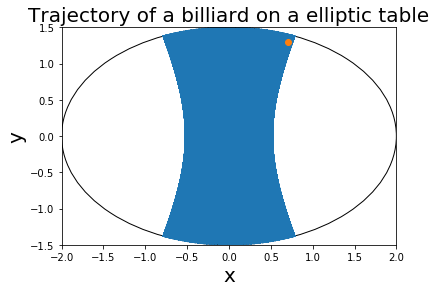

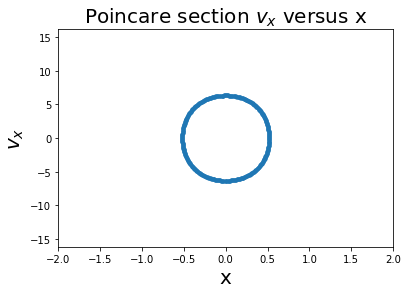


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 6 16
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 1708.8007490635061


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

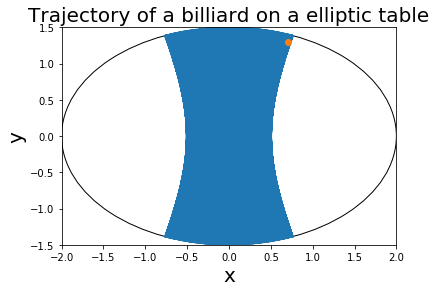

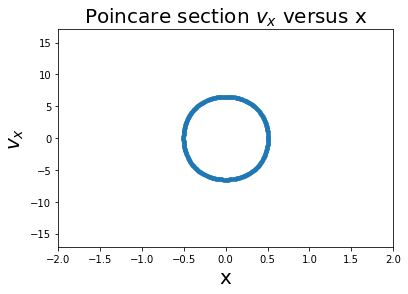


Les vitesses partielles horizontale et verticale de la balle sont respectivement： 6 17
Les demi-axes du mur de collision elliptique sont： 2 1.5
La durée totale de l'exercice est： 100
La distance totale parcourue est： 1802.7756377319947


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


<Figure size 432x288 with 0 Axes>

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
fig = plt.figure()
ims = []
def my_plot(x, y, vx, vy, a, b, total_time):    
    start = billiard_collision_ellipse(x, y, vx, vy, a, b, total_time)
    start.calculate()
    start.show_result()
    start.show_result_ps()
for vx in range(1,50):
    for vy in range(1,50):
        im = my_plot(0.7, 1.3, vx,vy, 2, 1.5, 100)
        ims.append([im])
ani = animation.ArtistAnimation(fig, ims, interval=50, blit=True,
                                repeat_delay=1000)
ani.save('dynamic_images.mp4')
plt.show()